In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
df = pd.read_excel('./Data/BDDanalysis.xlsx')


In [3]:
df.head()

,Revenu_speculation,Prod_Haricot_Valeur,Prod_PetitPois_Valeur,Prod_Soja_Valeur,Prod_Pdt_Valeur,Prod_Manioc_Valeur,Prod_PatateDouce_Valeur,Prod_Colocase_Valeur,Prod_Arachide_Valeur,Prod_Tournesol_Valeur,...,Deplacement_Temporaire,Augmentation_Prix_Food,Augmentation_Prix_Agri,Augmentation_Prix_Betail,Baisse_Prix_Agri,Baisse_Prix_Betail,Obstruction_Vente_Recoltes,Perte_Terres_Proprietes,Perte_Emploi,Deces_Membre_Actif
0,2030000,500000,0,0,0,300000,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
1,179400,225000,0,0,0,30000,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,298000,450000,0,0,67500,150000,0,0,0,0,...,0,1,1,0,1,0,0,0,0,0
3,73000,225000,0,0,0,37500,0,0,0,0,...,0,1,1,0,1,0,0,1,1,0
4,3155000,250000,0,0,0,45000,0,0,0,0,...,0,1,1,1,1,0,0,0,0,0


In [184]:

# Calculer des statistiques descriptives pour les variables intéressantes
statistiques = df[['Revenu_vital_menage', 'Revenu_Reel_Menage', 'Depenses_Annuel']].describe()

# Afficher les statistiques descriptives
print(statistiques)

# Afficher la corrélation entre Revenu_vital_menage et Revenu_Reel_Menage
correlation = df[['Revenu_vital_menage', 'Revenu_Reel_Menage']].corr()
print(correlation)


       Revenu_vital_menage  Revenu_Reel_Menage  Depenses_Annuel
count            383.00000           383.00000        383.00000
mean       3,242,200.00000     2,528,074.02089    590,706.53264
std                0.00000     2,772,626.47849    538,877.39695
min        3,242,200.00000      -391,000.00000     16,100.00000
25%        3,242,200.00000       640,350.00000    248,000.00000
50%        3,242,200.00000     1,674,000.00000    460,000.00000
75%        3,242,200.00000     3,472,000.00000    767,250.00000
max        3,242,200.00000    15,795,000.00000  4,475,000.00000
                     Revenu_vital_menage  Revenu_Reel_Menage
Revenu_vital_menage                  NaN                 NaN
Revenu_Reel_Menage                   NaN             1.00000


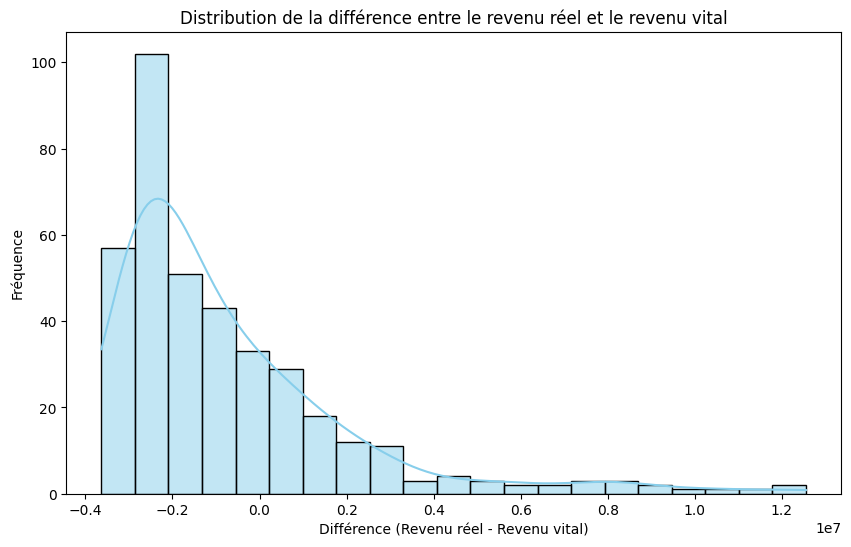

count          383.00000
mean      -714,125.97911
std      2,772,626.47849
min     -3,633,200.00000
25%     -2,601,850.00000
50%     -1,568,200.00000
75%        229,800.00000
max     12,552,800.00000
Name: Difference_Revenu, dtype: float64


In [185]:
# Créer une nouvelle colonne 'Difference_Revenu' pour calculer la différence
df['Difference_Revenu'] = df['Revenu_Reel_Menage'] - df['Revenu_vital_menage']

# Afficher un graphique pour visualiser la différence
plt.figure(figsize=(10, 6))
sns.histplot(df['Difference_Revenu'], kde=True, color='skyblue')
plt.title("Distribution de la différence entre le revenu réel et le revenu vital")
plt.xlabel("Différence (Revenu réel - Revenu vital)")
plt.ylabel("Fréquence")
plt.show()

# Calculer des statistiques descriptives sur la différence de revenu
difference_statistiques = df['Difference_Revenu'].describe()
print(difference_statistiques)


In [186]:
import statsmodels.api as sm

# Définir les variables explicatives (indépendantes) et la variable à prédire (dépendante)
X = df[['Taille_Menage', 'Revenu_Agro_Pastoral', 'Revenu_Autres_Sources', 'Depenses_Annuel', 'Zone_Collecte_Donnees']]
y = df['Revenu_Reel_Menage']

# Ajouter une constante pour l'ordonnée à l'origine
X = sm.add_constant(X)

# Effectuer la régression
model = sm.OLS(y, X).fit()

# Afficher les résultats du modèle
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:     Revenu_Reel_Menage   R-squared:                       0.792
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     287.0
Date:                Mon, 03 Mar 2025   Prob (F-statistic):          4.25e-126
Time:                        16:14:10   Log-Likelihood:                -5924.2
No. Observations:                 383   AIC:                         1.186e+04
Df Residuals:                     377   BIC:                         1.188e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                  5.755e+

In [187]:
from scipy import stats

# Effectuer un ANOVA pour comparer les revenus réels entre les zones
zone_1 = df[df['Zone_Collecte_Donnees'] == 1]['Revenu_Reel_Menage']
zone_2 = df[df['Zone_Collecte_Donnees'] == 2]['Revenu_Reel_Menage']

# Tester l'ANOVA
f_stat, p_val = stats.f_oneway(zone_1, zone_2)

print(f"F-statistique: {f_stat}, p-valeur: {p_val}")

# Si la p-valeur est inférieure à 0.05, vous pouvez rejeter l'hypothèse nulle et conclure que les moyennes sont significativement différentes.


F-statistique: 5.834293072595745, p-valeur: 0.016186599919149964


In [188]:
import statsmodels.api as sm

# Ajoutez les nouvelles variables de production à votre DataFrame
# Exemples : Prod_Haricot_Valeur, Prod_PetitPois_Valeur, etc.
# Assurez-vous que ces colonnes existent dans votre DataFrame 'data' avec les noms exacts.

# Sélectionner toutes les variables indépendantes (y compris les nouvelles variables de production)
X = df[['Taille_Menage', 'Revenu_Agro_Pastoral', 'Revenu_Autres_Sources', 'Depenses_Annuel', 
          'Zone_Collecte_Donnees', 'Prod_Haricot_Valeur', 'Prod_PetitPois_Valeur', 'Prod_Soja_Valeur', 
          'Prod_Pdt_Valeur', 'Prod_Manioc_Valeur', 'Prod_PatateDouce_Valeur', 'Prod_Colocase_Valeur', 
          'Prod_Arachide_Valeur', 'Prod_Tournesol_Valeur', 'Prod_Mais_Valeur', 'Prod_Riz_Valeur', 
          'Prod_Sorgho_Valeur', 'Prod_Cafe_Valeur', 'Prod_Banane_Valeur', 'Prod_valeur_autr_cultur', 
          'Prod_Elevage_Valeur']]  # Liste de toutes les variables explicatives

# Ajouter la constante pour le modèle (intercept)
X = sm.add_constant(X)

# Définir la variable dépendante (Revenu réel du ménage)
y = df['Revenu_Reel_Menage']

# Ajuster le modèle OLS
model = sm.OLS(y, X).fit()

# Afficher les résultats du modèle
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:     Revenu_Reel_Menage   R-squared:                       0.809
Model:                            OLS   Adj. R-squared:                  0.799
Method:                 Least Squares   F-statistic:                     81.17
Date:                Mon, 03 Mar 2025   Prob (F-statistic):          5.70e-118
Time:                        16:14:10   Log-Likelihood:                -5907.4
No. Observations:                 383   AIC:                         1.185e+04
Df Residuals:                     363   BIC:                         1.193e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                    4

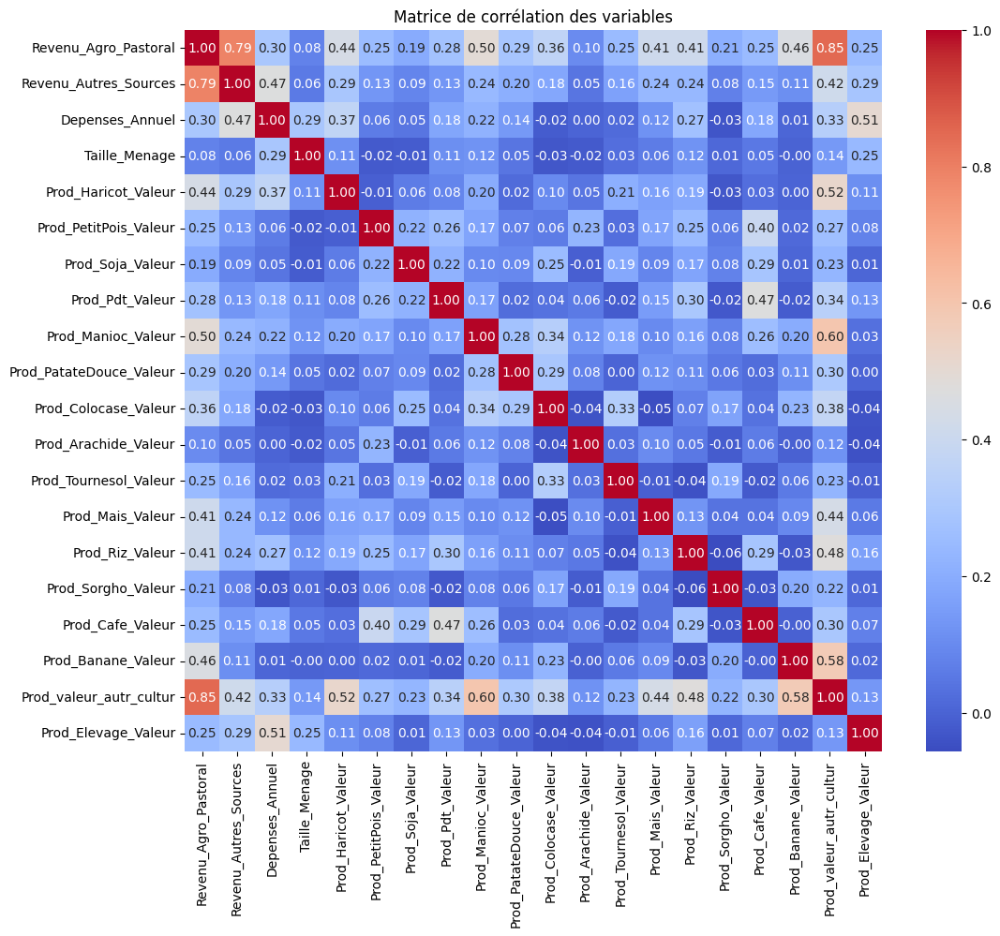

In [189]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculer la matrice de corrélation des variables numériques
correlation_matrix = df[['Revenu_Agro_Pastoral', 'Revenu_Autres_Sources', 'Depenses_Annuel', 
                           'Taille_Menage', 'Prod_Haricot_Valeur', 'Prod_PetitPois_Valeur', 'Prod_Soja_Valeur', 
                           'Prod_Pdt_Valeur', 'Prod_Manioc_Valeur', 'Prod_PatateDouce_Valeur', 'Prod_Colocase_Valeur', 
                           'Prod_Arachide_Valeur', 'Prod_Tournesol_Valeur', 'Prod_Mais_Valeur', 'Prod_Riz_Valeur', 
                           'Prod_Sorgho_Valeur', 'Prod_Cafe_Valeur', 'Prod_Banane_Valeur', 'Prod_valeur_autr_cultur', 
                           'Prod_Elevage_Valeur']].corr()

# Visualiser la matrice de corrélation
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Matrice de corrélation des variables')
plt.show()


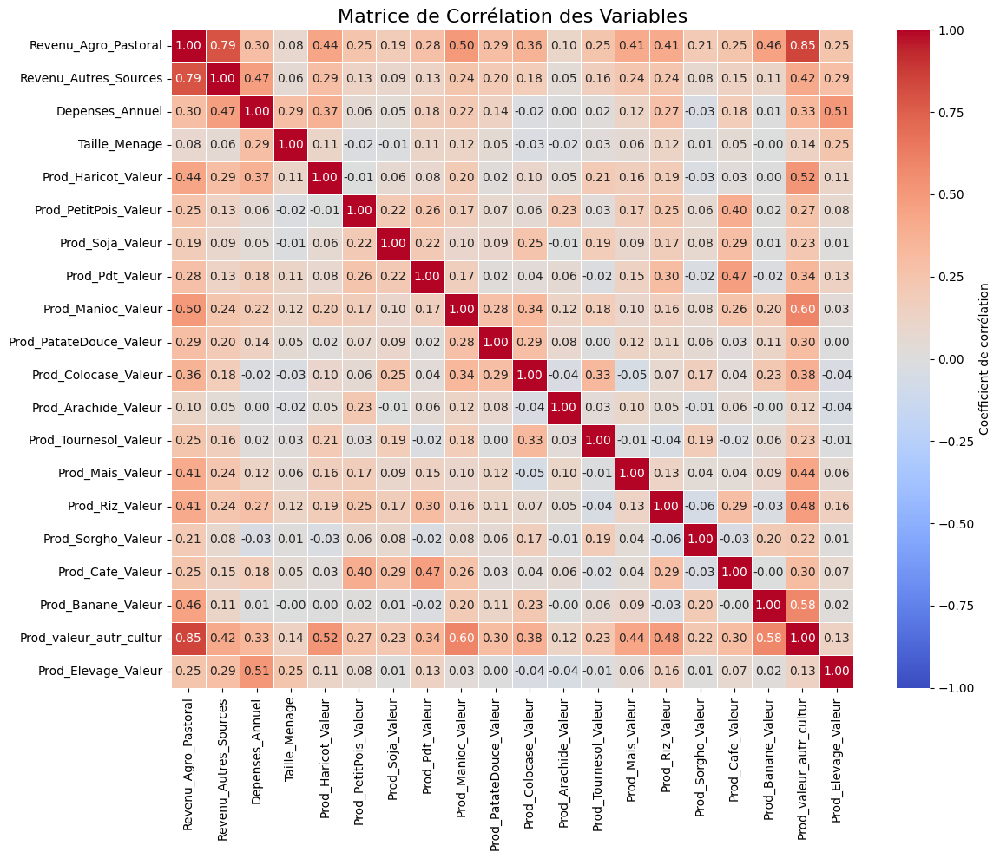

In [190]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calcul de la matrice de corrélation
correlation_matrix = df[['Revenu_Agro_Pastoral', 'Revenu_Autres_Sources', 'Depenses_Annuel', 
                           'Taille_Menage', 'Prod_Haricot_Valeur', 'Prod_PetitPois_Valeur', 
                           'Prod_Soja_Valeur', 'Prod_Pdt_Valeur', 'Prod_Manioc_Valeur', 
                           'Prod_PatateDouce_Valeur', 'Prod_Colocase_Valeur', 'Prod_Arachide_Valeur', 
                           'Prod_Tournesol_Valeur', 'Prod_Mais_Valeur', 'Prod_Riz_Valeur', 
                           'Prod_Sorgho_Valeur', 'Prod_Cafe_Valeur', 'Prod_Banane_Valeur', 
                           'Prod_valeur_autr_cultur', 'Prod_Elevage_Valeur']].corr()

# Heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 10},
            cbar_kws={'label': 'Coefficient de corrélation'}, linewidths=0.5, vmin=-1, vmax=1)
plt.title('Matrice de Corrélation des Variables', fontsize=16)
plt.tight_layout()
plt.show()


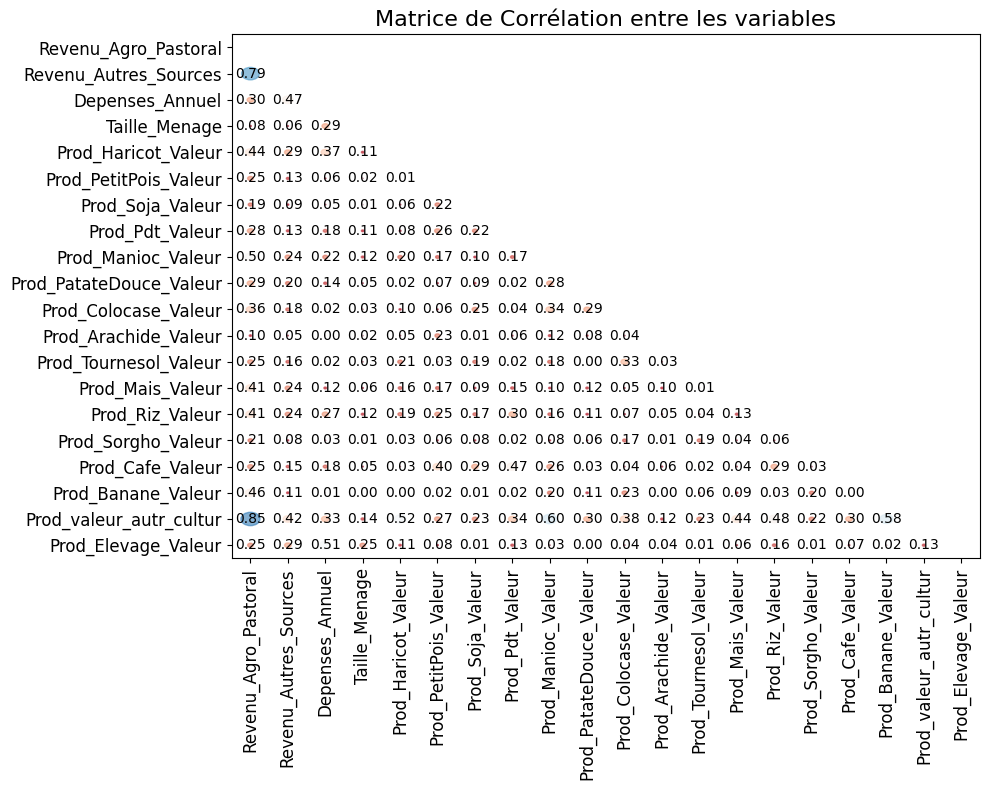

In [191]:
import numpy as np

# Créer une figure et un axe
fig, ax = plt.subplots(figsize=(10, 8))

# Extraire la matrice de corrélation sous forme de DataFrame
corr = correlation_matrix.abs()

# Tracer les bulles
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        circle = plt.Circle((j, i), corr.iloc[i, j] * 0.3, color=plt.cm.RdBu(corr.iloc[i, j]), alpha=0.6)
        ax.add_artist(circle)
        ax.text(j, i, f'{corr.iloc[i, j]:.2f}', horizontalalignment='center', verticalalignment='center', fontsize=10, color='black')

# Configurer les axes
ax.set_xlim(-0.5, len(correlation_matrix.columns) - 0.5)
ax.set_ylim(len(correlation_matrix.columns) - 0.5, -0.5)
ax.set_xticks(np.arange(len(correlation_matrix.columns)))
ax.set_yticks(np.arange(len(correlation_matrix.columns)))
ax.set_xticklabels(correlation_matrix.columns, rotation=90, fontsize=12)
ax.set_yticklabels(correlation_matrix.columns, fontsize=12)
ax.set_title('Matrice de Corrélation entre les variables', fontsize=16)
plt.tight_layout()
plt.show()


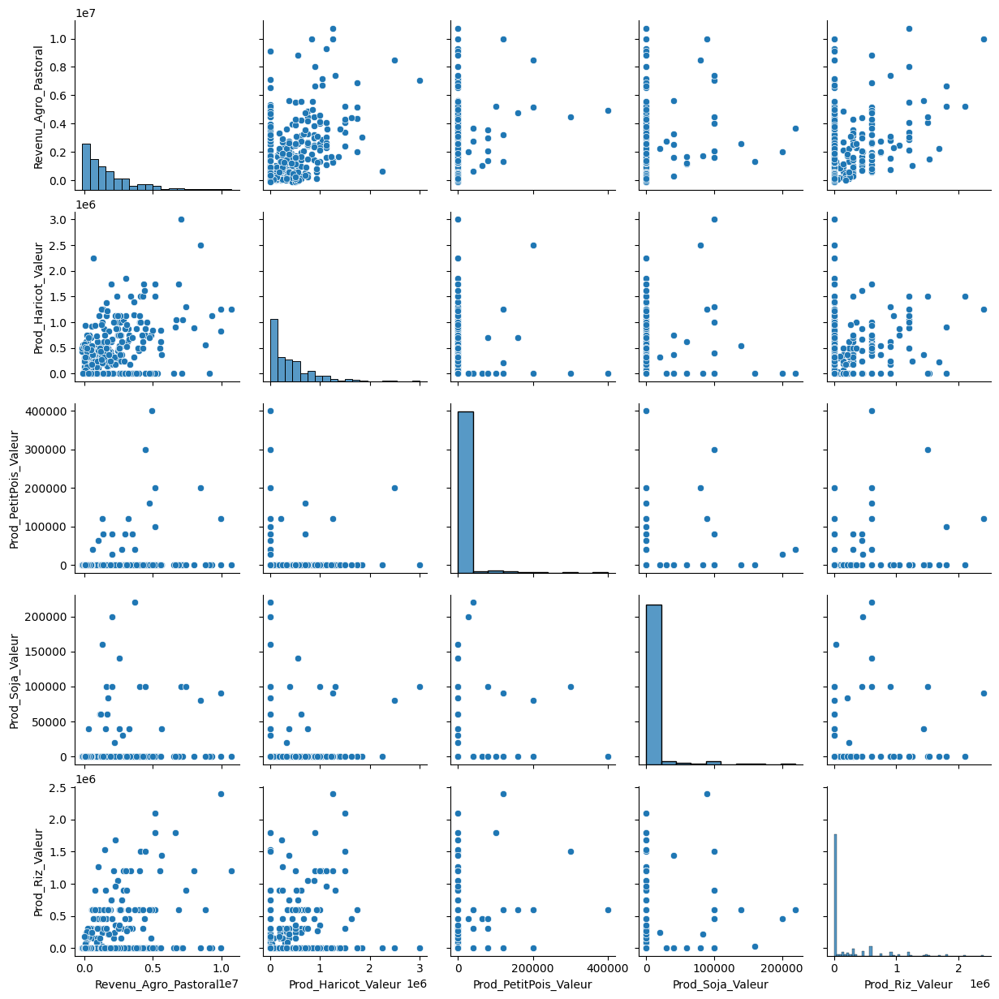

In [192]:
import seaborn as sns
import matplotlib.pyplot as plt

# Sélectionner des paires de variables à analyser
pairs = [('Revenu_Agro_Pastoral', 'Prod_Haricot_Valeur'),
         ('Revenu_Agro_Pastoral', 'Prod_PetitPois_Valeur'),
         ('Revenu_Agro_Pastoral', 'Prod_Soja_Valeur'),
         ('Revenu_Agro_Pastoral', 'Prod_Riz_Valeur')]

# Créer les scatter plots
sns.pairplot(df[['Revenu_Agro_Pastoral', 'Prod_Haricot_Valeur', 'Prod_PetitPois_Valeur', 
                   'Prod_Soja_Valeur', 'Prod_Riz_Valeur']])

plt.show()


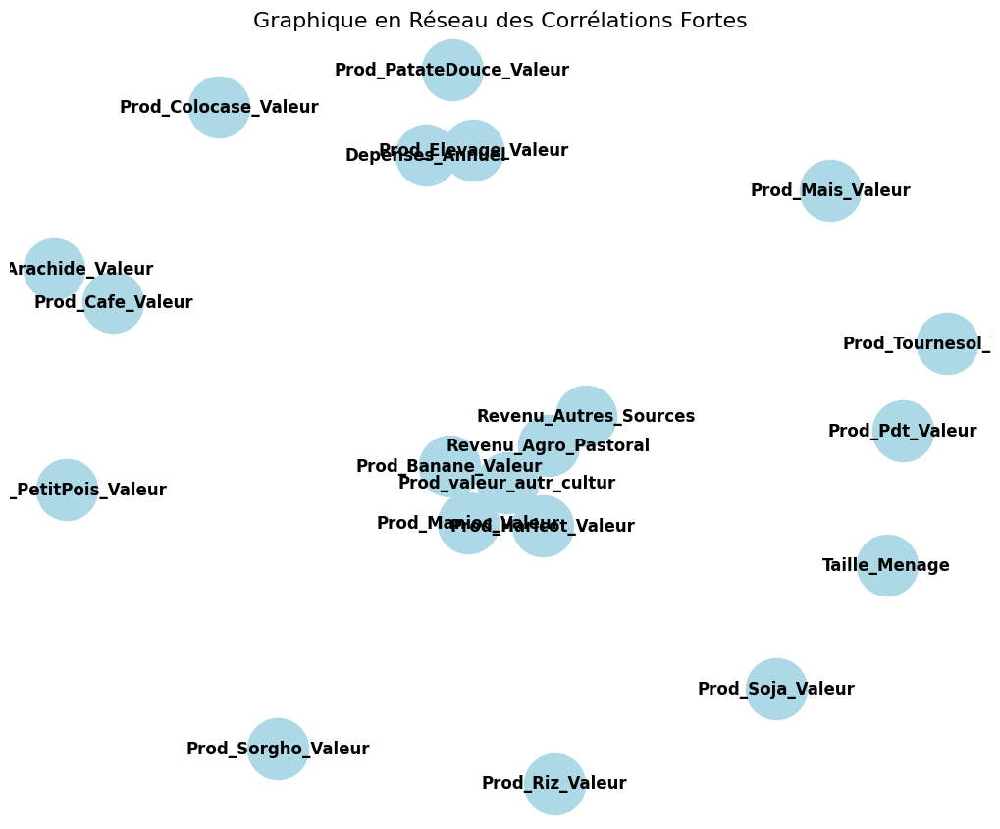

In [193]:
import networkx as nx

# Créer un graphe vide
G = nx.Graph()

# Ajouter des nœuds (variables)
G.add_nodes_from(correlation_matrix.columns)

# Ajouter des arêtes en fonction des corrélations fortes
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if correlation_matrix.iloc[i, j] > 0.5:  # Corrélation supérieure à 0.5
            G.add_edge(correlation_matrix.columns[i], correlation_matrix.columns[j], weight=correlation_matrix.iloc[i, j])

# Tracer le graphe
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G)  # Disposition en ressort pour les nœuds
nx.draw(G, pos, with_labels=True, node_size=2000, font_size=12, font_weight='bold', node_color='lightblue', edge_color='gray')
plt.title('Graphique en Réseau des Corrélations Fortes', fontsize=16)
plt.show()


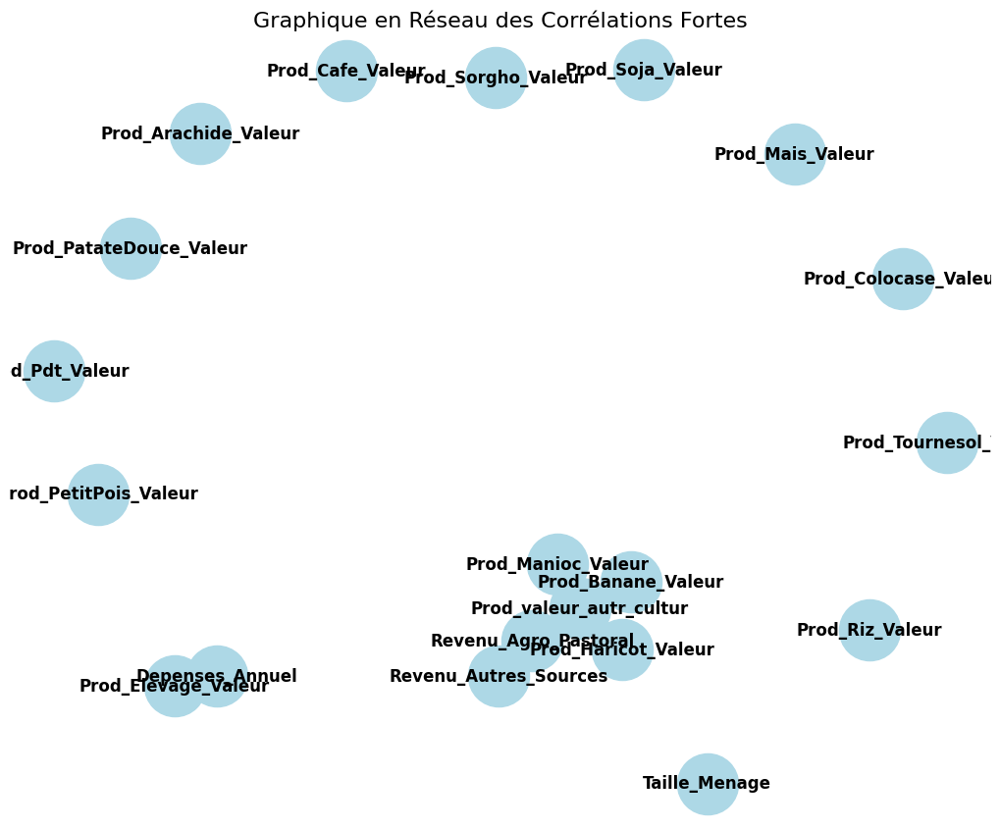

In [194]:
import networkx as nx

# Créer un graphe vide
G = nx.Graph()

# Ajouter des nœuds (variables)
G.add_nodes_from(correlation_matrix.columns)

# Ajouter des arêtes en fonction des corrélations fortes
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if correlation_matrix.iloc[i, j] > 0.5:  # Corrélation supérieure à 0.5
            G.add_edge(correlation_matrix.columns[i], correlation_matrix.columns[j], weight=correlation_matrix.iloc[i, j])

# Tracer le graphe
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G)  # Disposition en ressort pour les nœuds
nx.draw(G, pos, with_labels=True, node_size=2000, font_size=12, font_weight='bold', node_color='lightblue', edge_color='gray')
plt.title('Graphique en Réseau des Corrélations Fortes', fontsize=16)
plt.show()


Matrice des coefficients de corrélation :
                        Revenu_Agro_Pastoral Revenu_Autres_Sources Depenses_Annuel Taille_Menage Prod_Haricot_Valeur Prod_PetitPois_Valeur Prod_Soja_Valeur Prod_Pdt_Valeur Prod_Manioc_Valeur Prod_PatateDouce_Valeur Prod_Colocase_Valeur Prod_Arachide_Valeur Prod_Tournesol_Valeur Prod_Mais_Valeur Prod_Riz_Valeur Prod_Sorgho_Valeur Prod_Cafe_Valeur Prod_Banane_Valeur Prod_valeur_autr_cultur Prod_Elevage_Valeur
Revenu_Agro_Pastoral                 1.00000                   NaN             NaN           NaN                 NaN                   NaN              NaN             NaN                NaN                     NaN                  NaN                  NaN                   NaN              NaN             NaN                NaN              NaN                NaN                     NaN                 NaN
Revenu_Autres_Sources                    NaN               1.00000             NaN           NaN                 NaN                   N

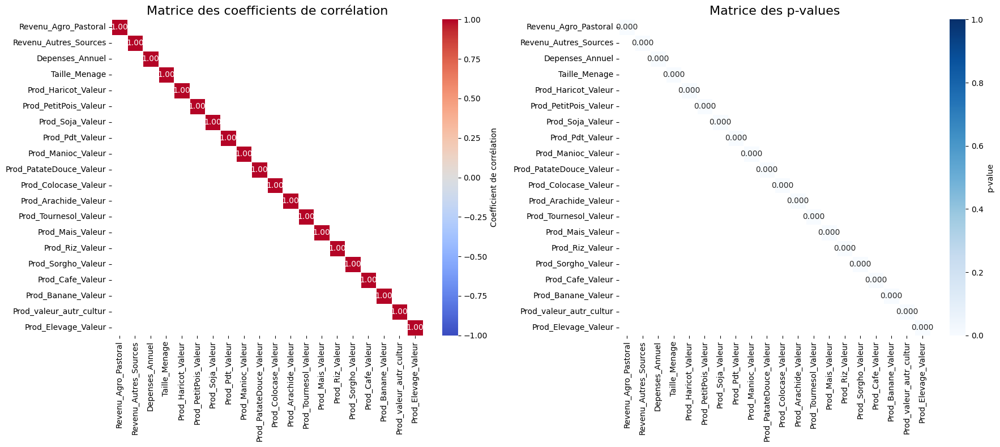

In [195]:
# Importation nécessaire
from scipy.stats import pearsonr
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Calcul de la matrice de corrélation entre toutes les variables
variables = ['Revenu_Agro_Pastoral', 'Revenu_Autres_Sources', 'Depenses_Annuel', 
             'Taille_Menage', 'Prod_Haricot_Valeur', 'Prod_PetitPois_Valeur', 
             'Prod_Soja_Valeur', 'Prod_Pdt_Valeur', 'Prod_Manioc_Valeur', 
             'Prod_PatateDouce_Valeur', 'Prod_Colocase_Valeur', 'Prod_Arachide_Valeur', 
             'Prod_Tournesol_Valeur', 'Prod_Mais_Valeur', 'Prod_Riz_Valeur', 
             'Prod_Sorgho_Valeur', 'Prod_Cafe_Valeur', 'Prod_Banane_Valeur', 
             'Prod_valeur_autr_cultur', 'Prod_Elevage_Valeur']

# Créer une dataframe des variables sélectionnées
data_selected = df[variables]

# Créer une nouvelle dataframe pour stocker les coefficients de corrélation et les p-values
corr_matrix = pd.DataFrame(index=variables, columns=variables)
p_values_matrix = pd.DataFrame(index=variables, columns=variables)

# Calcul des coefficients de corrélation et des p-values
for i in range(len(variables)):
    for j in range(i + 1):
        var1 = variables[i]
        var2 = variables[j]
        
        # Calcul du coefficient de corrélation et p-value
        corr, p_value = pearsonr(data_selected[var1], data_selected[var2])
        
        # Stockage dans les matrices
        corr_matrix.loc[var1, var2] = corr
        p_values_matrix.loc[var1, var2] = p_value

# Remplir la partie inférieure de la matrice pour que ce soit symétrique
for i in range(len(variables)):
    for j in range(i + 1, len(variables)):
        corr_matrix.iloc[j, i] = corr_matrix.iloc[i, j]
        p_values_matrix.iloc[j, i] = p_values_matrix.iloc[i, j]

# Affichage de la matrice de corrélation avec les p-values
print("Matrice des coefficients de corrélation :")
print(corr_matrix)

print("\nMatrice des p-values :")
print(p_values_matrix)

# Visualisation sous forme de heatmap
fig, ax = plt.subplots(1, 2, figsize=(18, 8))

# Heatmap pour les coefficients de corrélation
sns.heatmap(corr_matrix.astype(float), annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 10},
            cbar_kws={'label': 'Coefficient de corrélation'}, linewidths=0.5, vmin=-1, vmax=1, ax=ax[0])
ax[0].set_title('Matrice des coefficients de corrélation', fontsize=16)

# Heatmap pour les p-values
sns.heatmap(p_values_matrix.astype(float), annot=True, cmap='Blues', fmt='.3f', annot_kws={"size": 10},
            cbar_kws={'label': 'p-value'}, linewidths=0.5, vmin=0, vmax=1, ax=ax[1])
ax[1].set_title('Matrice des p-values', fontsize=16)

plt.tight_layout()
plt.show()


Matrice des coefficients de corrélation :
                        Revenu_Agro_Pastoral Revenu_Autres_Sources Depenses_Annuel Taille_Menage Prod_Haricot_Valeur Prod_PetitPois_Valeur Prod_Soja_Valeur Prod_Pdt_Valeur Prod_Manioc_Valeur Prod_PatateDouce_Valeur Prod_Colocase_Valeur Prod_Arachide_Valeur Prod_Tournesol_Valeur Prod_Mais_Valeur Prod_Riz_Valeur Prod_Sorgho_Valeur Prod_Cafe_Valeur Prod_Banane_Valeur Prod_valeur_autr_cultur Prod_Elevage_Valeur
Revenu_Agro_Pastoral                 1.00000                   NaN             NaN           NaN                 NaN                   NaN              NaN             NaN                NaN                     NaN                  NaN                  NaN                   NaN              NaN             NaN                NaN              NaN                NaN                     NaN                 NaN
Revenu_Autres_Sources                    NaN               1.00000             NaN           NaN                 NaN                   N

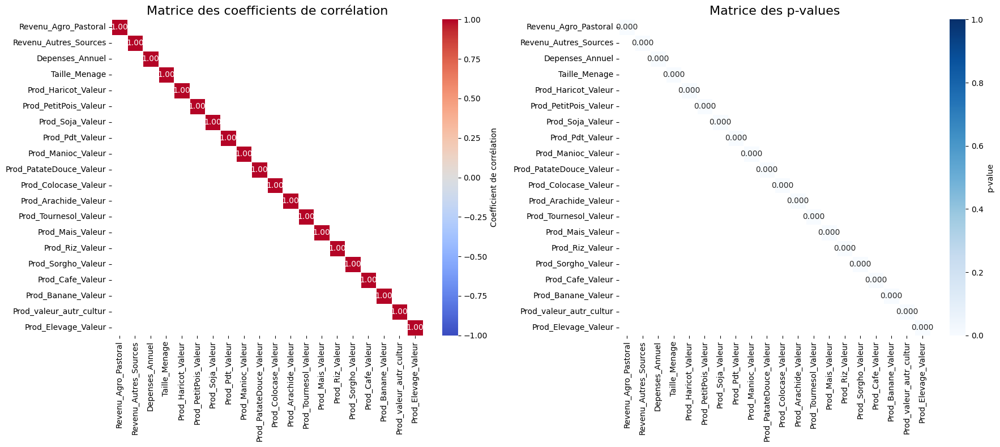

In [196]:
# Importation nécessaire
from scipy.stats import pearsonr
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Calcul de la matrice de corrélation entre toutes les variables
variables = ['Revenu_Agro_Pastoral', 'Revenu_Autres_Sources', 'Depenses_Annuel', 
             'Taille_Menage', 'Prod_Haricot_Valeur', 'Prod_PetitPois_Valeur', 
             'Prod_Soja_Valeur', 'Prod_Pdt_Valeur', 'Prod_Manioc_Valeur', 
             'Prod_PatateDouce_Valeur', 'Prod_Colocase_Valeur', 'Prod_Arachide_Valeur', 
             'Prod_Tournesol_Valeur', 'Prod_Mais_Valeur', 'Prod_Riz_Valeur', 
             'Prod_Sorgho_Valeur', 'Prod_Cafe_Valeur', 'Prod_Banane_Valeur', 
             'Prod_valeur_autr_cultur', 'Prod_Elevage_Valeur']

# Créer une dataframe des variables sélectionnées
data_selected = df[variables]

# Créer une nouvelle dataframe pour stocker les coefficients de corrélation et les p-values
corr_matrix = pd.DataFrame(index=variables, columns=variables)
p_values_matrix = pd.DataFrame(index=variables, columns=variables)

# Calcul des coefficients de corrélation et des p-values
for i in range(len(variables)):
    for j in range(i + 1):
        var1 = variables[i]
        var2 = variables[j]
        
        # Calcul du coefficient de corrélation et p-value
        corr, p_value = pearsonr(data_selected[var1], data_selected[var2])
        
        # Stockage dans les matrices
        corr_matrix.loc[var1, var2] = corr
        p_values_matrix.loc[var1, var2] = p_value

# Remplir la partie inférieure de la matrice pour que ce soit symétrique
for i in range(len(variables)):
    for j in range(i + 1, len(variables)):
        corr_matrix.iloc[j, i] = corr_matrix.iloc[i, j]
        p_values_matrix.iloc[j, i] = p_values_matrix.iloc[i, j]

# Affichage de la matrice de corrélation avec les p-values
print("Matrice des coefficients de corrélation :")
print(corr_matrix)

print("\nMatrice des p-values :")
print(p_values_matrix)

# Visualisation sous forme de heatmap
fig, ax = plt.subplots(1, 2, figsize=(18, 8))

# Heatmap pour les coefficients de corrélation
sns.heatmap(corr_matrix.astype(float), annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 10},
            cbar_kws={'label': 'Coefficient de corrélation'}, linewidths=0.5, vmin=-1, vmax=1, ax=ax[0])
ax[0].set_title('Matrice des coefficients de corrélation', fontsize=16)

# Heatmap pour les p-values
sns.heatmap(p_values_matrix.astype(float), annot=True, cmap='Blues', fmt='.3f', annot_kws={"size": 10},
            cbar_kws={'label': 'p-value'}, linewidths=0.5, vmin=0, vmax=1, ax=ax[1])
ax[1].set_title('Matrice des p-values', fontsize=16)

plt.tight_layout()
plt.show()


In [197]:
import pandas as pd
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import numpy as np

# Sélectionner les variables pertinentes
variables = ['Revenu_speculation', 'Prod_Haricot_Valeur', 'Prod_Soja_Valeur', 'Prod_Tournesol_Valeur',
             'Superf_total_menage', 'Terre_cultivable', 'Mode_Acces_terre', 'Semences_selectionne', 
             'Mecanisation', 'Encadr_agronomique',  
             'cultures_perennes_an', 'Niveau_Irrigation']

# Supposons que 'df' est votre DataFrame contenant les données
data_selected = df[variables].dropna()  # Supprimer les lignes avec des valeurs manquantes

# Définir les variables indépendantes (X) et la variable dépendante (y)
X = data_selected.drop(columns=['Revenu_speculation'])
y = data_selected['Revenu_speculation']

# Ajouter une constante pour l'intercept dans le modèle
X = sm.add_constant(X)

# Diviser les données en ensembles d'entraînement et de test (80/20)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Créer un modèle de régression linéaire
model = sm.OLS(y_train, X_train).fit()

# Résultats du modèle
print(model.summary())

# Prédictions sur l'ensemble de test
y_pred = model.predict(X_test)

# Évaluer le modèle
from sklearn.metrics import mean_squared_error, r2_score

# Calculer l'erreur quadratique moyenne (MSE)
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error (MSE): {mse}")

# Calculer le R²
r2 = r2_score(y_test, y_pred)
print(f"R²: {r2}")


                            OLS Regression Results                            
Dep. Variable:     Revenu_speculation   R-squared:                       0.075
Model:                            OLS   Adj. R-squared:                  0.038
Method:                 Least Squares   F-statistic:                     2.020
Date:                Mon, 03 Mar 2025   Prob (F-statistic):             0.0266
Time:                        16:14:49   Log-Likelihood:                -4445.8
No. Observations:                 288   AIC:                             8916.
Df Residuals:                     276   BIC:                             8960.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                   8.72e+

In [198]:
import pulp

# Définir le problème d'optimisation
model = pulp.LpProblem("Optimisation des cultures", pulp.LpMaximize)

# Variables de décision : quantité de chaque culture à produire
prod_haricot = pulp.LpVariable("Prod_Haricot", lowBound=0, cat="Continuous")
prod_soja = pulp.LpVariable("Prod_Soja", lowBound=0, cat="Continuous")
prod_tournesol = pulp.LpVariable("Prod_Tournesol", lowBound=0, cat="Continuous")

# Fonction objectif : Maximiser le revenu
# Par exemple, supposons que les revenus par culture sont respectivement 100, 120 et 80 par unité
model += 100 * prod_haricot + 120 * prod_soja + 80 * prod_tournesol, "Revenu Total"

# Contraintes :
# 1. La superficie totale cultivable est limitée (par exemple, 10 hectares)
# 2. La superficie de chaque culture est également limitée
model += prod_haricot + prod_soja + prod_tournesol <= 10, "Superficie Totale"

# Autres contraintes possibles :
# 3. Le niveau d'irrigation (exemple : max 50% des terres irrigables)
model += 0.5 * (prod_haricot + prod_soja + prod_tournesol) <= 5, "Niveau Irrigation"

# Résoudre le problème d'optimisation
model.solve()

# Afficher les résultats
print(f"Production optimale de Haricot : {prod_haricot.varValue} hectares")
print(f"Production optimale de Soja : {prod_soja.varValue} hectares")
print(f"Production optimale de Tournesol : {prod_tournesol.varValue} hectares")

# Calcul du revenu optimal
optimal_revenue = pulp.value(model.objective)
print(f"Revenu optimal : {optimal_revenue} unités monétaires")


Production optimale de Haricot : 0.0 hectares
Production optimale de Soja : 10.0 hectares
Production optimale de Tournesol : 0.0 hectares
Revenu optimal : 1200.0 unités monétaires


c:\Users\Audace\AppData\Local\Programs\Python\Python312\Lib\site-packages\pulp\pulp.py:1298: UserWarning: Spaces are not permitted in the name. Converted to '_'
  warnings.warn("Spaces are not permitted in the name. Converted to '_'")


In [199]:
import pandas as pd
from semopy import Model
import numpy as np

# Supposons que vous avez un DataFrame `df` avec toutes vos données

# Exemple de création d'un modèle SEM basé sur vos relations
model_desc = """
# Equations de structure
Revenu_Agro_Pastoral ~ Superf_total_menage + Revenu_speculation + Acces_terre + Encadr_agronomique + Mode_Acces_terre + Experience_Agricole
Classement_SCA ~ Revenu_Agro_Pastoral + Strategie_Survie_Alimentaire + Pluies_Excessives + Maladie_Cultures + Augmentation_Prix_Food
Revenu_Reel_Menage ~ Revenu_Agro_Pastoral + Revenu_Autres_Sources
"""

# Créez un modèle SEM avec la description ci-dessus
model = Model(model_desc)

# Charger vos données dans le modèle
# Assurez-vous que les données sont sous forme d'un DataFrame pandas et contiennent toutes les variables nécessaires
# df doit être un DataFrame pandas contenant les données pour le ménage
# Par exemple : df = pd.read_csv("data.csv")
model.fit(df)

# Vous pouvez maintenant obtenir les résultats de votre modèle
results = model.inspect()

# Affiche les résultats
print(results)


                    lval  op                          rval                Estimate              Std. Err  z-value  p-value
0   Revenu_Agro_Pastoral   ~           Superf_total_menage                 8.91485               2.63314  3.38563  0.00071
1   Revenu_Agro_Pastoral   ~            Revenu_speculation                 0.51088               0.05133  9.95323  0.00000
2   Revenu_Agro_Pastoral   ~                   Acces_terre                 0.00242         310,353.40178  0.00000  1.00000
3   Revenu_Agro_Pastoral   ~            Encadr_agronomique                 0.00411         149,959.72273  0.00000  1.00000
4   Revenu_Agro_Pastoral   ~              Mode_Acces_terre                -0.00416          85,162.24740 -0.00000  1.00000
5   Revenu_Agro_Pastoral   ~           Experience_Agricole                 0.00077         116,204.47562  0.00000  1.00000
6         Classement_SCA   ~          Revenu_Agro_Pastoral                 0.00000               0.00000  2.56261  0.01039
7         Classe

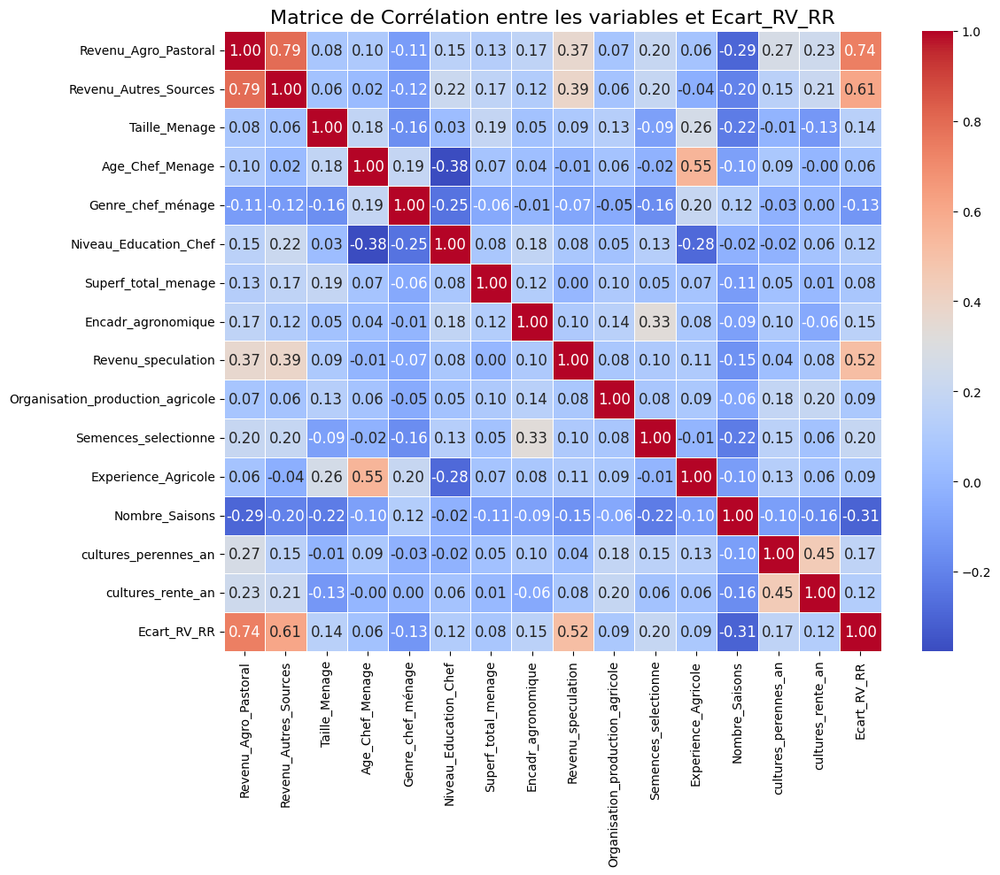

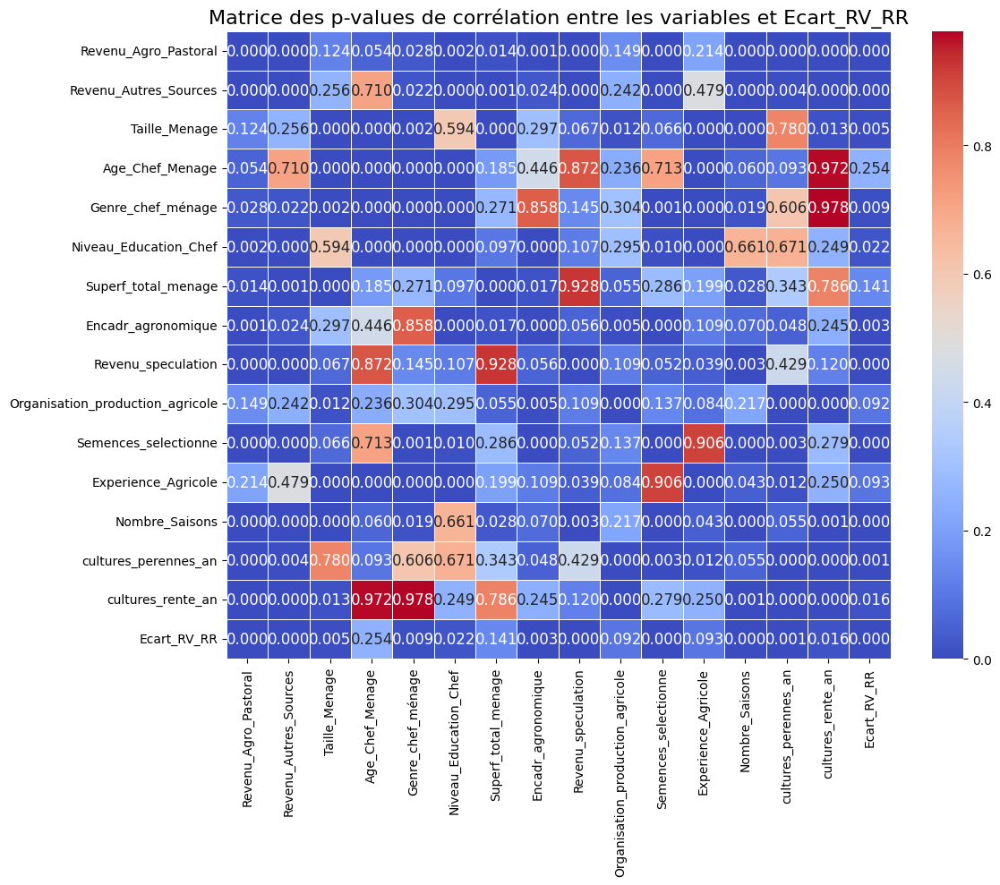

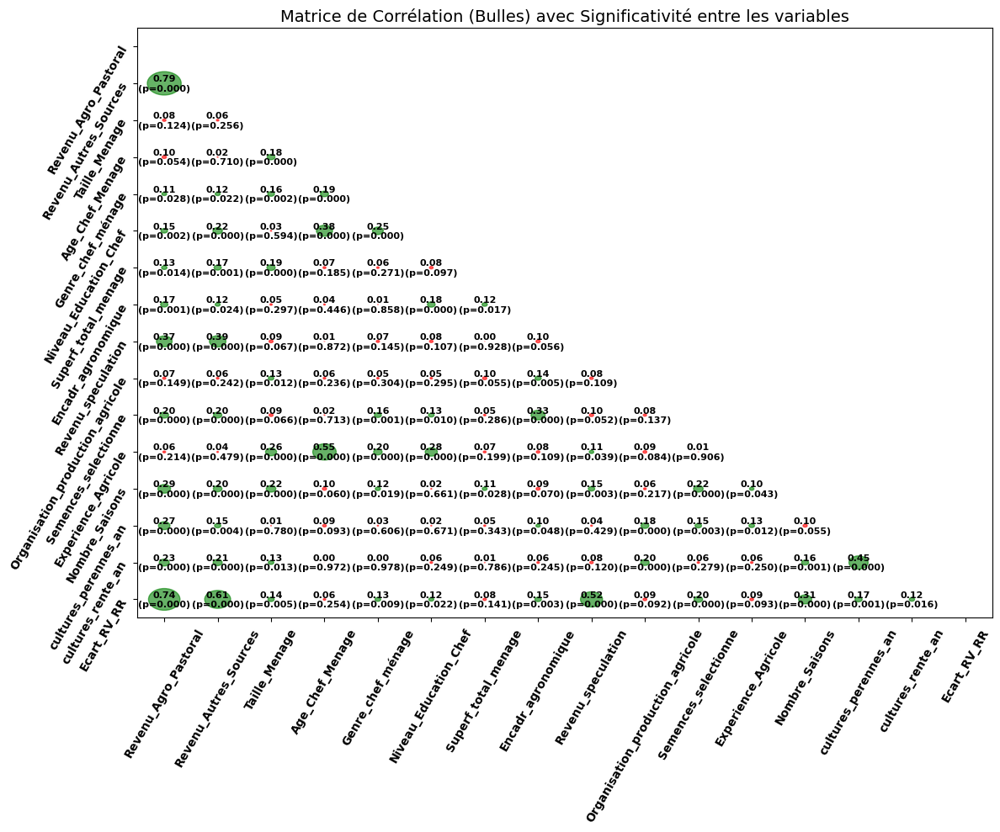

In [200]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# Assuming your dataset is in a DataFrame named 'df'
# Create a list of the variables you want to correlate with the dependent variable 'Ecart_RV_RR'
variables = [
    'Revenu_Agro_Pastoral', 'Revenu_Autres_Sources', 'Taille_Menage', 'Age_Chef_Menage',
    'Genre_chef_ménage', 'Niveau_Education_Chef', 'Superf_total_menage', 
    'Encadr_agronomique', 'Revenu_speculation',  'Organisation_production_agricole',
    'Semences_selectionne', 'Experience_Agricole', 'Nombre_Saisons', 
    'cultures_perennes_an', 'cultures_rente_an'
]

# Select the relevant columns from the dataset
df_selected = df[variables + ['Ecart_RV_RR']]

# Initialize an empty DataFrame to store the p-values
p_values = pd.DataFrame(index=df_selected.columns, columns=df_selected.columns)

# Calculate the correlation matrix and the p-values
corr_matrix = pd.DataFrame(index=df_selected.columns, columns=df_selected.columns)
for col1 in df_selected.columns:
    for col2 in df_selected.columns:
        # Calculate the Pearson correlation coefficient and the p-value
        corr, p_val = pearsonr(df_selected[col1], df_selected[col2])
        corr_matrix.loc[col1, col2] = corr
        p_values.loc[col1, col2] = p_val

# Plot the correlation matrix with more readable numbers (larger font size, adjusted spacing)
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr_matrix.astype(float), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, cbar=True, annot_kws={'size': 12})

# Title and layout
plt.title('Matrice de Corrélation entre les variables et Ecart_RV_RR', fontsize=16)
plt.tight_layout()
plt.show()

# Plotting the p-value heatmap (significance levels)
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(p_values.astype(float), annot=True, cmap='coolwarm', fmt='.3f', linewidths=0.5, cbar=True, annot_kws={'size': 12})

# Title and layout
plt.title('Matrice des p-values de corrélation entre les variables et Ecart_RV_RR', fontsize=16)
plt.tight_layout()
plt.show()

# Alternatively, if you want to show the correlation as bubbles with p-values:
fig, ax = plt.subplots(figsize=(12, 10))

# Extract the absolute correlation matrix for bubble size
corr = corr_matrix.abs()

# Plot bubbles for correlation coefficients
for i in range(len(corr.columns)):
    for j in range(i):
        # Get the p-value for significance
        p_val = float(p_values.iloc[i, j])

        # If the p-value is less than 0.05, it is considered significant
        if p_val < 0.05:
            color = 'green'  # Use green for significant correlations
        else:
            color = 'red'  # Use red for non-significant correlations

        # Increase the size of the circle for better visibility
        circle = plt.Circle((j, i), corr.iloc[i, j] * 0.4, color=color, alpha=0.6)
        ax.add_artist(circle)
        
        # Format and space the text
        ax.text(j, i, f'{corr.iloc[i, j]:.2f}\n(p={p_val:.3f})', 
                horizontalalignment='center', verticalalignment='center', 
                fontsize=8, color='black', fontweight='bold')

# Configure the axes with better spacing
ax.set_xlim(-0.5, len(corr.columns) - 0.5)
ax.set_ylim(len(corr.columns) - 0.5, -0.5)
ax.set_xticks(np.arange(len(corr.columns)))
ax.set_yticks(np.arange(len(corr.columns)))
ax.set_xticklabels(corr.columns, rotation=60, fontsize=10, fontweight='bold')
ax.set_yticklabels(corr.columns,rotation=60, fontsize=10, fontweight='bold')
ax.set_title('Matrice de Corrélation (Bulles) avec Significativité entre les variables', fontsize=14)
plt.tight_layout()
plt.show()


In [201]:
print(df.columns)

Index(['Revenu_speculation', 'Prod_Haricot_Valeur', 'Prod_PetitPois_Valeur', 'Prod_Soja_Valeur', 'Prod_Pdt_Valeur', 'Prod_Manioc_Valeur', 'Prod_PatateDouce_Valeur', 'Prod_Colocase_Valeur', 'Prod_Arachide_Valeur', 'Prod_Tournesol_Valeur', 'Prod_Mais_Valeur', 'Prod_Riz_Valeur', 'Prod_Sorgho_Valeur', 'Prod_Cafe_Valeur', 'Prod_Banane_Valeur', 'Prod_valeur_autr_cultur', 'Prod_Elevage_Valeur', 'Revenu_Autres_Sources', 'Depenses_Annuel', 'Revenu_Agro_Pastoral', 'Revenu_Reel_Menage', 'Revenu_vital_menage', 'Ecart_RV_RR', 'Zone_Collecte_Donnees', 'Age_Chef_Menage', 'Genre_chef_ménage', 'Situation_Matrimoniale_Chef', 'Niveau_Education_Chef', 'Activit_chef_ménage ', 'Activit_secondaire _chef _ménage ', 'Taille_Menage', 'Education_adultes_hommes', 'Niveau_Ed_Femmes_Adultes', 'Nb_Pieces_Logement', 'Appréciation _etat_maison', 'Organisation_production_agricole', 'Acces_terre', 'Mode_Acces_terre', 'Superf_total_menage', 'Terre_cultivable', 'Encadr_agronomique', 'Cultures_Pures', 'Jachere',
       'As

Colonnes manquantes : []


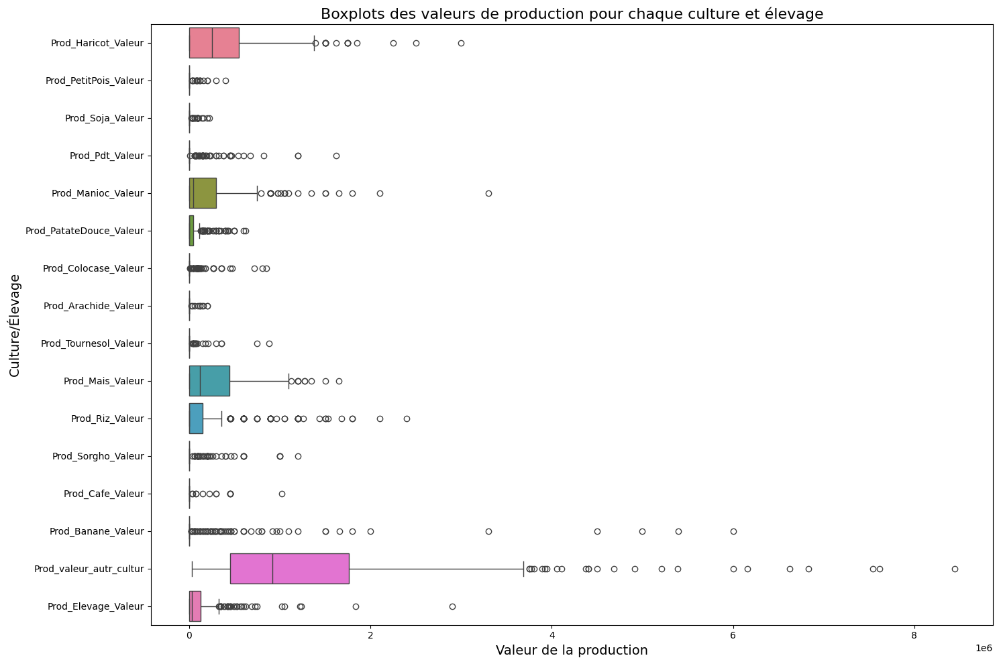

In [202]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


# Supprimer les espaces autour des noms de colonnes
df.columns = df.columns.str.strip()

# Liste des colonnes que vous souhaitez analyser
variables = [
    'Prod_Haricot_Valeur', 'Prod_PetitPois_Valeur', 'Prod_Soja_Valeur', 
    'Prod_Pdt_Valeur', 'Prod_Manioc_Valeur', 'Prod_PatateDouce_Valeur', 
    'Prod_Colocase_Valeur', 'Prod_Arachide_Valeur', 'Prod_Tournesol_Valeur', 
    'Prod_Mais_Valeur', 'Prod_Riz_Valeur', 'Prod_Sorgho_Valeur', 
    'Prod_Cafe_Valeur', 'Prod_Banane_Valeur', 'Prod_valeur_autr_cultur', 
    'Prod_Elevage_Valeur'
]

# Vérification des colonnes manquantes dans le DataFrame
missing_columns = [col for col in variables if col not in df.columns]
print("Colonnes manquantes :", missing_columns)

# Si aucune colonne manquante, continuer à créer les boxplots
if not missing_columns:
    plt.figure(figsize=(15, 10))
    sns.boxplot(data=df[variables], orient='h')
    plt.title('Boxplots des valeurs de production pour chaque culture et élevage', fontsize=16)
    plt.xlabel('Valeur de la production', fontsize=14)
    plt.ylabel('Culture/Élevage', fontsize=14)
    plt.tight_layout()
    plt.show()
else:
    print("Il y a des colonnes manquantes. Veuillez les corriger.")


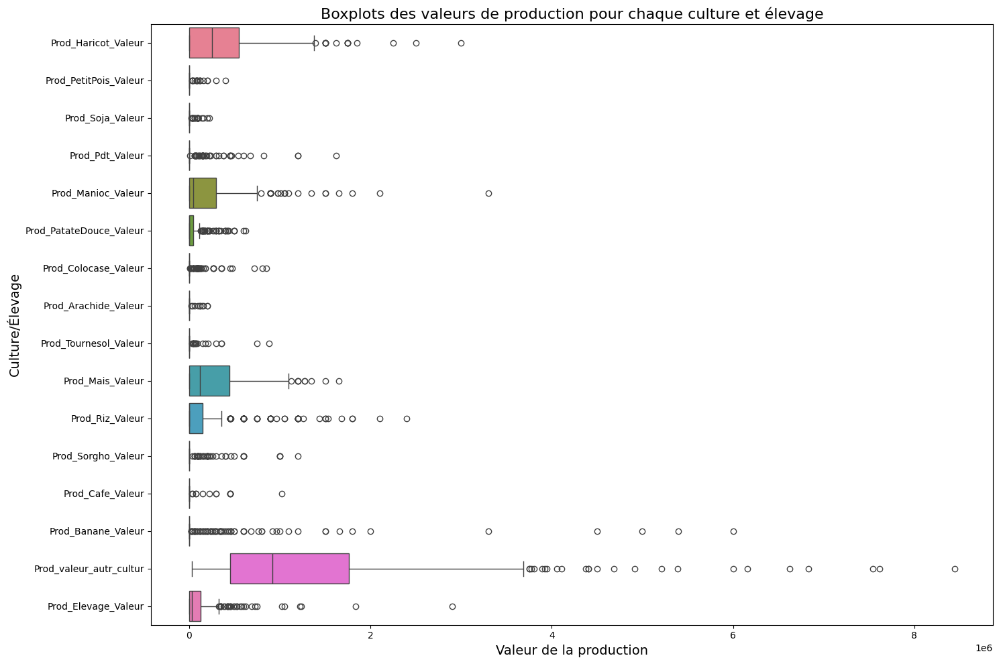

In [203]:
import matplotlib.pyplot as plt
import seaborn as sns

# Créer une figure et des axes pour le plot
plt.figure(figsize=(15, 10))

# Créer les boxplots pour toutes les variables spécifiées
sns.boxplot(data=df[variables], orient='h')

# Titres et ajustements
plt.title('Boxplots des valeurs de production pour chaque culture et élevage', fontsize=16)
plt.xlabel('Valeur de la production', fontsize=14)
plt.ylabel('Culture/Élevage', fontsize=14)

# Affichage du graphique
plt.tight_layout()
plt.show()


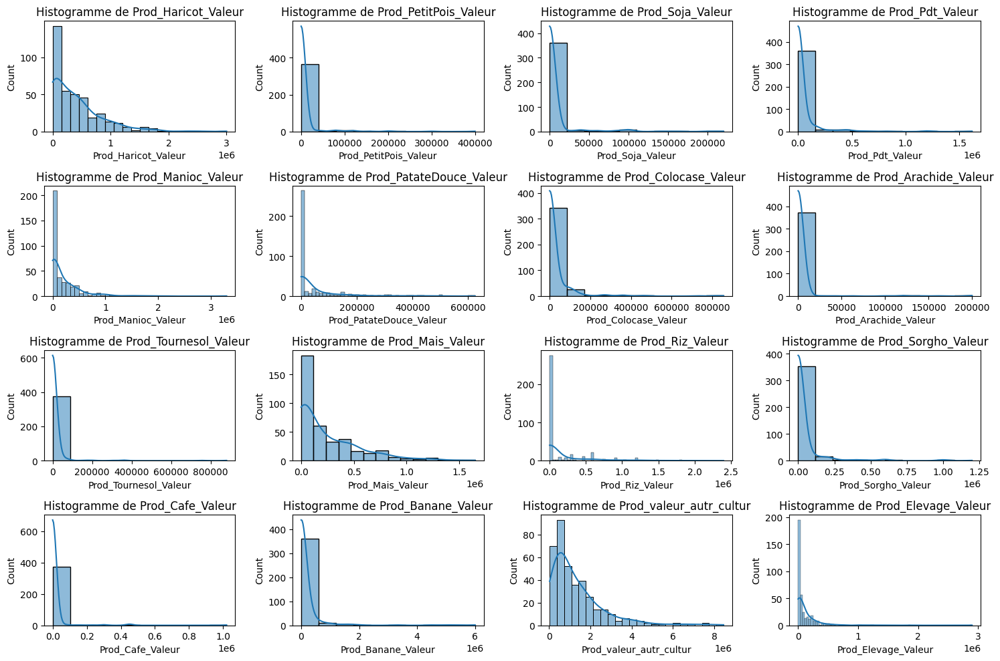

In [204]:
# Créer des histogrammes pour chaque variable
plt.figure(figsize=(15, 10))

for i, col in enumerate(variables):
    plt.subplot(4, 4, i+1)  # Placer chaque histogramme dans un subplot
    sns.histplot(df[col], kde=True)
    plt.title(f'Histogramme de {col}')

plt.tight_layout()
plt.show()


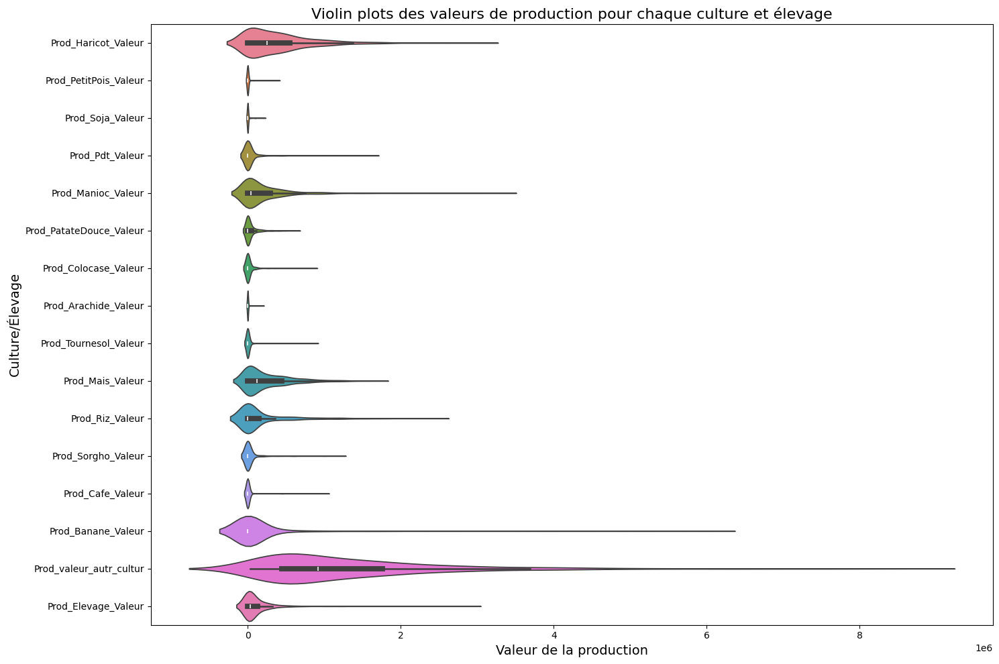

In [205]:
plt.figure(figsize=(15, 10))

# Créer un violin plot pour chaque variable
sns.violinplot(data=df[variables], orient='h')

# Titres et ajustements
plt.title('Violin plots des valeurs de production pour chaque culture et élevage', fontsize=16)
plt.xlabel('Valeur de la production', fontsize=14)
plt.ylabel('Culture/Élevage', fontsize=14)

# Affichage du graphique
plt.tight_layout()
plt.show()


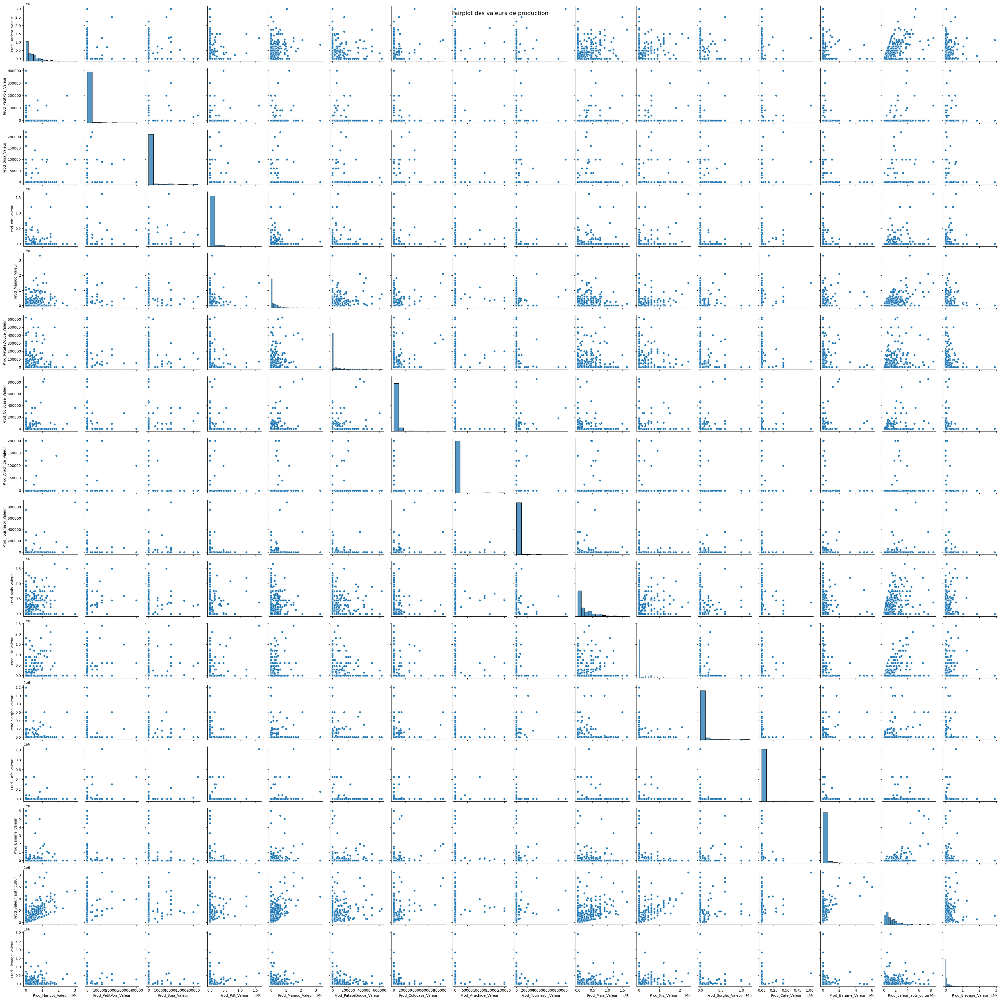

In [206]:
# Utiliser un pairplot pour voir la relation entre les variables
sns.pairplot(df[variables])

plt.suptitle('Pairplot des valeurs de production', fontsize=16)
plt.show()


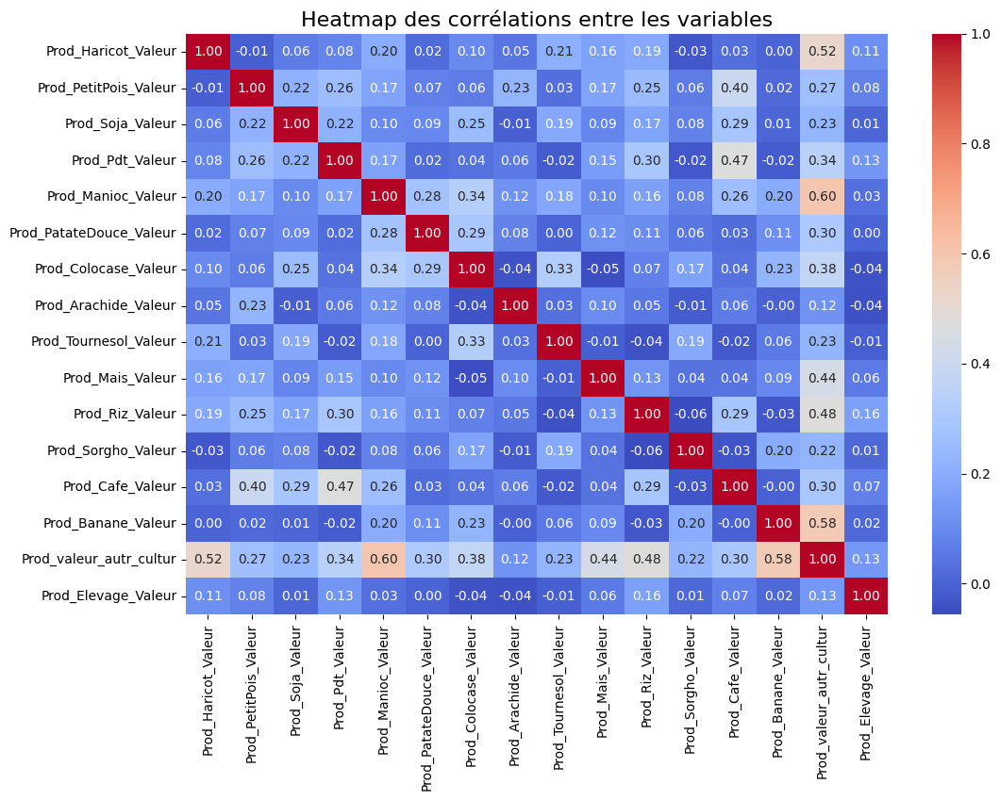

In [207]:
# Calculer la matrice de corrélation
corr_matrix = df[variables].corr()

# Tracer une heatmap de la matrice de corrélation
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')

plt.title('Heatmap des corrélations entre les variables', fontsize=16)
plt.show()


In [208]:
# Importation des bibliothèques nécessaires
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
import statsmodels.api as sm


# Sélection des variables pertinentes pour l'analyse
# Variables indépendantes choisies
variables_independantes = [
    'Revenu_Agro_Pastoral',  # Revenu agricole
    'Revenu_Autres_Sources',  # Revenus diversifiés
    'Superf_total_menage',  # Superficie totale du ménage
    'Niveau_Irrigation',  # Niveau d'irrigation
    'Cooperative',  # Appartenance à une coopérative
    'Niveau_Education_Chef',  # Niveau d'éducation du chef de ménage
    'Encadr_agronomique',  # Accès à la vulgarisation agricole
   
]

# Variable dépendante
variable_dependante = 'Ecart_RV_RR'

# Filtrage des colonnes pertinentes
X = df[variables_independantes]
y = df[variable_dependante]

# Gestion des valeurs manquantes (par exemple, remplacer par la moyenne ou supprimer les lignes avec NaN)
X.fillna(X.mean(), inplace=True)  # Optionnel : ajustez selon vos besoins
y.fillna(y.mode()[0], inplace=True)

# Division des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Entraînement du modèle de régression logistique
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Prédiction sur l'ensemble de test
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:, 1]

# Évaluation du modèle
print("Matrice de confusion :")
print(confusion_matrix(y_test, y_pred))
print("\nRapport de classification :")
print(classification_report(y_test, y_pred))
print(f"\nAUC : {roc_auc_score(y_test, y_pred_proba):.4f}")

# Analyse statistique avec statsmodels pour obtenir les coefficients significatifs
X_train_sm = sm.add_constant(X_train)  # Ajout d'une constante pour l'intercept
logit_model = sm.Logit(y_train, X_train_sm)
result = logit_model.fit()
print(result.summary())

# Interprétation des résultats
# Les coefficients positifs indiquent une augmentation de la probabilité d'être résilient,
# tandis que les coefficients négatifs indiquent une diminution.

Matrice de confusion :
[[77  5]
 [10 23]]

Rapport de classification :
              precision    recall  f1-score   support

           0       0.89      0.94      0.91        82
           1       0.82      0.70      0.75        33

    accuracy                           0.87       115
   macro avg       0.85      0.82      0.83       115
weighted avg       0.87      0.87      0.87       115


AUC : 0.9043
Optimization terminated successfully.
         Current function value: 0.189860
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:            Ecart_RV_RR   No. Observations:                  268
Model:                          Logit   Df Residuals:                      260
Method:                           MLE   Df Model:                            7
Date:                Mon, 03 Mar 2025   Pseudo R-squ.:                  0.6778
Time:                        16:17:13   Log-Likelihood:                -50.883
converged:  

C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\3699465717.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(X.mean(), inplace=True)  # Optionnel : ajustez selon vos besoins


In [209]:
# Importation des bibliothèques nécessaires
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
import statsmodels.api as sm

# Sélection des variables pertinentes pour l'analyse
# Variables indépendantes choisies
variables_independantes = [
    'Revenu_Agro_Pastoral',  # Revenu agricole
    'Revenu_Autres_Sources',  # Revenus diversifiés
    'Superf_total_menage',  # Superficie totale du ménage
    'Niveau_Irrigation',  # Niveau d'irrigation
    'Cooperative',  # Appartenance à une coopérative
    'Niveau_Education_Chef',  # Niveau d'éducation du chef de ménage
    'Encadr_agronomique',  # Accès à la vulgarisation agricole
]

# Variable dépendante
variable_dependante = 'Ecart_RV_RR'

# Chargement des données (remplacez 'votre_base_de_donnees.csv' par le chemin vers votre fichier)
# df = pd.read_csv('votre_base_de_donnees.csv')  # Assurez-vous que votre DataFrame est chargé ici

# Filtrage des colonnes pertinentes
X = df[variables_independantes]
y = df[variable_dependante]

# Gestion des valeurs manquantes (par exemple, remplacer par la moyenne ou supprimer les lignes avec NaN)
X.fillna(X.mean(), inplace=True)  # Optionnel : ajustez selon vos besoins
y.fillna(y.mode()[0], inplace=True)

# Division des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Entraînement du modèle de régression logistique
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Prédiction sur l'ensemble de test
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:, 1]

# Évaluation du modèle
print("Matrice de confusion :")
print(confusion_matrix(y_test, y_pred))
print("\nRapport de classification :")
print(classification_report(y_test, y_pred))
print(f"\nAUC : {roc_auc_score(y_test, y_pred_proba):.4f}")

# Affichage des coefficients du modèle scikit-learn
coefficients = pd.DataFrame({
    'Variable': variables_independantes,
    'Coefficient': model.coef_[0]
}).sort_values(by='Coefficient', ascending=False)

print("\nCoefficients du modèle (scikit-learn) :")
print(coefficients)

# Analyse statistique avec statsmodels pour obtenir les coefficients significatifs
X_train_sm = sm.add_constant(X_train)  # Ajout d'une constante pour l'intercept
logit_model = sm.Logit(y_train, X_train_sm)
result = logit_model.fit()

# Affichage des résultats complets de statsmodels
print("\nRésultats détaillés du modèle (statsmodels) :")
print(result.summary())

# Extraction des coefficients et p-values de statsmodels
summary_results = result.summary2()  # Utilisez summary2 pour un format plus lisible
coefficients_statsmodels = summary_results.tables[1].reset_index()

# Renommez les colonnes pour plus de clarté
coefficients_statsmodels.columns = ['Variable', 'Coefficient', 'Erreur_Std', 'z', 'P>|z|', '[0.025', '0.975]']

# Affichage des coefficients avec leur significativité
print("\nCoefficients du modèle (statsmodels) avec p-values :")
print(coefficients_statsmodels[['Variable', 'Coefficient', 'P>|z|']])

C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\795819865.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(X.mean(), inplace=True)  # Optionnel : ajustez selon vos besoins


Matrice de confusion :
[[77  5]
 [10 23]]

Rapport de classification :
              precision    recall  f1-score   support

           0       0.89      0.94      0.91        82
           1       0.82      0.70      0.75        33

    accuracy                           0.87       115
   macro avg       0.85      0.82      0.83       115
weighted avg       0.87      0.87      0.87       115


AUC : 0.9043

Coefficients du modèle (scikit-learn) :
                Variable  Coefficient
6     Encadr_agronomique      0.74343
3      Niveau_Irrigation      0.05510
5  Niveau_Education_Chef      0.05460
0   Revenu_Agro_Pastoral      0.00000
1  Revenu_Autres_Sources      0.00000
2    Superf_total_menage     -0.00003
4            Cooperative     -0.96758
Optimization terminated successfully.
         Current function value: 0.189860
         Iterations 9

Résultats détaillés du modèle (statsmodels) :
                           Logit Regression Results                           
Dep. Variable: 

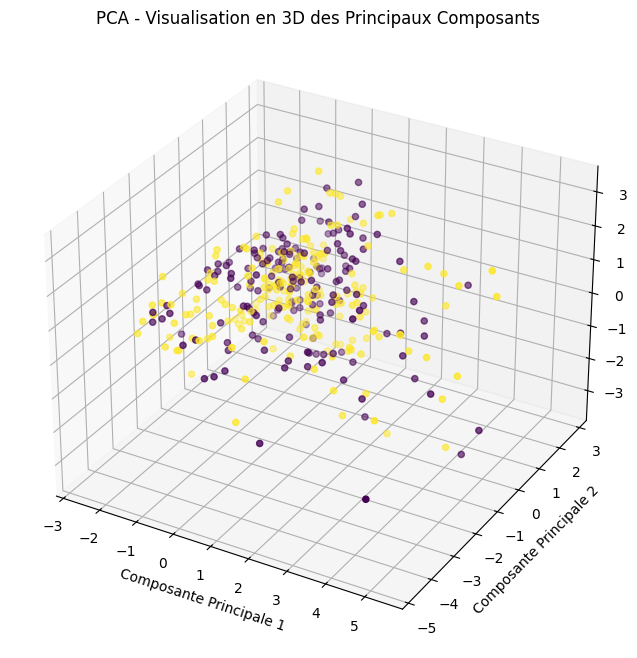

Variance expliquée par chaque composante : [0.2483719  0.19411299 0.13467483]


In [210]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# On exclut la colonne "Revenu_vital_menage" qui est constante
variables_pca = ['Revenu_Reel_Menage', 'Revenu_Autres_Sources', 'Depenses_Annuel', 'Age_Chef_Menage',
                 'Genre_chef_ménage', 'Taille_Menage', 'Nb_Pieces_Logement', 'Experience_Agricole', 'Pluies_Excessives']

# Standardisation des données
scaler = StandardScaler()
scaled_df = scaler.fit_transform(df[variables_pca])

# Application de la PCA
pca = PCA(n_components=3)
pca_components = pca.fit_transform(scaled_df)

# Visualisation en 3D des premières composantes principales
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(pca_components[:, 0], pca_components[:, 1], pca_components[:, 2], c=df['Zone_Collecte_Donnees'], cmap='viridis')

ax.set_xlabel('Composante Principale 1')
ax.set_ylabel('Composante Principale 2')
ax.set_zlabel('Composante Principale 3')

plt.title('PCA - Visualisation en 3D des Principaux Composants')
plt.show()

# Explication de la variance des trois premières composantes principales
explained_variance = pca.explained_variance_ratio_
print(f"Variance expliquée par chaque composante : {explained_variance}")


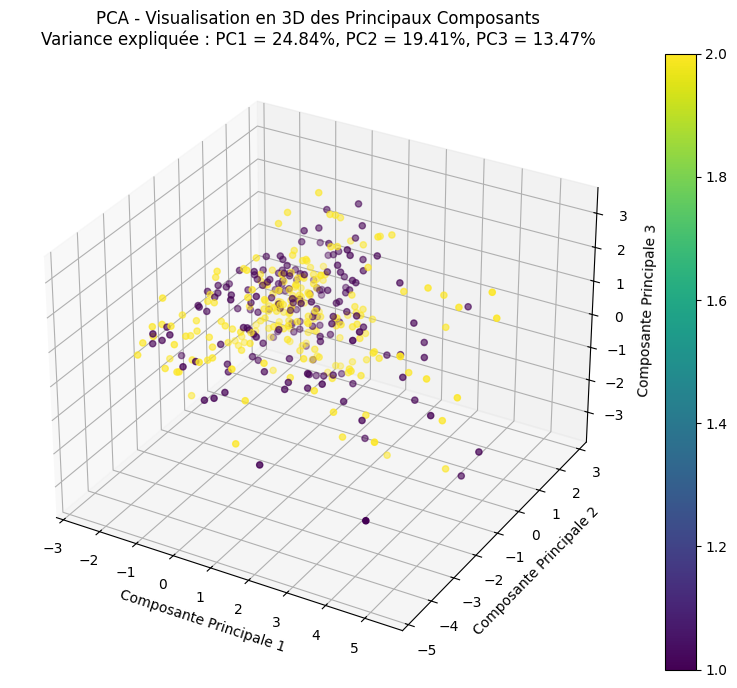

Variance expliquée par chaque composante : [0.2483719  0.19411299 0.13467483]


In [211]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# On exclut la colonne "Revenu_vital_menage" qui est constante
variables_pca = ['Revenu_Reel_Menage', 'Revenu_Autres_Sources', 'Depenses_Annuel', 'Age_Chef_Menage',
                 'Genre_chef_ménage', 'Taille_Menage', 'Nb_Pieces_Logement', 'Experience_Agricole', 'Pluies_Excessives']

# Standardisation des données
scaler = StandardScaler()
scaled_df = scaler.fit_transform(df[variables_pca])

# Application de la PCA
pca = PCA(n_components=3)
pca_components = pca.fit_transform(scaled_df)

# Explication de la variance des trois premières composantes principales
explained_variance = pca.explained_variance_ratio_

# Visualisation en 3D des premières composantes principales
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(pca_components[:, 0], pca_components[:, 1], pca_components[:, 2], 
                     c=df['Zone_Collecte_Donnees'], cmap='viridis')

# Labels des axes
ax.set_xlabel('Composante Principale 1')
ax.set_ylabel('Composante Principale 2')
ax.set_zlabel('Composante Principale 3')

# Ajouter un titre avec les pourcentages de variance expliquée
explained_variance_str = f'Variance expliquée : PC1 = {explained_variance[0]*100:.2f}%, PC2 = {explained_variance[1]*100:.2f}%, PC3 = {explained_variance[2]*100:.2f}%'
plt.title(f'PCA - Visualisation en 3D des Principaux Composants\n{explained_variance_str}')

# Ajouter une barre de couleurs
plt.colorbar(scatter)

# Affichage de la figure
plt.show()

# Affichage de la variance expliquée par chaque composante
print(f"Variance expliquée par chaque composante : {explained_variance}")


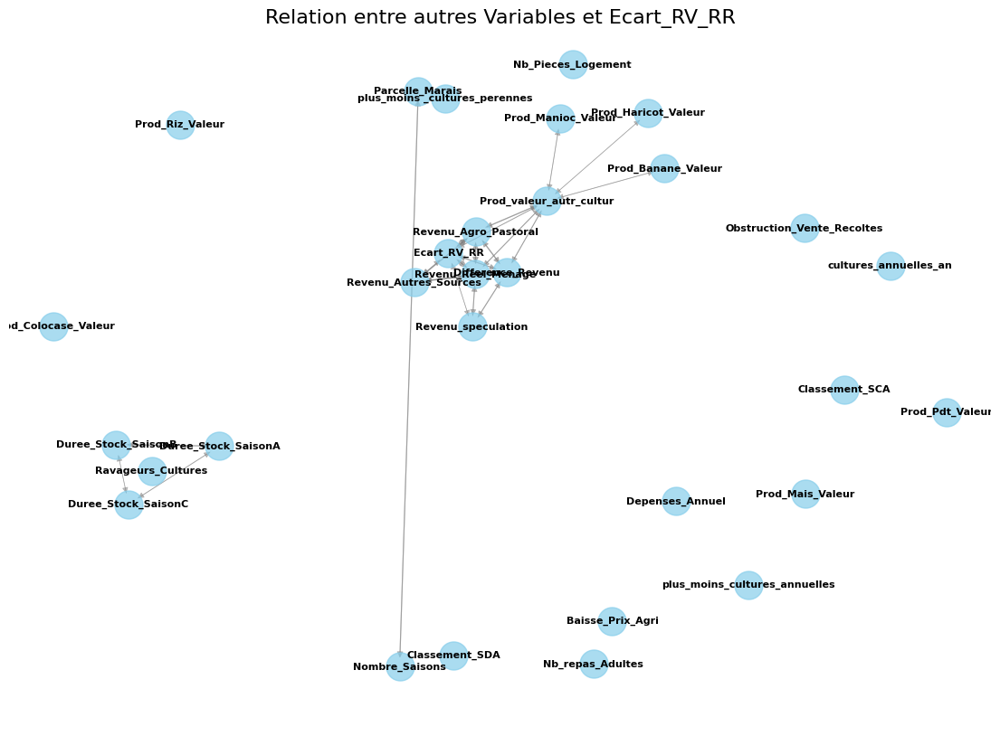

In [212]:
# Step 1: Import necessary libraries
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your DataFrame and 'Ecart_RV_RR' is your target variable

# Step 2: Calculate the correlation matrix
corr_matrix = df.corr()

# Step 3: Select the top 15 most correlated variables with 'Ecart_RV_RR'
top_15_corr = corr_matrix[['Ecart_RV_RR']].abs().sort_values(by='Ecart_RV_RR', ascending=False).head(30)
top_15_columns = top_15_corr.index

# Step 4: Create a NetworkX graph object
G = nx.DiGraph()  # Use DiGraph for directed edges (arrows)

# Step 5: Add nodes (variables) to the graph
for column in top_15_columns:
    G.add_node(column, size=20)

# Step 6: Add edges (relationships between variables) based on the correlation matrix
for i in top_15_columns:
    for j in top_15_columns:
        if abs(corr_matrix[i][j]) > 0.5 and i != j:  # Threshold to avoid clutter
            G.add_edge(i, j, weight=corr_matrix[i][j])

# Step 7: Position the nodes using spring layout for better visualization
pos = nx.spring_layout(G, k=0.2, iterations=20)

# Step 8: Visualize the graph
plt.figure(figsize=(14, 10))
edges = G.edges(data=True)
weights = [edge[2]['weight'] for edge in edges]

# Draw the nodes, edges, and labels
nx.draw_networkx_nodes(G, pos, node_size=500, node_color='skyblue', alpha=0.7)
nx.draw_networkx_labels(G, pos, font_size=8, font_weight='bold')
nx.draw_networkx_edges(G, pos, width=weights, alpha=0.5, edge_color='gray', arrows=True)

# Step 9: Adding the title and removing axis
plt.title('Relation entre autres Variables et Ecart_RV_RR', fontsize=16)
plt.axis('off')

# Step 10: Display the graph
plt.show()


C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\738524805.py:39: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('coolwarm')  # Choose a color map


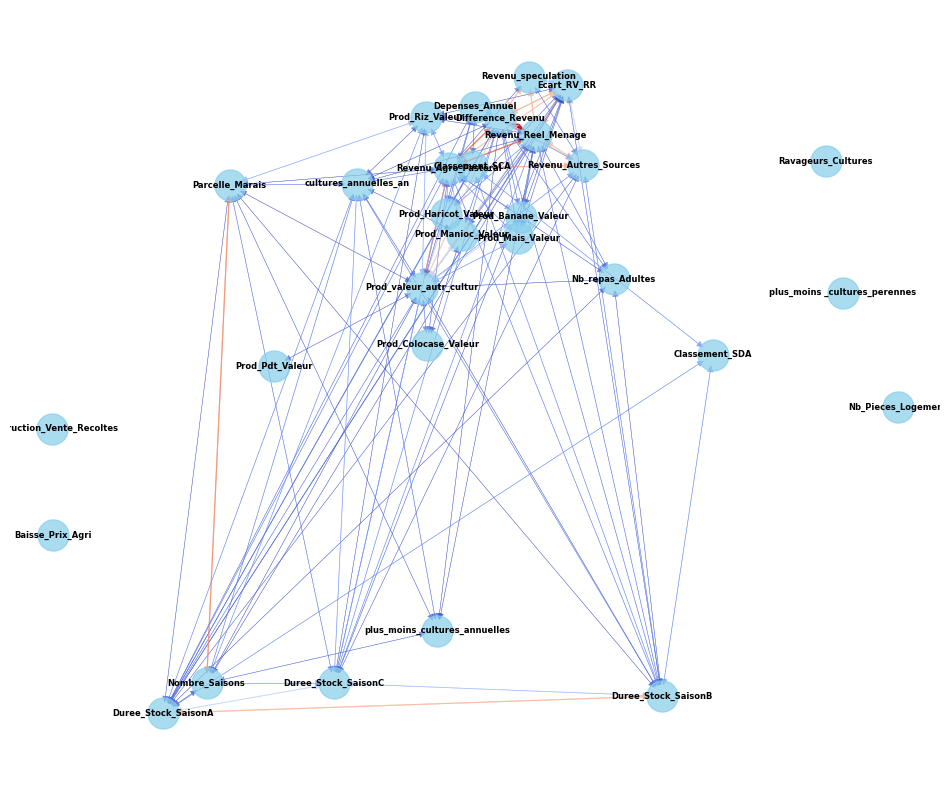

In [213]:
# Step 1: Import necessary libraries
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming 'df' is your DataFrame and 'Ecart_RV_RR' is your target variable

# Step 2: Calculate the correlation matrix
corr_matrix = df.corr()

# Step 3: Select the top 15 most correlated variables with 'Ecart_RV_RR'
top_15_corr = corr_matrix[['Ecart_RV_RR']].abs().sort_values(by='Ecart_RV_RR', ascending=False).head(30)
top_15_columns = top_15_corr.index

# Step 4: Create a NetworkX graph object
G = nx.DiGraph()  # Directed graph to display arrows

# Step 5: Add nodes (variables) to the graph
for column in top_15_columns:
    G.add_node(column, size=20)

# Step 6: Add edges (relationships between variables) based on the correlation matrix
for i in top_15_columns:
    for j in top_15_columns:
        if abs(corr_matrix[i][j]) > 0.3 and i != j:  # Threshold to avoid clutter
            G.add_edge(i, j, weight=corr_matrix[i][j])

# Step 7: Position the nodes using spring layout for better visualization
pos = nx.spring_layout(G, k=0.2, iterations=20)

# Step 8: Visualize the graph
plt.figure(figsize=(12, 10))
edges = G.edges(data=True)
weights = [edge[2]['weight'] for edge in edges]

# Color map based on edge weights (correlation strength)
edge_colors = [np.abs(weight['weight']) for _, _, weight in edges]
cmap = plt.cm.get_cmap('coolwarm')  # Choose a color map

# Draw the nodes, edges, and labels
nx.draw_networkx_nodes(G, pos, node_size=500, node_color='skyblue', alpha=0.7)
nx.draw_networkx_labels(G, pos, font_size=6, font_weight='bold')
nx.draw_networkx_edges(G, pos, width=weights, alpha=0.7, edge_color=edge_colors, edge_cmap=cmap, arrows=True)

# Step 9: Adding the title and removing axis

plt.axis('off')

# Step 10: Display the graph
plt.show()


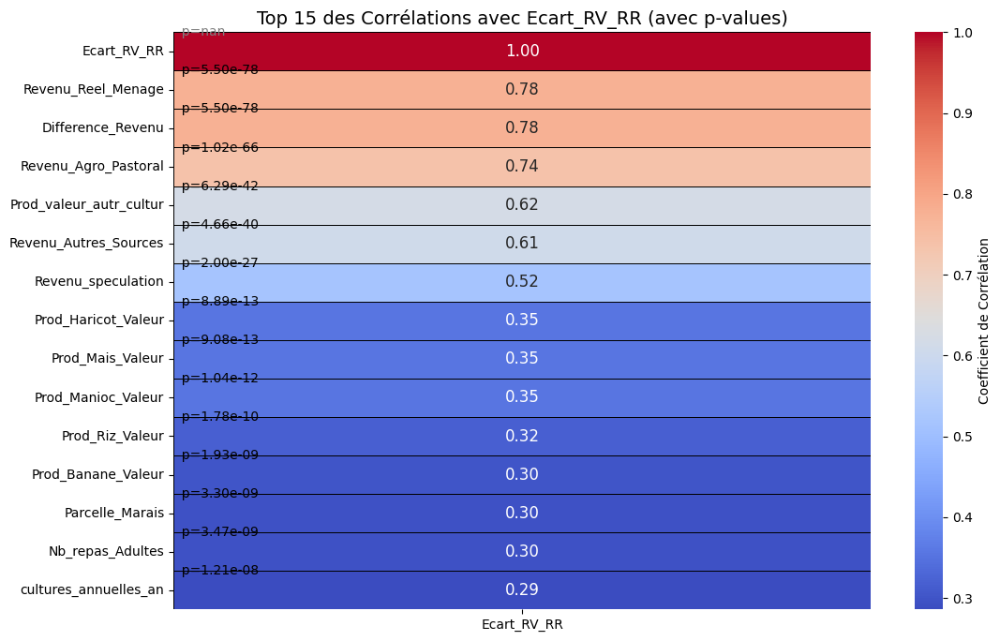

In [214]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# Calcul de la matrice de corrélation
corr_matrix = df.corr()

# Trier les corrélations avec 'Ecart_RV_RR' en ordre décroissant
top_15_corr = corr_matrix[['Ecart_RV_RR']].sort_values(by='Ecart_RV_RR', ascending=False).head(15)

# Extraction des noms des variables du top 15
top_vars = top_15_corr.index.tolist()

# Création d'un DataFrame pour stocker les p-values
p_value_matrix = pd.DataFrame(index=top_vars, columns=['p_value'])

# Calcul des p-values pour chaque variable par rapport à 'Ecart_RV_RR'
for var in top_vars:
    if var != 'Ecart_RV_RR':  # Ignorer la corrélation de la variable avec elle-même
        corr_coef, p_value = pearsonr(df['Ecart_RV_RR'], df[var])
        p_value_matrix.loc[var, 'p_value'] = p_value

# Fusionner les coefficients de corrélation et les p-values
top_15_with_pvalues = top_15_corr.merge(p_value_matrix, left_index=True, right_index=True)

# Visualisation de la matrice de corrélation avec les p-values
plt.figure(figsize=(12, 8))

# Création d'une heatmap pour les coefficients de corrélation
sns.heatmap(top_15_corr, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 12},
            cbar_kws={'label': 'Coefficient de Corrélation'}, linewidths=0.5, linecolor='black')

# Ajout des p-values sous forme de texte sur la heatmap
for i, var in enumerate(top_15_corr.index):
    plt.text(0, i, f"  p={top_15_with_pvalues.loc[var, 'p_value']:.2e}", va='center', ha='left', fontsize=10,
             color='black' if top_15_with_pvalues.loc[var, 'p_value'] < 0.05 else 'gray')

# Titre
plt.title('Top 15 des Corrélations avec Ecart_RV_RR (avec p-values)', fontsize=14)

# Affichage du graphique
plt.show()

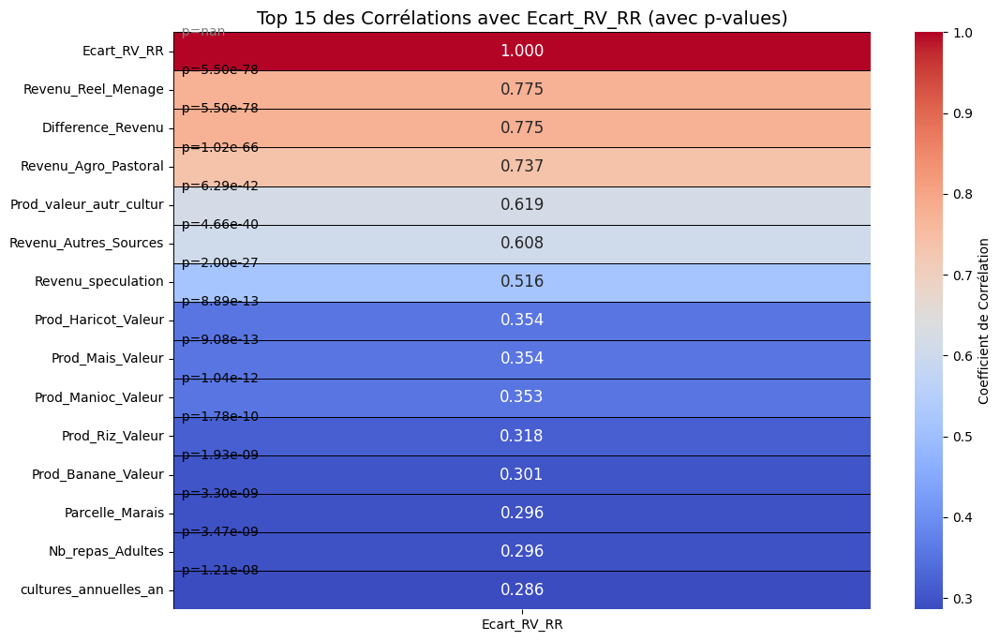

In [215]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# Calcul de la matrice de corrélation
corr_matrix = df.corr()

# Trier les corrélations avec 'Ecart_RV_RR' en ordre décroissant
top_15_corr = corr_matrix[['Ecart_RV_RR']].sort_values(by='Ecart_RV_RR', ascending=False).head(15)

# Extraction des noms des variables du top 15
top_vars = top_15_corr.index.tolist()

# Création d'un DataFrame pour stocker les p-values
p_value_matrix = pd.DataFrame(index=top_vars, columns=['p_value'])

# Calcul des p-values pour chaque variable par rapport à 'Ecart_RV_RR'
for var in top_vars:
    if var != 'Ecart_RV_RR':  # Ignorer la corrélation de la variable avec elle-même
        corr_coef, p_value = pearsonr(df['Ecart_RV_RR'], df[var])
        p_value_matrix.loc[var, 'p_value'] = p_value

# Fusionner les coefficients de corrélation et les p-values
top_15_with_pvalues = top_15_corr.merge(p_value_matrix, left_index=True, right_index=True)

# Visualisation de la matrice de corrélation avec les p-values
plt.figure(figsize=(12, 8))

# Création d'une heatmap pour les coefficients de corrélation (avec 3 chiffres après la virgule)
sns.heatmap(top_15_corr, annot=True, cmap='coolwarm', fmt='.3f', annot_kws={"size": 12},  # Modification ici
            cbar_kws={'label': 'Coefficient de Corrélation'}, linewidths=0.5, linecolor='black')

# Ajout des p-values sous forme de texte sur la heatmap
for i, var in enumerate(top_15_corr.index):
    plt.text(0, i, f"  p={top_15_with_pvalues.loc[var, 'p_value']:.2e}", va='center', ha='left', fontsize=10,
             color='black' if top_15_with_pvalues.loc[var, 'p_value'] < 0.05 else 'gray')

# Titre
plt.title('Top 15 des Corrélations avec Ecart_RV_RR (avec p-values)', fontsize=14)

# Affichage du graphique
plt.show()

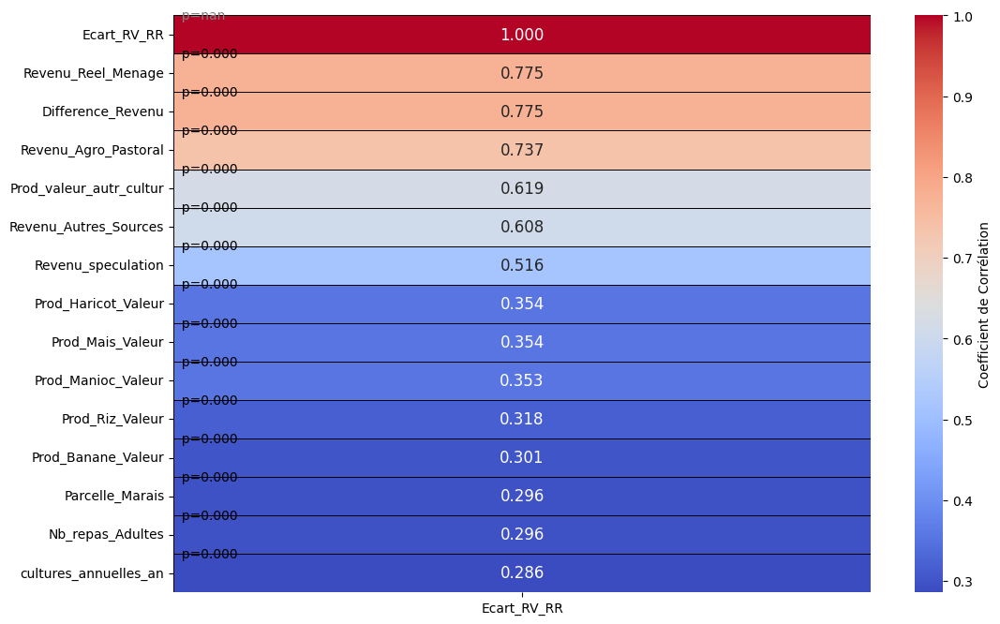

In [216]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# Calcul de la matrice de corrélation
corr_matrix = df.corr()

# Trier les corrélations avec 'Ecart_RV_RR' en ordre décroissant
top_15_corr = corr_matrix[['Ecart_RV_RR']].sort_values(by='Ecart_RV_RR', ascending=False).head(15)

# Extraction des noms des variables du top 15
top_vars = top_15_corr.index.tolist()

# Création d'un DataFrame pour stocker les p-values
p_value_matrix = pd.DataFrame(index=top_vars, columns=['p_value'])

# Calcul des p-values pour chaque variable par rapport à 'Ecart_RV_RR'
for var in top_vars:
    if var != 'Ecart_RV_RR':  # Ignorer la corrélation de la variable avec elle-même
        corr_coef, p_value = pearsonr(df['Ecart_RV_RR'], df[var])
        p_value_matrix.loc[var, 'p_value'] = p_value

# Fusionner les coefficients de corrélation et les p-values
top_15_with_pvalues = top_15_corr.merge(p_value_matrix, left_index=True, right_index=True)

# Visualisation de la matrice de corrélation avec les p-values
plt.figure(figsize=(12, 8))

# Création d'une heatmap pour les coefficients de corrélation (avec 3 chiffres après la virgule)
sns.heatmap(top_15_corr, annot=True, cmap='coolwarm', fmt='.3f', annot_kws={"size": 12},
            cbar_kws={'label': 'Coefficient de Corrélation'}, linewidths=0.5, linecolor='black')

# Ajout des p-values sous forme de texte sur la heatmap (format .3f sans notation exponentielle)
for i, var in enumerate(top_15_corr.index):
    # Formater la p-value avec 3 décimales (éviter la notation exponentielle)
    p_value_formatted = f"{top_15_with_pvalues.loc[var, 'p_value']:.3f}"
    plt.text(0, i, f"  p={p_value_formatted}", va='center', ha='left', fontsize=10,
             color='black' if top_15_with_pvalues.loc[var, 'p_value'] < 0.05 else 'gray')

# Titre

# Affichage du graphique
plt.show()

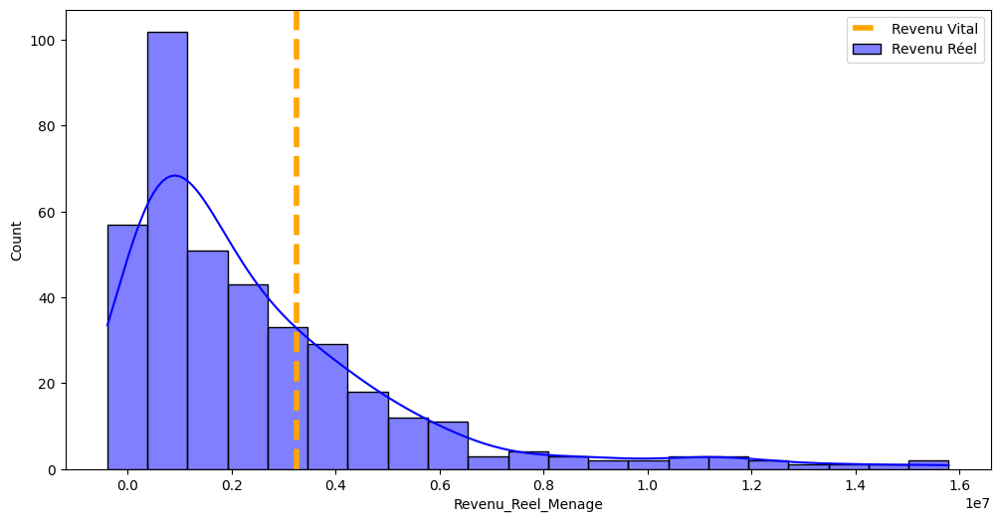

In [217]:
# Visualisation de la distribution du revenu réel avec une ligne pour le revenu vital
plt.figure(figsize=(12, 6))

# Histogramme pour le Revenu Réel
sns.histplot(df['Revenu_Reel_Menage'], color='blue', kde=True, label='Revenu Réel')

# Ajout d'une ligne verticale pour le Revenu Vital avec une épaisseur de ligne augmentée
plt.axvline(df['Revenu_vital_menage'].iloc[0], color='orange', linestyle='--', label='Revenu Vital', linewidth=4)

# Ajout de la légende et du titre
plt.legend()

# Affichage du graphique
plt.show()


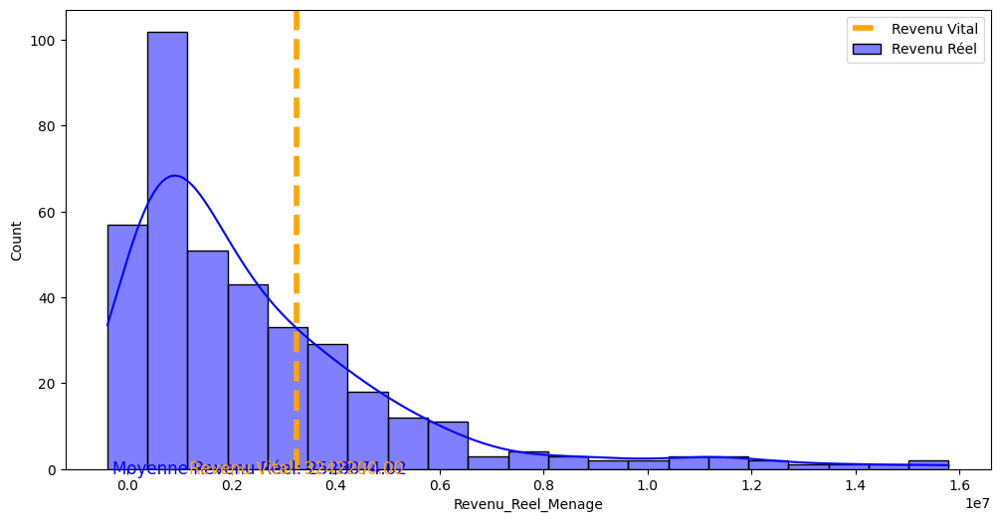

In [218]:
# Visualisation de la distribution du revenu réel avec une ligne pour le revenu vital
plt.figure(figsize=(12, 6))

# Histogramme pour le Revenu Réel
sns.histplot(df['Revenu_Reel_Menage'], color='blue', kde=True, label='Revenu Réel')

# Ajout d'une ligne verticale pour le Revenu Vital avec une épaisseur de ligne augmentée
plt.axvline(df['Revenu_vital_menage'].iloc[0], color='orange', linestyle='--', label='Revenu Vital', linewidth=4)

# Calcul de la moyenne du Revenu Réel
moyenne_revenu_reel = df['Revenu_Reel_Menage'].mean()

# Ajout du texte avec la moyenne du Revenu Réel et du Revenu Vital à l'intérieur de la figure
plt.text(moyenne_revenu_reel, 0.03, f'Moyenne Revenu Réel: {moyenne_revenu_reel:.2f}', 
         color='blue', fontsize=12, ha='center', va='center')
plt.text(df['Revenu_vital_menage'].iloc[0], 0.03, f'Revenu Vital: {df["Revenu_vital_menage"].iloc[0]:.2f}', 
         color='orange', fontsize=12, ha='center', va='center')

# Ajout de la légende et du titre
plt.legend()

# Affichage du graphique
plt.show()


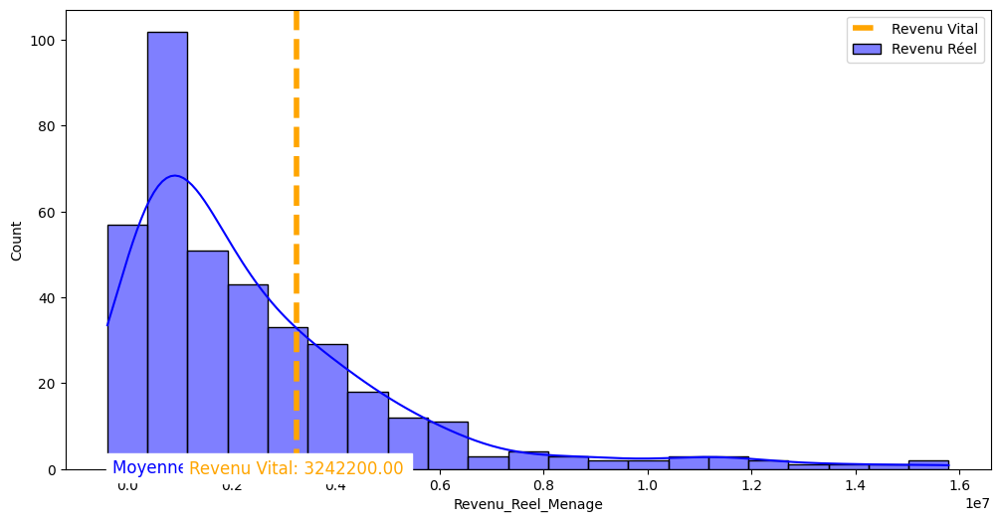

In [219]:
# Visualisation de la distribution du revenu réel avec une ligne pour le revenu vital
plt.figure(figsize=(12, 6))

# Histogramme pour le Revenu Réel
sns.histplot(df['Revenu_Reel_Menage'], color='blue', kde=True, label='Revenu Réel')

# Ajout d'une ligne verticale pour le Revenu Vital avec une épaisseur de ligne augmentée
plt.axvline(df['Revenu_vital_menage'].iloc[0], color='orange', linestyle='--', label='Revenu Vital', linewidth=4)

# Calcul de la moyenne du Revenu Réel
moyenne_revenu_reel = df['Revenu_Reel_Menage'].mean()

# Placer les textes à l'intérieur de l'espace visible
# Ajout du texte avec la moyenne du Revenu Réel
plt.text(moyenne_revenu_reel, 0.2, f'Moyenne Revenu Réel: {moyenne_revenu_reel:.2f}', 
         color='blue', fontsize=12, ha='center', va='center', backgroundcolor='white')

# Ajout du texte avec le Revenu Vital
plt.text(df['Revenu_vital_menage'].iloc[0], 0.1, f'Revenu Vital: {df["Revenu_vital_menage"].iloc[0]:.2f}', 
         color='orange', fontsize=12, ha='center', va='center', backgroundcolor='white')

# Ajout de la légende et du titre
plt.legend()

# Affichage du graphique
plt.show()


In [220]:
import pandas as pd
import statsmodels.api as sm
import numpy as np

# Liste des variables indépendantes à utiliser
independent_vars = [
    'Revenu_Agro_Pastoral', 'Revenu_Autres_Sources', 'Taille_Menage',
    'Age_Chef_Menage', 'Genre_chef_ménage', 'Niveau_Education_Chef',
    'Superf_total_menage', 'Encadr_agronomique', 'Revenu_speculation',
    'Organisation_production_agricole', 'Semences_selectionne',
    'cultures_annuelles_an', 'cultures_perennes_an', 'cultures_rente_an'
]

# Supprimer les lignes où la variable cible 'Ecart_RV_RR' est manquante
df_clean = df.dropna(subset=['Ecart_RV_RR'])

# Remplacer les valeurs manquantes dans les variables indépendantes par la moyenne
for var in independent_vars:
    df_clean[var] = df_clean[var].fillna(df_clean[var].mean())

# Convertir toutes les colonnes en numériques (si ce n'est pas déjà le cas)
df_clean[independent_vars] = df_clean[independent_vars].apply(pd.to_numeric, errors='coerce')

# Convertir la variable cible y en numérique
y_clean = pd.to_numeric(df_clean['Ecart_RV_RR'], errors='coerce')

# Vérifier si des NaN existent dans les variables indépendantes ou dans y
if y_clean.isnull().any():
    print("Il y a des valeurs manquantes dans la variable dépendante.")
else:
    print("Aucune valeur manquante dans la variable dépendante.")

# Vérifier si des valeurs infinies existent dans les données
if np.isinf(df_clean[independent_vars].values).any() or np.isinf(y_clean).any():
    print("Attention : Il y a des valeurs infinies dans les données.")
    df_clean[independent_vars] = df_clean[independent_vars].replace([np.inf, -np.inf], np.nan)
    df_clean = df_clean.dropna(subset=independent_vars + ['Ecart_RV_RR'])

# Extraire X (variables indépendantes) et y (variable dépendante)
X_clean = df_clean[independent_vars]

# Ajouter une constante pour l'interception
X_clean = sm.add_constant(X_clean)

# Entraîner le modèle Probit
try:
    model = sm.Probit(y_clean, X_clean)
    result = model.fit()

    # Afficher les résultats
    print(result.summary())
except Exception as e:
    print(f"Erreur lors de l'entraînement du modèle : {e}")


Aucune valeur manquante dans la variable dépendante.
Optimization terminated successfully.
         Current function value: nan
         Iterations 22
                          Probit Regression Results                           
Dep. Variable:            Ecart_RV_RR   No. Observations:                  383
Model:                         Probit   Df Residuals:                      368
Method:                           MLE   Df Model:                           14
Date:                Mon, 03 Mar 2025   Pseudo R-squ.:                     nan
Time:                        16:17:25   Log-Likelihood:                    nan
converged:                       True   LL-Null:                       -226.87
Covariance Type:            nonrobust   LLR p-value:                       nan
                                       coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
const          

c:\Users\Audace\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\discrete\discrete_model.py:2875: RuntimeWarning: divide by zero encountered in divide
  L = q*self.pdf(q*XB)/self.cdf(q*XB)
c:\Users\Audace\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\discrete\discrete_model.py:2875: RuntimeWarning: invalid value encountered in divide
  L = q*self.pdf(q*XB)/self.cdf(q*XB)
c:\Users\Audace\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\discrete\discrete_model.py:2876: RuntimeWarning: invalid value encountered in multiply
  return np.dot(-L*(L+XB)*X.T,X)


In [221]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.tools import add_constant

# Nettoyage des données
# Remplacer les valeurs manquantes par les moyennes des colonnes numériques
df.fillna(df.mean(), inplace=True)

# Remplacer les valeurs infinies par des valeurs arrondies à 2 décimales
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.fillna(df.mean(), inplace=True)  # Re-remplacer les valeurs infinies par la moyenne

# Transformation des variables catégorielles en variables dummy (pour celles qui sont catégorielles)
# Exemple : 'Zone_Collecte_Donnees', 'Situation_Matrimoniale_Chef', 'Niveau_Education_Chef', etc.
df = pd.get_dummies(df, drop_first=True)

# Définir la variable dépendante et les variables indépendantes
X = df[['Revenu_Reel_Menage', 'Ecart_RV_RR', 'Age_Chef_Menage', 'Genre_chef_ménage',
        'Situation_Matrimoniale_Chef', 'Niveau_Education_Chef', 'Activit_chef_ménage',
        'Taille_Menage', 'Organisation_production_agricole', 'Mode_Acces_terre', 
        'Superf_total_menage', 'Encadr_agronomique', 'Semences_selectionne', 'Main_oeuvre',
        'Experience_Agricole', 'Nombre_Saisons', 'cultures_annuelles_an', 
        'cultures_perennes_an', 'cultures_rente_an', 'Duree_Stock_SaisonA', 
        'Duree_Stock_SaisonB', 'Duree_Stock_SaisonC']]  # Variables indépendantes

y = df['Classement_SCA']  # Variable dépendante

# Ajouter une constante (intercept) dans les variables indépendantes
X = add_constant(X)

# Construction du modèle logistique multinomiale
model = sm.MNLogit(y, X)
result = model.fit()

# Résumé des résultats
print(result.summary())

# Coefficients, Écarts-types, P-values et Intervalles de Confiance
# Coefficients
coefficients = result.params
print("\nCoefficients:\n", coefficients)

# Écarts-types
std_errors = result.bse
print("\nÉcarts-types:\n", std_errors)

# P-values
p_values = result.pvalues
print("\nP-values:\n", p_values)

# Intervalles de confiance à 95%
conf_int = result.conf_int()
print("\nIntervalles de Confiance à 95%:\n", conf_int)

# Interprétation des modalités de référence :
# Les coefficients du modèle correspondent à la comparaison entre les catégories de 'Classement_SCA' et la catégorie de référence (c'est-à-dire la catégorie 'Pauvre' si l'on suit les modalités de la variable).



Optimization terminated successfully.
         Current function value: 0.818221
         Iterations 8
                          MNLogit Regression Results                          
Dep. Variable:         Classement_SCA   No. Observations:                  383
Model:                        MNLogit   Df Residuals:                      337
Method:                           MLE   Df Model:                           44
Date:                Mon, 03 Mar 2025   Pseudo R-squ.:                  0.2051
Time:                        16:17:25   Log-Likelihood:                -313.38
converged:                       True   LL-Null:                       -394.23
Covariance Type:            nonrobust   LLR p-value:                 2.339e-15
                Classement_SCA=2       coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
const                                6.8809      2.129      3.23

In [222]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.tools import add_constant

# Nettoyage des données
df.fillna(df.mean(), inplace=True)  # Remplacer les valeurs manquantes par les moyennes
df.replace([np.inf, -np.inf], np.nan, inplace=True)  # Remplacer les valeurs infinies par NaN
df.fillna(df.mean(), inplace=True)  # Re-remplacer les valeurs infinies par la moyenne

# Transformation des variables catégorielles en variables dummy
df = pd.get_dummies(df, drop_first=True)

# Définir les variables indépendantes (X) et dépendante (y)
X = df[['Revenu_Reel_Menage', 'Ecart_RV_RR', 'Age_Chef_Menage', 'Genre_chef_ménage',
        'Situation_Matrimoniale_Chef', 'Niveau_Education_Chef', 'Activit_chef_ménage',
        'Taille_Menage', 'Organisation_production_agricole', 'Mode_Acces_terre', 
        'Superf_total_menage', 'Encadr_agronomique', 'Semences_selectionne', 'Main_oeuvre',
        'Experience_Agricole', 'Nombre_Saisons', 'cultures_annuelles_an', 
        'cultures_perennes_an', 'cultures_rente_an', 'Duree_Stock_SaisonA', 
        'Duree_Stock_SaisonB', 'Duree_Stock_SaisonC']]
y = df['Classement_SCA']

# Ajouter une constante (intercept)
X = add_constant(X)

# Construction du modèle logistique multinomial
model = sm.MNLogit(y, X)
result = model.fit()

# Calcul des effets marginaux
margeff = result.get_margeff()  # Calcul des effets marginaux par défaut (méthode "dydx")
margeff_summary = margeff.summary_frame()  # Récupérer les résultats sous forme de DataFrame

# Traiter les effets marginaux
margeff_results = []
categories = [col.split(',')[0].strip() for col in margeff_summary.columns]  # Extraire les catégories
unique_categories = list(set(categories))  # Obtenir les catégories uniques

for category in unique_categories:
    for variable in margeff_summary.index:
        try:
            # Créer une entrée pour chaque combinaison variable-catégorie
            margeff_results.append({
                'Variable': variable,  # Nom de la variable
                'Category': category,  # Catégorie correspondante
                'Marginal Effect': margeff_summary.loc[variable, f"{category}, dy/dx"],
                'Std Err (ME)': margeff_summary.loc[variable, f"{category}, std err"],
                'P-value (ME)': margeff_summary.loc[variable, f"{category}, P>|z|"],
                'Lower 95% CI (ME)': margeff_summary.loc[variable, f"{category}, [0.025"],
                'Upper 95% CI (ME)': margeff_summary.loc[variable, f"{category}, 0.975]"]
            })
        except KeyError:
            continue  # Ignorer les colonnes inexistantes

# Créer un DataFrame pour les effets marginaux
margeff_df = pd.DataFrame(margeff_results)

# Exporter uniquement les effets marginaux vers un fichier Excel
if not margeff_df.empty:  # Vérifier que le DataFrame n'est pas vide
    margeff_df.to_excel('effets_marginaux.xlsx', index=False)
    print("Les effets marginaux ont été exportés avec succès dans 'effets_marginaux.xlsx'.")
else:
    print("Aucun effet marginal n'a pu être calculé.")

Optimization terminated successfully.
         Current function value: 0.818221
         Iterations 8
Aucun effet marginal n'a pu être calculé.


In [223]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.tools import add_constant

# Nettoyage des données
df.fillna(df.mean(), inplace=True)  # Remplacer les valeurs manquantes par les moyennes
df.replace([np.inf, -np.inf], np.nan, inplace=True)  # Remplacer les valeurs infinies par NaN
df.fillna(df.mean(), inplace=True)  # Re-remplacer les valeurs infinies par la moyenne

# Transformation des variables catégorielles en variables dummy
df = pd.get_dummies(df, drop_first=True)

# Définir les variables indépendantes (X) et dépendante (y)
X = df[['Revenu_Reel_Menage', 'Ecart_RV_RR', 'Age_Chef_Menage', 'Genre_chef_ménage',
        'Situation_Matrimoniale_Chef', 'Niveau_Education_Chef', 'Activit_chef_ménage',
        'Taille_Menage', 'Organisation_production_agricole', 'Mode_Acces_terre', 
        'Superf_total_menage', 'Encadr_agronomique', 'Semences_selectionne', 'Main_oeuvre',
        'Experience_Agricole', 'Nombre_Saisons', 'cultures_annuelles_an', 
        'cultures_perennes_an', 'cultures_rente_an', 'Duree_Stock_SaisonA', 
        'Duree_Stock_SaisonB', 'Duree_Stock_SaisonC']]
y = df['Classement_SCA']

# Ajouter une constante (intercept)
X = add_constant(X)

# Construction du modèle logistique multinomial
model = sm.MNLogit(y, X)
result = model.fit()

# Extraire les informations nécessaires
coefficients = result.params.values.flatten()  # Coefficients
std_errors = result.bse.values.flatten()       # Écarts-types
p_values = result.pvalues.values.flatten()     # P-valeurs

# Gérer les intervalles de confiance
conf_int = result.conf_int()  # Obtenir tous les intervalles de confiance
conf_int_lower = conf_int.iloc[:, 0].values.flatten()  # Bornes inférieures
conf_int_upper = conf_int.iloc[:, 1].values.flatten()  # Bornes supérieures

# Générer les noms des variables
variable_names = []
for category in result.params.columns:
    for variable in result.params.index:
        variable_names.append(f"{variable} -> {category}")

# Créer un DataFrame contenant tous les résultats des coefficients
results_df = pd.DataFrame({
    'Variable': variable_names,
    'Coefficient': coefficients,
    'Std Err': std_errors,
    'P-value': p_values,
    'Lower 95% CI': conf_int_lower,
    'Upper 95% CI': conf_int_upper
})

# Calculer les effets marginaux
margeff = result.get_margeff()  # Calcul des effets marginaux par défaut (méthode "dydx")
margeff_summary = margeff.summary_frame()  # Récupérer les résultats sous forme de DataFrame

# Afficher les colonnes de margeff_summary pour mieux comprendre leur structure
print(margeff_summary.columns)

# Extraire les effets marginaux et les autres informations
margeff_results = []
for variable in margeff_summary.index:
    for category in margeff_summary.columns:
        # Construire une clé d'accès pour le dy/dx et autres valeurs
        dy_dx_column = f"{category}, dy/dx"  # Ajuster le nom de la colonne pour "dy/dx"
        std_err_column = f"{category}, std err"
        p_value_column = f"{category}, P>|z|"
        ci_lower_column = f"{category}, [0.025"
        ci_upper_column = f"{category}, 0.975]"

        # Vérifier si la colonne existe avant d'essayer de l'extraire
        if dy_dx_column in margeff_summary.columns:
            margeff_results.append({
                'Variable': f"{variable} -> {category}",
                'Marginal Effect': margeff_summary.loc[variable, dy_dx_column],
                'Std Err (ME)': margeff_summary.loc[variable, std_err_column],
                'P-value (ME)': margeff_summary.loc[variable, p_value_column],
                'Lower 95% CI (ME)': margeff_summary.loc[variable, ci_lower_column],
                'Upper 95% CI (ME)': margeff_summary.loc[variable, ci_upper_column]
            })

margeff_df = pd.DataFrame(margeff_results)

# Configuration de Pandas pour afficher toutes les lignes et colonnes
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
pd.set_option('display.float_format', '{:,.5f}'.format)

# Afficher les résultats des coefficients et des effets marginaux
print("Résultats des coefficients :")
print(results_df)
print("\nEffets marginaux :")
print(margeff_df)

# Exporter les résultats dans un fichier Excel
with pd.ExcelWriter('resultats_modele_logistique11.xlsx') as writer:
    results_df.to_excel(writer, sheet_name='Coefficients', index=False)
    margeff_df.to_excel(writer, sheet_name='Effets marginaux', index=False)


Optimization terminated successfully.
         Current function value: 0.818221
         Iterations 8
Index(['dy/dx', 'Std. Err.', 'z', 'Pr(>|z|)', 'Conf. Int. Low', 'Cont. Int. Hi.'], dtype='object')
Résultats des coefficients :
                                 Variable  Coefficient  Std Err  P-value  Lower 95% CI  Upper 95% CI
0                              const -> 0      6.88088  2.12850  0.00123       2.70909      11.05267
1                 Revenu_Reel_Menage -> 0      6.54263  2.12460  0.00207      -0.00000       0.00000
2                        Ecart_RV_RR -> 0     -0.00000  0.00000  0.21143      -1.66082       1.84518
3                    Age_Chef_Menage -> 0     -0.00000  0.00000  0.17366      -0.04154       0.02455
4                  Genre_chef_ménage -> 0      0.09218  0.89440  0.91792      -1.57761       1.14997
5        Situation_Matrimoniale_Chef -> 0      0.61810  0.87052  0.47768      -0.70191       0.08991
6              Niveau_Education_Chef -> 0     -0.00849  0.01686

In [224]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.tools import add_constant

# Nettoyage des données
df.fillna(df.mean(), inplace=True)  # Remplacer les valeurs manquantes par les moyennes
df.replace([np.inf, -np.inf], np.nan, inplace=True)  # Remplacer les valeurs infinies par NaN
df.fillna(df.mean(), inplace=True)  # Re-remplacer les valeurs infinies par la moyenne

# Transformation des variables catégorielles en variables dummy
df = pd.get_dummies(df, drop_first=True)

# Définir les variables indépendantes (X) et dépendante (y)
X = df[['Revenu_Reel_Menage', 'Ecart_RV_RR', 'Age_Chef_Menage', 'Genre_chef_ménage',
        'Situation_Matrimoniale_Chef', 'Niveau_Education_Chef', 'Activit_chef_ménage',
        'Taille_Menage', 'Organisation_production_agricole', 'Mode_Acces_terre', 
        'Superf_total_menage', 'Encadr_agronomique', 'Semences_selectionne', 'Main_oeuvre',
        'Experience_Agricole', 'Nombre_Saisons', 'cultures_annuelles_an', 
        'cultures_perennes_an', 'cultures_rente_an', 'Duree_Stock_SaisonA', 
        'Duree_Stock_SaisonB', 'Duree_Stock_SaisonC']]
y = df['Classement_SCA']

# Ajouter une constante (intercept)
X = add_constant(X)

# Construction du modèle logistique multinomial
model = sm.MNLogit(y, X)
result = model.fit()

# Extraire les informations nécessaires
coefficients = result.params.values.flatten()  # Coefficients
std_errors = result.bse.values.flatten()       # Écarts-types
p_values = result.pvalues.values.flatten()     # P-valeurs

# Gérer les intervalles de confiance
conf_int = result.conf_int()  # Obtenir tous les intervalles de confiance
conf_int_lower = conf_int.iloc[:, 0].values.flatten()  # Bornes inférieures
conf_int_upper = conf_int.iloc[:, 1].values.flatten()  # Bornes supérieures

# Générer les noms des variables
variable_names = []
for category in result.params.columns:
    for variable in result.params.index:
        variable_names.append(f"{variable} -> {category}")

# Créer un DataFrame contenant tous les résultats des coefficients
results_df = pd.DataFrame({
    'Variable': variable_names,
    'Coefficient': coefficients,
    'Std Err': std_errors,
    'P-value': p_values,
    'Lower 95% CI': conf_int_lower,
    'Upper 95% CI': conf_int_upper
})

# Calculer les effets marginaux
margeff = result.get_margeff()  # Calcul des effets marginaux par défaut (méthode "dydx")
margeff_summary = margeff.summary_frame()  # Récupérer les résultats sous forme de DataFrame

# Afficher le contenu de margeff_summary pour déboguer
print("Contenu de margeff_summary :")
print(margeff_summary)

# Afficher les colonnes de margeff_summary pour mieux comprendre leur structure
print("Colonnes de margeff_summary :")
print(margeff_summary.columns)

# Extraire les effets marginaux et les autres informations
margeff_results = []
for variable in margeff_summary.index:
    for category in margeff_summary.columns:
        # Vérifier si la colonne existe avant d'essayer de l'extraire
        dy_dx_column = f"{category}, dy/dx"  # Ajuster le nom de la colonne pour "dy/dx"
        std_err_column = f"{category}, std err"
        p_value_column = f"{category}, P>|z|"
        ci_lower_column = f"{category}, [0.025"
        ci_upper_column = f"{category}, 0.975]"

        if dy_dx_column in margeff_summary.columns:
            margeff_results.append({
                'Variable': f"{variable} -> {category}",
                'Marginal Effect': margeff_summary.loc[variable, dy_dx_column],
                'Std Err (ME)': margeff_summary.loc[variable, std_err_column],
                'P-value (ME)': margeff_summary.loc[variable, p_value_column],
                'Lower 95% CI (ME)': margeff_summary.loc[variable, ci_lower_column],
                'Upper 95% CI (ME)': margeff_summary.loc[variable, ci_upper_column]
            })

margeff_df = pd.DataFrame(margeff_results)

# Afficher les effets marginaux extraits
print("Effets marginaux extraits :")
print(margeff_df)
# Configuration de Pandas pour afficher toutes les lignes et colonnes
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
pd.set_option('display.float_format', '{:,.5f}'.format)

# Exporter les résultats dans un fichier Excel
with pd.ExcelWriter('resultats_modele_logistique12.xlsx') as writer:
    results_df.to_excel(writer, sheet_name='Coefficients', index=False)
    margeff_df.to_excel(writer, sheet_name='Effets marginaux', index=False)



Optimization terminated successfully.
         Current function value: 0.818221
         Iterations 8
Contenu de margeff_summary :
                                                     dy/dx  Std. Err.        z  Pr(>|z|)  Conf. Int. Low  Cont. Int. Hi.
endog            exog                                                                                                   
Classement_SCA=1 Revenu_Reel_Menage                0.00000    0.00000  1.36753   0.17146        -0.00000         0.00000
                 Ecart_RV_RR                      -0.03428    0.08243 -0.41591   0.67748        -0.19584         0.12727
                 Age_Chef_Menage                   0.00135    0.00153  0.88816   0.37445        -0.00163         0.00434
                 Genre_chef_ménage                 0.03834    0.06158  0.62256   0.53357        -0.08236         0.15903
                 Situation_Matrimoniale_Chef       0.02035    0.01769  1.15048   0.24995        -0.01432         0.05502
                 Nivea

In [225]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.tools import add_constant

# Nettoyage des données
df.fillna(df.mean(), inplace=True)  # Remplacer les valeurs manquantes par les moyennes
df.replace([np.inf, -np.inf], np.nan, inplace=True)  # Remplacer les valeurs infinies par NaN
df.fillna(df.mean(), inplace=True)  # Re-remplacer les valeurs infinies par la moyenne

# Transformation des variables catégorielles en variables dummy
df = pd.get_dummies(df, drop_first=True)

# Définir les variables indépendantes (X) et dépendante (y)
X = df[['Revenu_Reel_Menage', 'Revenu_vital_menage', 'Revenu_Agro_Pastoral', 'Depenses_Annuel',
        'Taille_Menage', 'Age_Chef_Menage', 'Genre_chef_ménage', 'Situation_Matrimoniale_Chef', 
        'Superf_total_menage', 'Encadr_agronomique', 'Semences_selectionne', 'Main_oeuvre', 
        'Nb_Pieces_Logement', 'Pluies_Excessives', 'Maladie_Cultures', 
        'Vol_Destruction_Actifs']]
y = df['Classement_SCA']

# Ajouter une constante (intercept)
X = add_constant(X)

# Construction du modèle logistique multinomial
model = sm.MNLogit(y, X)
result = model.fit()

# Extraire les informations nécessaires
coefficients = result.params.values.flatten()  # Coefficients
std_errors = result.bse.values.flatten()       # Écarts-types
p_values = result.pvalues.values.flatten()     # P-valeurs

# Gérer les intervalles de confiance
conf_int = result.conf_int()  # Obtenir tous les intervalles de confiance
conf_int_lower = conf_int.iloc[:, 0].values.flatten()  # Bornes inférieures
conf_int_upper = conf_int.iloc[:, 1].values.flatten()  # Bornes supérieures

# Générer les noms des variables
variable_names = []
for category in result.params.columns:
    for variable in result.params.index:
        variable_names.append(f"{variable} -> {category}")

# Créer un DataFrame contenant tous les résultats des coefficients
results_df = pd.DataFrame({
    'Variable': variable_names,
    'Coefficient': coefficients,
    'Std Err': std_errors,
    'P-value': p_values,
    'Lower 95% CI': conf_int_lower,
    'Upper 95% CI': conf_int_upper
})

# Affichage des résultats des coefficients
print("Résultats des coefficients:")
print(results_df)

# Calculer les effets marginaux
print("\nCalcul des effets marginaux...")
try:
    margeff = result.get_margeff()  # Calcul des effets marginaux
    print("\nEffets marginaux calculés avec succès.")
    
    # Résumé des effets marginaux
    margeff_summary = margeff.summary_frame()
    print("\nRésumé des effets marginaux bruts:")
    print(margeff_summary)
    
    # Extraire les effets marginaux et les autres informations
    margeff_results = []
    for variable in margeff_summary.index:
        for category in margeff_summary.columns.levels[0]:  # Parcourir les niveaux des colonnes
            if 'dy/dx' in margeff_summary[category]:  # Vérifier si "dy/dx" est présent
                dy_dx = margeff_summary[category]['dy/dx'][variable]
                std_err = margeff_summary[category]['std err'][variable]
                p_value = margeff_summary[category]['P>|z|'][variable]
                ci_lower = margeff_summary[category]['[0.025'][variable]
                ci_upper = margeff_summary[category]['0.975]'][variable]
                
                margeff_results.append({
                    'Variable': f"{variable} -> {category}",
                    'Marginal Effect': dy_dx,
                    'Std Err (ME)': std_err,
                    'P-value (ME)': p_value,
                    'Lower 95% CI (ME)': ci_lower,
                    'Upper 95% CI (ME)': ci_upper
                })
    
    # Convertir les résultats en DataFrame
    margeff_df = pd.DataFrame(margeff_results)
    print("\nEffets marginaux extraits avec succès.")
    
    # Affichage des résultats des effets marginaux
    print("\nRésumé des effets marginaux extraits:")
    print(margeff_df)

except Exception as e:
    print(f"Erreur lors du calcul des effets marginaux: {e}")

# Exporter les résultats dans un fichier Excel
with pd.ExcelWriter('resultats_modele_logistique_margins.xlsx') as writer:
    # Première feuille pour les coefficients
    results_df.to_excel(writer, sheet_name='Coefficients', index=False)
    
    # Deuxième feuille pour les effets marginaux
    if not margeff_df.empty:
        margeff_df.to_excel(writer, sheet_name='Effets marginaux', index=False)
    else:
        print("\nAucun effet marginal à exporter.")

print("Les résultats des coefficients et des effets marginaux ont été exportés avec succès dans 'resultats_modele_logistique_margins.xlsx'")

Optimization terminated successfully.
         Current function value: 0.856507
         Iterations 9
Résultats des coefficients:
                            Variable  Coefficient  Std Err  P-value  Lower 95% CI  Upper 95% CI
0            Revenu_Reel_Menage -> 0     -0.00000  0.00000  0.09501      -0.00000       0.00000
1           Revenu_vital_menage -> 0      0.00000  0.00000  0.97528      -0.00000       0.00000
2          Revenu_Agro_Pastoral -> 0      0.00000  0.00000  0.15578      -0.00000       0.00000
3               Depenses_Annuel -> 0      0.00000  0.00000  0.25444       0.00000       0.00000
4                 Taille_Menage -> 0      0.00000  0.00000  0.14380      -0.24719      -0.04175
5               Age_Chef_Menage -> 0     -0.00000  0.00000  0.93434      -0.03531       0.01403
6             Genre_chef_ménage -> 0      0.00000  0.00000  0.00373      -1.88413       0.57187
7   Situation_Matrimoniale_Chef -> 0      0.00000  0.00000  0.00001      -0.42347       0.29611
8     

C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\1683775063.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mode_acces_counts.index, y=mode_acces_counts.values, palette='viridis')
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\1683775063.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=encadr_counts.index, y=encadr_counts.values, palette='pastel')
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\1683775063.py:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=rentes_counts.index, y=rentes_counts.values, palette='muted')

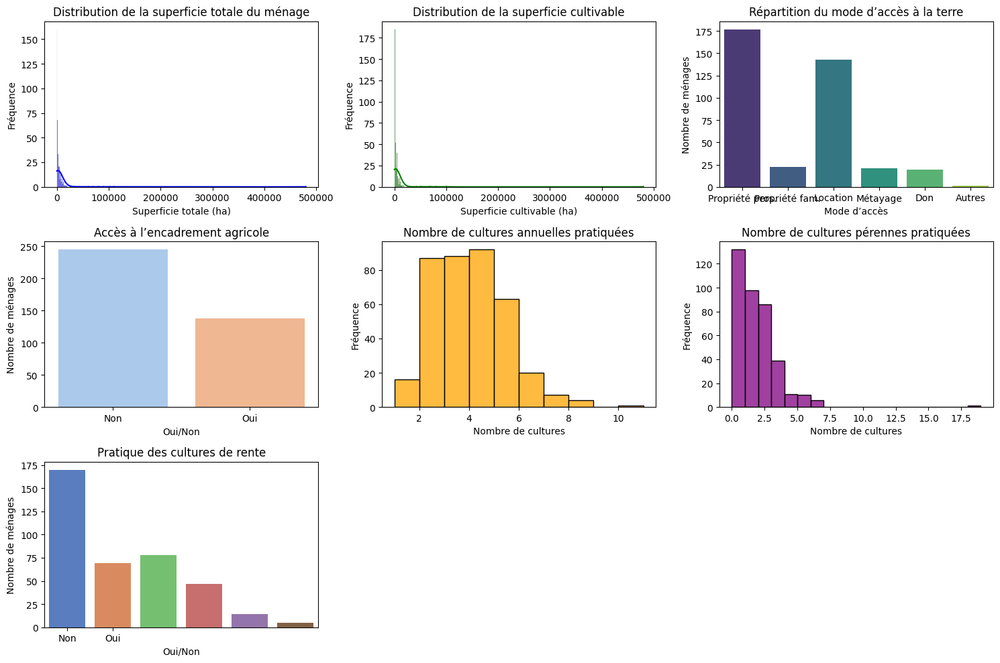

In [226]:
import matplotlib.pyplot as plt
import seaborn as sns

# Supposons que votre DataFrame est déjà chargé et nommé `df`

# Création d'une grande figure avec plusieurs sous-figures
plt.figure(figsize=(15, 10))

# Variable quantitative : Superf_total_menage
plt.subplot(3, 3, 1)
sns.histplot(df['Superf_total_menage'], kde=True, color='blue')
plt.title('Distribution de la superficie totale du ménage')
plt.xlabel('Superficie totale (ha)')
plt.ylabel('Fréquence')

# Variable quantitative : Terre_cultivable
plt.subplot(3, 3, 2)
sns.histplot(df['Terre_cultivable'], kde=True, color='green')
plt.title('Distribution de la superficie cultivable')
plt.xlabel('Superficie cultivable (ha)')
plt.ylabel('Fréquence')

# Variable catégorielle : Mode_Acces_terre
plt.subplot(3, 3, 3)
mode_acces_counts = df['Mode_Acces_terre'].value_counts().sort_index()
sns.barplot(x=mode_acces_counts.index, y=mode_acces_counts.values, palette='viridis')
plt.title('Répartition du mode d’accès à la terre')
plt.xlabel('Mode d’accès')
plt.ylabel('Nombre de ménages')
plt.xticks(ticks=range(len(mode_acces_counts)), labels=['Propriété pers.', 'Propriété fam.', 'Location', 'Métayage', 'Don', 'Autres'])

# Variable dicotomique : Encadr_agronomique
plt.subplot(3, 3, 4)
encadr_counts = df['Encadr_agronomique'].value_counts().sort_index()
sns.barplot(x=encadr_counts.index, y=encadr_counts.values, palette='pastel')
plt.title('Accès à l’encadrement agricole')
plt.xlabel('Oui/Non')
plt.ylabel('Nombre de ménages')
plt.xticks(ticks=[0, 1], labels=['Non', 'Oui'])

# Variable quantitative : cultures_annuelles_an
plt.subplot(3, 3, 5)
sns.histplot(df['cultures_annuelles_an'], kde=False, bins=range(1, df['cultures_annuelles_an'].max() + 2), color='orange')
plt.title('Nombre de cultures annuelles pratiquées')
plt.xlabel('Nombre de cultures')
plt.ylabel('Fréquence')

# Variable quantitative : cultures_perennes_an
plt.subplot(3, 3, 6)
sns.histplot(df['cultures_perennes_an'], kde=False, bins=range(df['cultures_perennes_an'].min(), df['cultures_perennes_an'].max() + 2), color='purple')
plt.title('Nombre de cultures pérennes pratiquées')
plt.xlabel('Nombre de cultures')
plt.ylabel('Fréquence')

# Variable dicotomique : cultures_rente_an
plt.subplot(3, 3, 7)
rentes_counts = df['cultures_rente_an'].value_counts().sort_index()
sns.barplot(x=rentes_counts.index, y=rentes_counts.values, palette='muted')
plt.title('Pratique des cultures de rente')
plt.xlabel('Oui/Non')
plt.ylabel('Nombre de ménages')
plt.xticks(ticks=[0, 1], labels=['Non', 'Oui'])

# Ajuster les espacements entre les sous-figures
plt.tight_layout()

# Afficher la figure
plt.show()

C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\3813524888.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mode_acces_counts.index, y=mode_acces_counts.values, palette='viridis')
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\3813524888.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=encadr_counts.index, y=encadr_counts.values, palette='pastel')
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\3813524888.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=rentes_counts.index, y=rentes_counts.values, palette='muted')

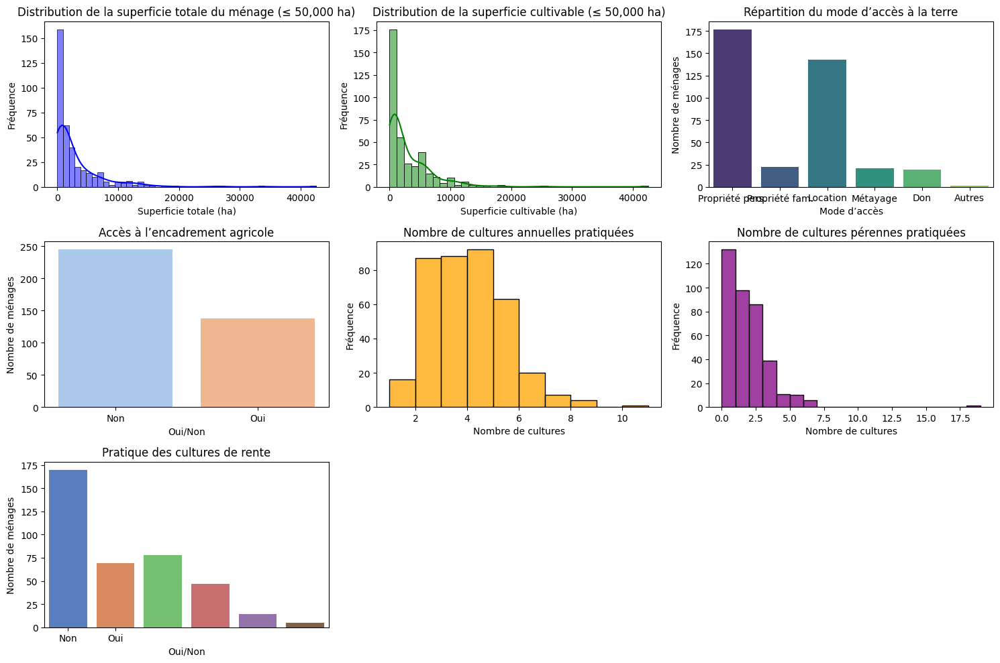

In [227]:
import matplotlib.pyplot as plt
import seaborn as sns

# Supposons que votre DataFrame est déjà chargé et nommé `df`

# Filtrer les données pour exclure les superficies supérieures à 50,000
df_filtered = df[(df['Superf_total_menage'] <= 50000) & (df['Terre_cultivable'] <= 50000)]

# Création d'une grande figure avec plusieurs sous-figures
plt.figure(figsize=(15, 10))

# Variable quantitative : Superf_total_menage (avec filtre)
plt.subplot(3, 3, 1)
sns.histplot(df_filtered['Superf_total_menage'], kde=True, color='blue')
plt.title('Distribution de la superficie totale du ménage (≤ 50,000 ha)')
plt.xlabel('Superficie totale (ha)')
plt.ylabel('Fréquence')

# Variable quantitative : Terre_cultivable (avec filtre)
plt.subplot(3, 3, 2)
sns.histplot(df_filtered['Terre_cultivable'], kde=True, color='green')
plt.title('Distribution de la superficie cultivable (≤ 50,000 ha)')
plt.xlabel('Superficie cultivable (ha)')
plt.ylabel('Fréquence')

# Variable catégorielle : Mode_Acces_terre
plt.subplot(3, 3, 3)
mode_acces_counts = df['Mode_Acces_terre'].value_counts().sort_index()
sns.barplot(x=mode_acces_counts.index, y=mode_acces_counts.values, palette='viridis')
plt.title('Répartition du mode d’accès à la terre')
plt.xlabel('Mode d’accès')
plt.ylabel('Nombre de ménages')
plt.xticks(ticks=range(len(mode_acces_counts)), labels=['Propriété pers.', 'Propriété fam.', 'Location', 'Métayage', 'Don', 'Autres'])

# Variable dicotomique : Encadr_agronomique
plt.subplot(3, 3, 4)
encadr_counts = df['Encadr_agronomique'].value_counts().sort_index()
sns.barplot(x=encadr_counts.index, y=encadr_counts.values, palette='pastel')
plt.title('Accès à l’encadrement agricole')
plt.xlabel('Oui/Non')
plt.ylabel('Nombre de ménages')
plt.xticks(ticks=[0, 1], labels=['Non', 'Oui'])

# Variable quantitative : cultures_annuelles_an
plt.subplot(3, 3, 5)
sns.histplot(df['cultures_annuelles_an'], kde=False, bins=range(1, df['cultures_annuelles_an'].max() + 2), color='orange')
plt.title('Nombre de cultures annuelles pratiquées')
plt.xlabel('Nombre de cultures')
plt.ylabel('Fréquence')

# Variable quantitative : cultures_perennes_an
plt.subplot(3, 3, 6)
sns.histplot(df['cultures_perennes_an'], kde=False, bins=range(df['cultures_perennes_an'].min(), df['cultures_perennes_an'].max() + 2), color='purple')
plt.title('Nombre de cultures pérennes pratiquées')
plt.xlabel('Nombre de cultures')
plt.ylabel('Fréquence')

# Variable dicotomique : cultures_rente_an
plt.subplot(3, 3, 7)
rentes_counts = df['cultures_rente_an'].value_counts().sort_index()
sns.barplot(x=rentes_counts.index, y=rentes_counts.values, palette='muted')
plt.title('Pratique des cultures de rente')
plt.xlabel('Oui/Non')
plt.ylabel('Nombre de ménages')
plt.xticks(ticks=[0, 1], labels=['Non', 'Oui'])

# Ajuster les espacements entre les sous-figures
plt.tight_layout()

# Afficher la figure
plt.show()

C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\1532155674.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mode_acces_counts.index, y=mode_acces_counts.values, palette='viridis')
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\1532155674.py:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=encadr_counts.index, y=encadr_counts.values, palette='pastel')


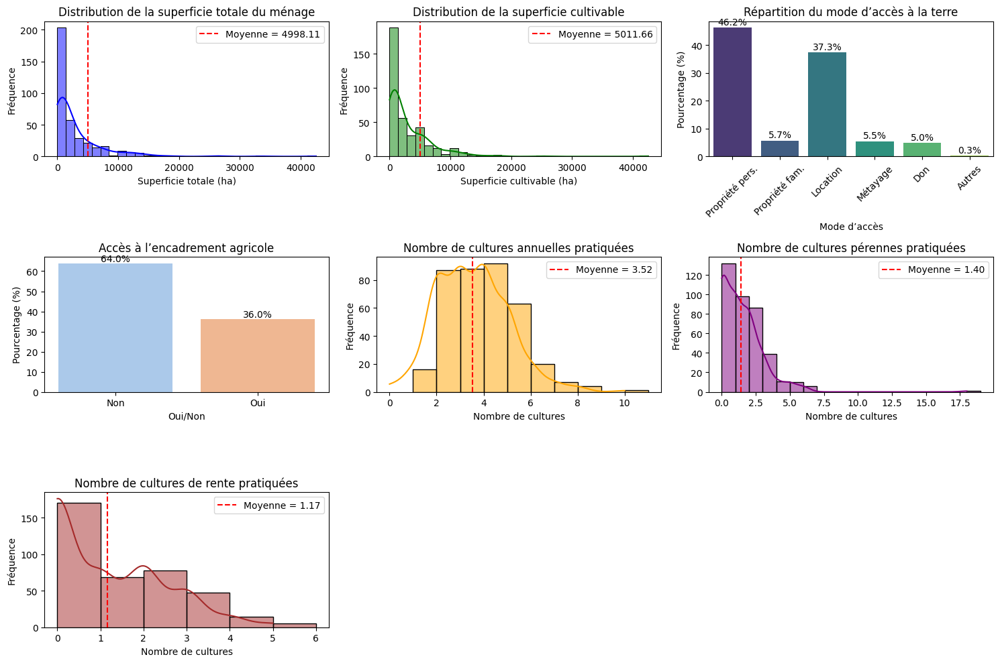

In [228]:
import matplotlib.pyplot as plt
import seaborn as sns

# Supposons que votre DataFrame est déjà chargé et nommé `df`

# Filtrer les données pour exclure les superficies supérieures à 50,000
df_filtered = df[(df['Superf_total_menage'] <= 50000) & (df['Terre_cultivable'] <= 50000)]

# Création d'une grande figure avec plusieurs sous-figures
plt.figure(figsize=(15, 10))

# Variable quantitative : Superf_total_menage (avec filtre)
plt.subplot(3, 3, 1)
sns.histplot(df_filtered['Superf_total_menage'], kde=True, color='blue', bins=30)
mean_value = df_filtered['Superf_total_menage'].mean() + 2000
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')
plt.title('Distribution de la superficie totale du ménage')
plt.xlabel('Superficie totale (ha)')
plt.ylabel('Fréquence')
plt.legend()

# Variable quantitative : Terre_cultivable (avec filtre)
plt.subplot(3, 3, 2)
sns.histplot(df_filtered['Terre_cultivable'], kde=True, color='green', bins=30)
mean_value = df_filtered['Terre_cultivable'].mean() + 2000
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')
plt.title('Distribution de la superficie cultivable')
plt.xlabel('Superficie cultivable (ha)')
plt.ylabel('Fréquence')
plt.legend()

# Variable catégorielle : Mode_Acces_terre
plt.subplot(3, 3, 3)
mode_acces_counts = df['Mode_Acces_terre'].value_counts(normalize=True).sort_index() * 100  # Pourcentage
sns.barplot(x=mode_acces_counts.index, y=mode_acces_counts.values, palette='viridis')
plt.title('Répartition du mode d’accès à la terre')
plt.xlabel('Mode d’accès')
plt.ylabel('Pourcentage (%)')
plt.xticks(ticks=range(len(mode_acces_counts)), labels=(['Propriété pers.', 'Propriété fam.', 'Location', 'Métayage', 'Don', 'Autres']), rotation=45)
for i, v in enumerate(mode_acces_counts.values):
    plt.text(i, v + 1, f'{v:.1f}%', ha='center')

# Variable dicotomique : Encadr_agronomique
plt.subplot(3, 3, 4)
encadr_counts = df['Encadr_agronomique'].value_counts(normalize=True).sort_index() * 100  # Pourcentage
sns.barplot(x=encadr_counts.index, y=encadr_counts.values, palette='pastel')
plt.title('Accès à l’encadrement agricole')
plt.xlabel('Oui/Non')
plt.ylabel('Pourcentage (%)')
plt.xticks(ticks=[0, 1], labels=['Non', 'Oui'])
for i, v in enumerate(encadr_counts.values):
    plt.text(i, v + 1, f'{v:.1f}%', ha='center')

# Variable quantitative : cultures_annuelles_an
plt.subplot(3, 3, 5)
sns.histplot(df['cultures_annuelles_an'], kde=True, color='orange', bins=range(1, df['cultures_annuelles_an'].max() + 2))
mean_value = df['cultures_annuelles_an'].mean()
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')
plt.title('Nombre de cultures annuelles pratiquées')
plt.xlabel('Nombre de cultures')
plt.ylabel('Fréquence')
plt.legend()

# Variable quantitative : cultures_perennes_an
plt.subplot(3, 3, 6)
sns.histplot(df['cultures_perennes_an'], kde=True, color='purple', bins=range(df['cultures_perennes_an'].min(), df['cultures_perennes_an'].max() + 2))
mean_value = df['cultures_perennes_an'].mean()
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')
plt.title('Nombre de cultures pérennes pratiquées')
plt.xlabel('Nombre de cultures')
plt.ylabel('Fréquence')
plt.legend()

# Variable quantitative : cultures_rente_an
plt.subplot(3, 3, 7)
sns.histplot(df['cultures_rente_an'], kde=True, color='brown', bins=range(df['cultures_rente_an'].min(), df['cultures_rente_an'].max() + 2))
mean_value = df['cultures_rente_an'].mean()
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')
plt.title('Nombre de cultures de rente pratiquées')
plt.xlabel('Nombre de cultures')
plt.ylabel('Fréquence')
plt.legend()

# Ajuster les espacements entre les sous-figures
plt.tight_layout()

# Afficher la figure
plt.show()

C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\3454486208.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mode_acces_counts.index, y=mode_acces_counts.values, palette='viridis')
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\3454486208.py:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=encadr_counts.index, y=encadr_counts.values, palette='pastel')


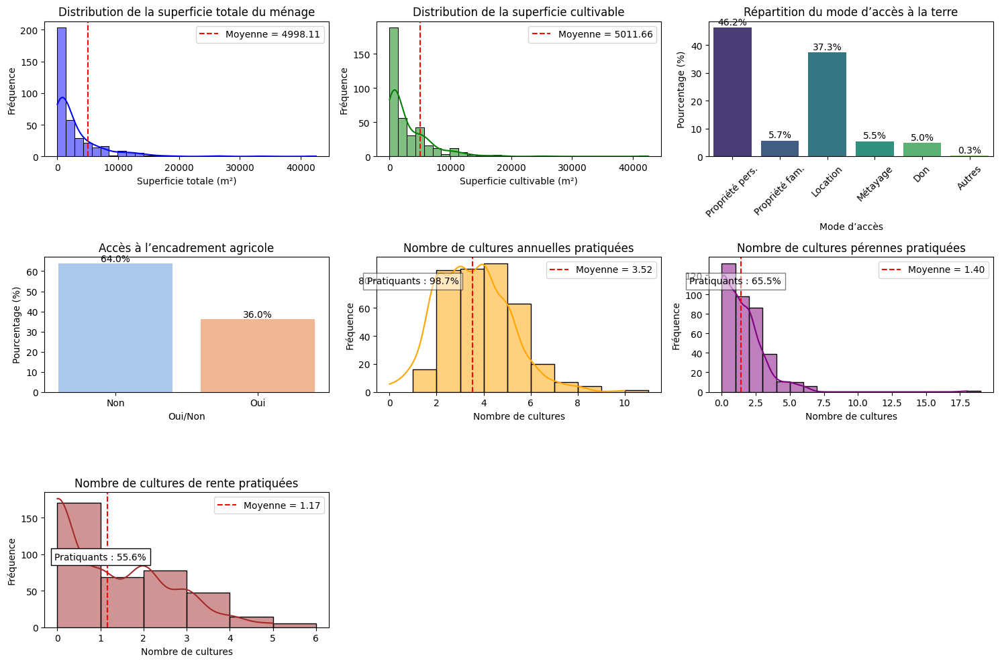

In [229]:
import matplotlib.pyplot as plt
import seaborn as sns

# Supposons que votre DataFrame est déjà chargé et nommé `df`

# Filtrer les données pour exclure les superficies supérieures à 50,000
df_filtered = df[(df['Superf_total_menage'] <= 50000) & (df['Terre_cultivable'] <= 50000)]

# Création d'une grande figure avec plusieurs sous-figures
plt.figure(figsize=(15, 10))

# Variable quantitative : Superf_total_menage (avec filtre)
plt.subplot(3, 3, 1)
sns.histplot(df_filtered['Superf_total_menage'], kde=True, color='blue', bins=30)
mean_value = df_filtered['Superf_total_menage'].mean() + 2000
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')
plt.title('Distribution de la superficie totale du ménage')
plt.xlabel('Superficie totale (m²)')
plt.ylabel('Fréquence')
plt.legend()

# Variable quantitative : Terre_cultivable (avec filtre)
plt.subplot(3, 3, 2)
sns.histplot(df_filtered['Terre_cultivable'], kde=True, color='green', bins=30)
mean_value = df_filtered['Terre_cultivable'].mean() + 2000
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')
plt.title('Distribution de la superficie cultivable')
plt.xlabel('Superficie cultivable (m²)')
plt.ylabel('Fréquence')
plt.legend()

# Variable catégorielle : Mode_Acces_terre
plt.subplot(3, 3, 3)
mode_acces_counts = df['Mode_Acces_terre'].value_counts(normalize=True).sort_index() * 100  # Pourcentage
sns.barplot(x=mode_acces_counts.index, y=mode_acces_counts.values, palette='viridis')
plt.title('Répartition du mode d’accès à la terre')
plt.xlabel('Mode d’accès')
plt.ylabel('Pourcentage (%)')
plt.xticks(ticks=range(len(mode_acces_counts)), labels=['Propriété pers.', 'Propriété fam.', 'Location', 'Métayage', 'Don', 'Autres'], rotation=45)
for i, v in enumerate(mode_acces_counts.values):
    plt.text(i, v + 1, f'{v:.1f}%', ha='center')

# Variable dicotomique : Encadr_agronomique
plt.subplot(3, 3, 4)
encadr_counts = df['Encadr_agronomique'].value_counts(normalize=True).sort_index() * 100  # Pourcentage
sns.barplot(x=encadr_counts.index, y=encadr_counts.values, palette='pastel')
plt.title('Accès à l’encadrement agricole')
plt.xlabel('Oui/Non')
plt.ylabel('Pourcentage (%)')
plt.xticks(ticks=[0, 1], labels=['Non', 'Oui'])
for i, v in enumerate(encadr_counts.values):
    plt.text(i, v + 1, f'{v:.1f}%', ha='center')

# Variable quantitative : cultures_annuelles_an
plt.subplot(3, 3, 5)
sns.histplot(df['cultures_annuelles_an'], kde=True, color='orange', bins=range(1, df['cultures_annuelles_an'].max() + 2))
mean_value = df['cultures_annuelles_an'].mean()
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')

# Calcul du pourcentage de ménages pratiquant des cultures annuelles
total_menages = len(df)
menages_pratiquants = (df['cultures_annuelles_an'] > 0).sum()
pourcentage_pratiquants = (menages_pratiquants / total_menages) * 100
plt.text(1, max(plt.ylim()) * 0.8, f'Pratiquants : {pourcentage_pratiquants:.1f}%', fontsize=10, ha='center', bbox=dict(facecolor='white', alpha=0.5))

plt.title('Nombre de cultures annuelles pratiquées')
plt.xlabel('Nombre de cultures')
plt.ylabel('Fréquence')
plt.legend()

# Variable quantitative : cultures_perennes_an
plt.subplot(3, 3, 6)
sns.histplot(df['cultures_perennes_an'], kde=True, color='purple', bins=range(df['cultures_perennes_an'].min(), df['cultures_perennes_an'].max() + 2))
mean_value = df['cultures_perennes_an'].mean()
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')

# Calcul du pourcentage de ménages pratiquant des cultures pérennes
menages_pratiquants = (df['cultures_perennes_an'] > 0).sum()
pourcentage_pratiquants = (menages_pratiquants / total_menages) * 100
plt.text(1, max(plt.ylim()) * 0.8, f'Pratiquants : {pourcentage_pratiquants:.1f}%', fontsize=10, ha='center', bbox=dict(facecolor='white', alpha=0.5))

plt.title('Nombre de cultures pérennes pratiquées')
plt.xlabel('Nombre de cultures')
plt.ylabel('Fréquence')
plt.legend()

# Variable quantitative : cultures_rente_an
plt.subplot(3, 3, 7)
sns.histplot(df['cultures_rente_an'], kde=True, color='brown', bins=range(df['cultures_rente_an'].min(), df['cultures_rente_an'].max() + 2))
mean_value = df['cultures_rente_an'].mean()
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')

# Calcul du pourcentage de ménages pratiquant des cultures de rente
menages_pratiquants = (df['cultures_rente_an'] > 0).sum()
pourcentage_pratiquants = (menages_pratiquants / total_menages) * 100
plt.text(1, max(plt.ylim()) * 0.5, f'Pratiquants : {pourcentage_pratiquants:.1f}%', fontsize=10, ha='center', bbox=dict(facecolor='white', alpha=1))

plt.title('Nombre de cultures de rente pratiquées')
plt.xlabel('Nombre de cultures')
plt.ylabel('Fréquence')
plt.legend()

# Ajuster les espacements entre les sous-figures
plt.tight_layout()

# Afficher la figure
plt.show()

C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\3385186799.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mode_acces_counts.index, y=mode_acces_counts.values, palette='viridis')
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\3385186799.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=encadr_counts.index, y=encadr_counts.values, palette='pastel')
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\3385186799.py:97: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=niveau_irrigation_counts.index, y=niveau_irrigation_counts.va

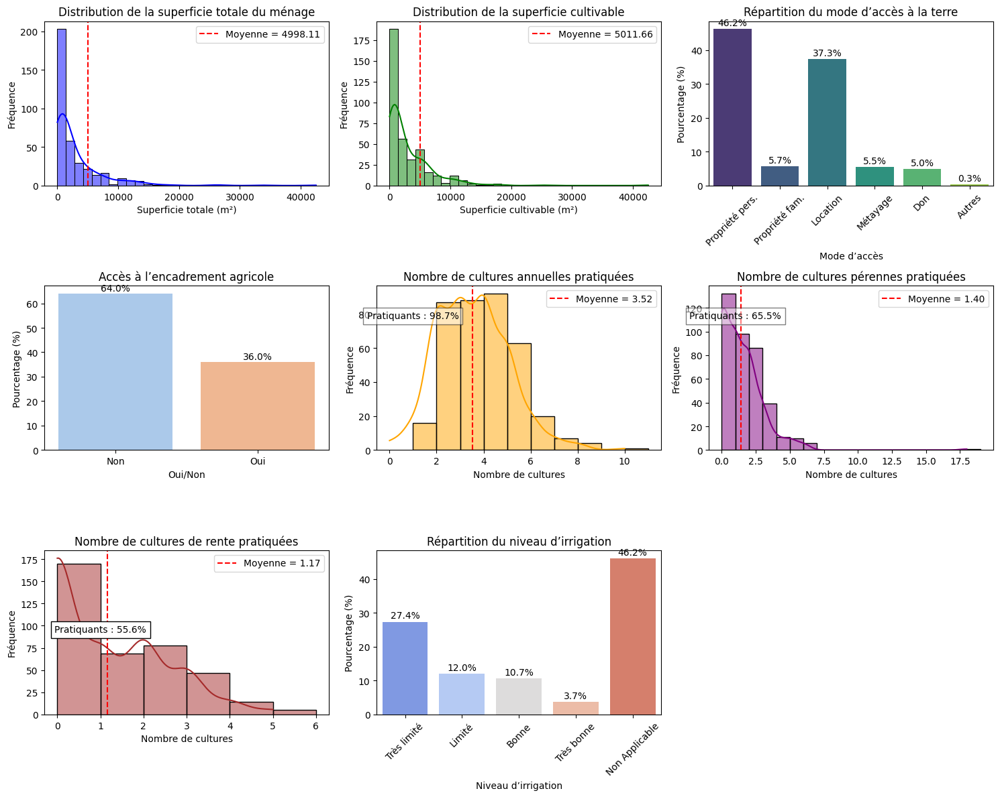

In [230]:
import matplotlib.pyplot as plt
import seaborn as sns
# Supposons que votre DataFrame est déjà chargé et nommé `df`
# Filtrer les données pour exclure les superficies supérieures à 50,000
df_filtered = df[(df['Superf_total_menage'] <= 50000) & (df['Terre_cultivable'] <= 50000)]
# Création d'une grande figure avec plusieurs sous-figures
plt.figure(figsize=(15, 12))  # Augmenter la taille de la figure pour faire de la place pour une nouvelle sous-figure

# Variable quantitative : Superf_total_menage (avec filtre)
plt.subplot(3, 3, 1)
sns.histplot(df_filtered['Superf_total_menage'], kde=True, color='blue', bins=30)
mean_value = df_filtered['Superf_total_menage'].mean() + 2000
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')
plt.title('Distribution de la superficie totale du ménage')
plt.xlabel('Superficie totale (m²)')
plt.ylabel('Fréquence')
plt.legend()

# Variable quantitative : Terre_cultivable (avec filtre)
plt.subplot(3, 3, 2)
sns.histplot(df_filtered['Terre_cultivable'], kde=True, color='green', bins=30)
mean_value = df_filtered['Terre_cultivable'].mean() + 2000
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')
plt.title('Distribution de la superficie cultivable')
plt.xlabel('Superficie cultivable (m²)')
plt.ylabel('Fréquence')
plt.legend()

# Variable catégorielle : Mode_Acces_terre
plt.subplot(3, 3, 3)
mode_acces_counts = df['Mode_Acces_terre'].value_counts(normalize=True).sort_index() * 100  # Pourcentage
sns.barplot(x=mode_acces_counts.index, y=mode_acces_counts.values, palette='viridis')
plt.title('Répartition du mode d’accès à la terre')
plt.xlabel('Mode d’accès')
plt.ylabel('Pourcentage (%)')
plt.xticks(ticks=range(len(mode_acces_counts)), labels=['Propriété pers.', 'Propriété fam.', 'Location', 'Métayage', 'Don', 'Autres'], rotation=45)
for i, v in enumerate(mode_acces_counts.values):
    plt.text(i, v + 1, f'{v:.1f}%', ha='center')

# Variable dicotomique : Encadr_agronomique
plt.subplot(3, 3, 4)
encadr_counts = df['Encadr_agronomique'].value_counts(normalize=True).sort_index() * 100  # Pourcentage
sns.barplot(x=encadr_counts.index, y=encadr_counts.values, palette='pastel')
plt.title('Accès à l’encadrement agricole')
plt.xlabel('Oui/Non')
plt.ylabel('Pourcentage (%)')
plt.xticks(ticks=[0, 1], labels=['Non', 'Oui'])
for i, v in enumerate(encadr_counts.values):
    plt.text(i, v + 1, f'{v:.1f}%', ha='center')

# Variable quantitative : cultures_annuelles_an
plt.subplot(3, 3, 5)
sns.histplot(df['cultures_annuelles_an'], kde=True, color='orange', bins=range(1, df['cultures_annuelles_an'].max() + 2))
mean_value = df['cultures_annuelles_an'].mean()
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')
# Calcul du pourcentage de ménages pratiquant des cultures annuelles
total_menages = len(df)
menages_pratiquants = (df['cultures_annuelles_an'] > 0).sum()
pourcentage_pratiquants = (menages_pratiquants / total_menages) * 100
plt.text(1, max(plt.ylim()) * 0.8, f'Pratiquants : {pourcentage_pratiquants:.1f}%', fontsize=10, ha='center', bbox=dict(facecolor='white', alpha=0.5))
plt.title('Nombre de cultures annuelles pratiquées')
plt.xlabel('Nombre de cultures')
plt.ylabel('Fréquence')
plt.legend()

# Variable quantitative : cultures_perennes_an
plt.subplot(3, 3, 6)
sns.histplot(df['cultures_perennes_an'], kde=True, color='purple', bins=range(df['cultures_perennes_an'].min(), df['cultures_perennes_an'].max() + 2))
mean_value = df['cultures_perennes_an'].mean()
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')
# Calcul du pourcentage de ménages pratiquant des cultures pérennes
menages_pratiquants = (df['cultures_perennes_an'] > 0).sum()
pourcentage_pratiquants = (menages_pratiquants / total_menages) * 100
plt.text(1, max(plt.ylim()) * 0.8, f'Pratiquants : {pourcentage_pratiquants:.1f}%', fontsize=10, ha='center', bbox=dict(facecolor='white', alpha=0.5))
plt.title('Nombre de cultures pérennes pratiquées')
plt.xlabel('Nombre de cultures')
plt.ylabel('Fréquence')
plt.legend()

# Variable quantitative : cultures_rente_an
plt.subplot(3, 3, 7)
sns.histplot(df['cultures_rente_an'], kde=True, color='brown', bins=range(df['cultures_rente_an'].min(), df['cultures_rente_an'].max() + 2))
mean_value = df['cultures_rente_an'].mean()
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')
# Calcul du pourcentage de ménages pratiquant des cultures de rente
menages_pratiquants = (df['cultures_rente_an'] > 0).sum()
pourcentage_pratiquants = (menages_pratiquants / total_menages) * 100
plt.text(1, max(plt.ylim()) * 0.5, f'Pratiquants : {pourcentage_pratiquants:.1f}%', fontsize=10, ha='center', bbox=dict(facecolor='white', alpha=1))
plt.title('Nombre de cultures de rente pratiquées')
plt.xlabel('Nombre de cultures')
plt.ylabel('Fréquence')
plt.legend()

# Variable catégorielle : Niveau_Irrigation
plt.subplot(3, 3, 8)
niveau_irrigation_counts = df['Niveau_Irrigation'].value_counts(normalize=True).sort_index() * 100  # Pourcentage
sns.barplot(x=niveau_irrigation_counts.index, y=niveau_irrigation_counts.values, palette='coolwarm')
plt.title('Répartition du niveau d’irrigation')
plt.xlabel('Niveau d’irrigation')
plt.ylabel('Pourcentage (%)')
plt.xticks(ticks=range(5), labels=['Très limité', 'Limité', 'Bonne', 'Très bonne', 'Non Applicable'], rotation=45)
for i, v in enumerate(niveau_irrigation_counts.values):
    plt.text(i, v + 1, f'{v:.1f}%', ha='center')

# Ajuster les espacements entre les sous-figures
plt.tight_layout()
# Afficher la figure
plt.show()


C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\2086125514.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=experience_counts.index, y=experience_counts.values, palette='viridis')
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\2086125514.py:49: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=saisons_counts.index, y=saisons_counts.values, palette='pastel')


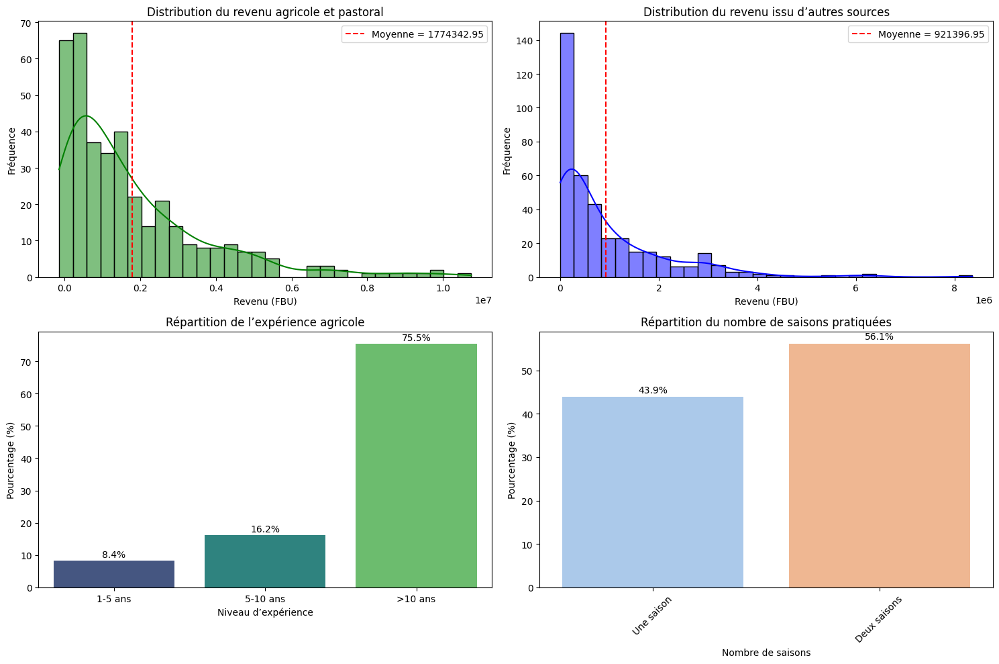

In [231]:
import matplotlib.pyplot as plt
import seaborn as sns

# Supposons que votre DataFrame est déjà chargé et nommé `df`

# Création d'une grande figure avec plusieurs sous-figures
plt.figure(figsize=(15, 10))

# Analyse de la distribution pour Revenu_Agro_Pastoral
plt.subplot(2, 2, 1)
sns.histplot(df['Revenu_Agro_Pastoral'], kde=True, color='green', bins=30)
mean_value = df['Revenu_Agro_Pastoral'].mean()
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')
plt.title('Distribution du revenu agricole et pastoral')
plt.xlabel('Revenu (FBU)')
plt.ylabel('Fréquence')
plt.legend()

# Analyse de la distribution pour Revenu_Autres_Sources
plt.subplot(2, 2, 2)
sns.histplot(df['Revenu_Autres_Sources'], kde=True, color='blue', bins=30)
mean_value = df['Revenu_Autres_Sources'].mean()
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')
plt.title('Distribution du revenu issu d’autres sources')
plt.xlabel('Revenu (FBU)')
plt.ylabel('Fréquence')
plt.legend()

# Analyse en barplot pour Experience_Agricole
plt.subplot(2, 2, 3)
# Utiliser uniquement les modalités présentes dans les données
experience_counts = df['Experience_Agricole'].value_counts(normalize=True).sort_index() * 100
labels_experience = ['1-5 ans', '5-10 ans', '>10 ans']
modalites_presentes_experience = [labels_experience[i - 1] for i in experience_counts.index]
sns.barplot(x=experience_counts.index, y=experience_counts.values, palette='viridis')
plt.title('Répartition de l’expérience agricole')
plt.xlabel('Niveau d’expérience')
plt.ylabel('Pourcentage (%)')
plt.xticks(ticks=range(len(experience_counts)), labels=modalites_presentes_experience)
for i, v in enumerate(experience_counts.values):
    plt.text(i, v + 1, f'{v:.1f}%', ha='center')

# Analyse en barplot pour Nombre_Saisons
plt.subplot(2, 2, 4)
# Utiliser uniquement les modalités présentes dans les données
saisons_counts = df['Nombre_Saisons'].value_counts(normalize=True).sort_index() * 100
labels_saisons = ['Une saison', 'Deux saisons', 'Trois saisons']
modalites_presentes_saisons = [labels_saisons[i - 1] for i in saisons_counts.index]
sns.barplot(x=saisons_counts.index, y=saisons_counts.values, palette='pastel')
plt.title('Répartition du nombre de saisons pratiquées')
plt.xlabel('Nombre de saisons')
plt.ylabel('Pourcentage (%)')
plt.xticks(ticks=range(len(saisons_counts)), labels=modalites_presentes_saisons, rotation=45)
for i, v in enumerate(saisons_counts.values):
    plt.text(i, v + 1, f'{v:.1f}%', ha='center')

# Ajuster les espacements entre les sous-figures
plt.tight_layout()

# Afficher la figure
plt.show()

C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\3217185606.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=experience_counts.index, y=experience_counts.values, palette='viridis')
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\3217185606.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=saisons_counts.index, y=saisons_counts.values, palette='pastel')


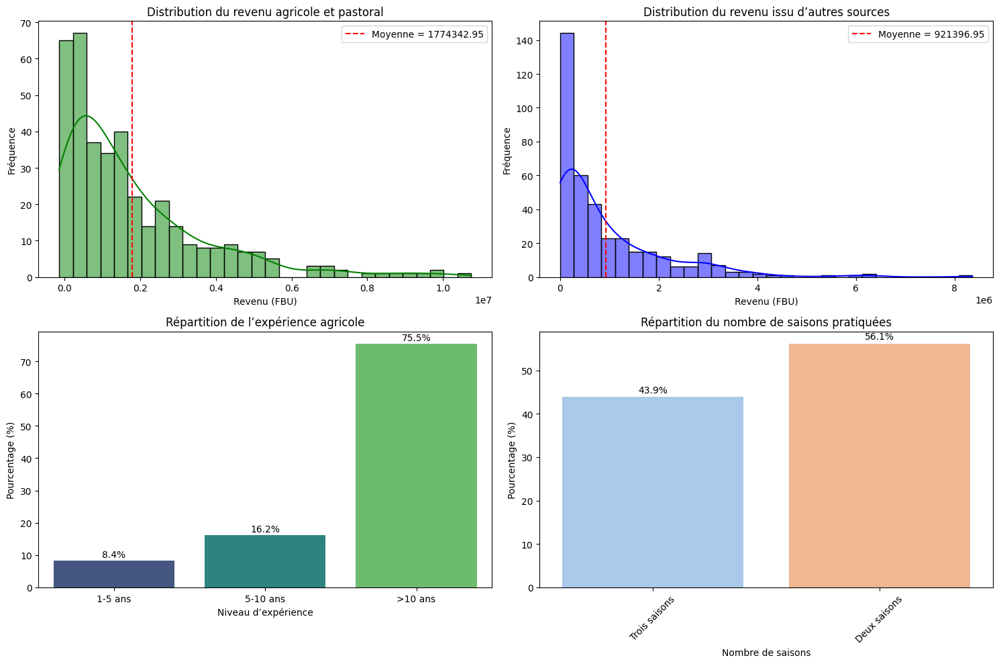

In [232]:
import matplotlib.pyplot as plt
import seaborn as sns

# Supposons que votre DataFrame est déjà chargé et nommé `df`

# Création d'une grande figure avec plusieurs sous-figures
plt.figure(figsize=(15, 10))

# Analyse de la distribution pour Revenu_Agro_Pastoral
plt.subplot(2, 2, 1)
sns.histplot(df['Revenu_Agro_Pastoral'], kde=True, color='green', bins=30)
mean_value = df['Revenu_Agro_Pastoral'].mean()
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')
plt.title('Distribution du revenu agricole et pastoral')
plt.xlabel('Revenu (FBU)')
plt.ylabel('Fréquence')
plt.legend()

# Analyse de la distribution pour Revenu_Autres_Sources
plt.subplot(2, 2, 2)
sns.histplot(df['Revenu_Autres_Sources'], kde=True, color='blue', bins=30)
mean_value = df['Revenu_Autres_Sources'].mean()
plt.axvline(mean_value, color='red', linestyle='--', label=f'Moyenne = {mean_value:.2f}')
plt.title('Distribution du revenu issu d’autres sources')
plt.xlabel('Revenu (FBU)')
plt.ylabel('Fréquence')
plt.legend()

# Analyse en barplot pour Experience_Agricole
plt.subplot(2, 2, 3)
# Utiliser uniquement les modalités présentes dans les données
experience_counts = df['Experience_Agricole'].value_counts(normalize=True).sort_index() * 100
labels_experience = ['1-5 ans', '5-10 ans', '>10 ans']
modalites_presentes_experience = [labels_experience[i - 1] for i in experience_counts.index]
sns.barplot(x=experience_counts.index, y=experience_counts.values, palette='viridis')
plt.title('Répartition de l’expérience agricole')
plt.xlabel('Niveau d’expérience')
plt.ylabel('Pourcentage (%)')
plt.xticks(ticks=range(len(experience_counts)), labels=modalites_presentes_experience)
for i, v in enumerate(experience_counts.values):
    plt.text(i, v + 1, f'{v:.1f}%', ha='center')

# Analyse en barplot pour Nombre_Saisons
plt.subplot(2, 2, 4)
# Utiliser uniquement les modalités présentes dans les données
saisons_counts = df['Nombre_Saisons'].value_counts(normalize=True).sort_index() * 100
# Mise à jour des labels pour correspondre aux nouvelles modalités
labels_saisons = ['Trois saisons', 'Deux saisons']  # Suppression de "Une saison"
modalites_presentes_saisons = [labels_saisons[i - 1] for i in saisons_counts.index if i in [1, 2]]  # Ignorer les indices non valides
sns.barplot(x=saisons_counts.index, y=saisons_counts.values, palette='pastel')
plt.title('Répartition du nombre de saisons pratiquées')
plt.xlabel('Nombre de saisons')
plt.ylabel('Pourcentage (%)')
plt.xticks(ticks=range(len(saisons_counts)), labels=modalites_presentes_saisons, rotation=45)
for i, v in enumerate(saisons_counts.values):
    plt.text(i, v + 1, f'{v:.1f}%', ha='center')

# Ajuster les espacements entre les sous-figures
plt.tight_layout()

# Afficher la figure
plt.show()

Tableau croisé : Moyennes des revenus par niveau d'expérience agricole
  Experience_Agricole  Moyenne_Revenu_Agro_Pastoral  Moyenne_Revenu_Autres_Sources
0             1-5 ans               1,311,143.75000                1,098,750.00000
1            5-10 ans               1,776,659.48387                  902,774.19355
2             >10 ans               1,825,134.47059                  905,754.43599

Tableau croisé : Moyennes des revenus par nombre de saisons pratiquées
  Nombre_Saisons  Moyenne_Revenu_Agro_Pastoral  Moyenne_Revenu_Autres_Sources
0  Trois saisons               2,421,903.63095                1,190,809.71429
1   Deux saisons               1,268,342.04651                  710,879.06977


C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\1718784313.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Experience_Agricole', y='Moyenne_Revenu_Agro_Pastoral', data=table_experience, palette='viridis')
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\1718784313.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Experience_Agricole', y='Moyenne_Revenu_Autres_Sources', data=table_experience, palette='pastel')
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\1718784313.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(

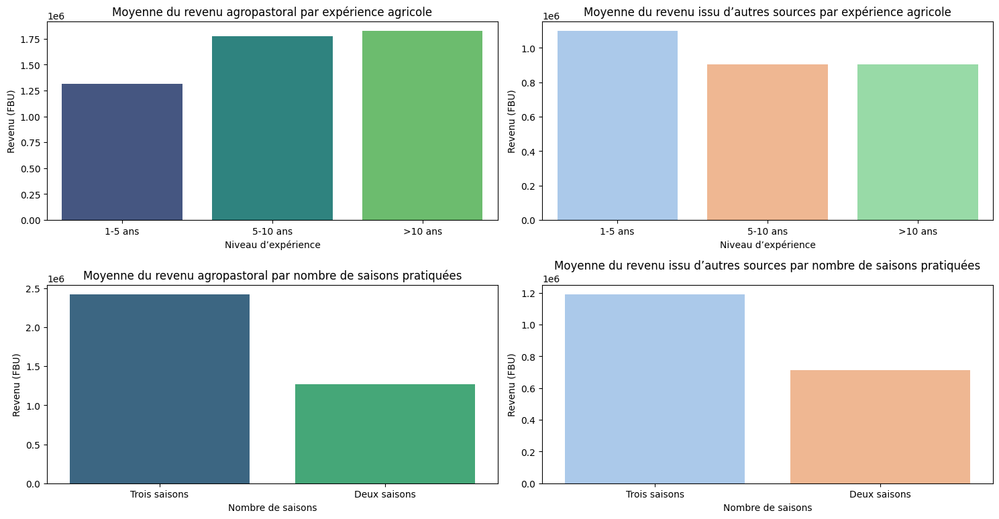

In [233]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Supposons que votre DataFrame est déjà chargé et nommé `df`

# Calcul des moyennes pour le croisement entre Revenu_Agro_Pastoral et Experience_Agricole
mean_agro_by_experience = df.groupby('Experience_Agricole')['Revenu_Agro_Pastoral'].mean()
mean_autres_by_experience = df.groupby('Experience_Agricole')['Revenu_Autres_Sources'].mean()

# Création d'un DataFrame pour le tableau croisé avec Experience_Agricole
table_experience = pd.DataFrame({
    'Moyenne_Revenu_Agro_Pastoral': mean_agro_by_experience,
    'Moyenne_Revenu_Autres_Sources': mean_autres_by_experience
}).reset_index()

# Ajout des labels pour Experience_Agricole
labels_experience = ['1-5 ans', '5-10 ans', '>10 ans']
table_experience['Experience_Agricole'] = table_experience['Experience_Agricole'].map({1: '1-5 ans', 2: '5-10 ans', 3: '>10 ans'})

# Affichage du tableau croisé pour Experience_Agricole
print("Tableau croisé : Moyennes des revenus par niveau d'expérience agricole")
print(table_experience)

# Calcul des moyennes pour le croisement entre Revenu_Agro_Pastoral et Nombre_Saisons
mean_agro_by_saisons = df.groupby('Nombre_Saisons')['Revenu_Agro_Pastoral'].mean()
mean_autres_by_saisons = df.groupby('Nombre_Saisons')['Revenu_Autres_Sources'].mean()

# Création d'un DataFrame pour le tableau croisé avec Nombre_Saisons
table_saisons = pd.DataFrame({
    'Moyenne_Revenu_Agro_Pastoral': mean_agro_by_saisons,
    'Moyenne_Revenu_Autres_Sources': mean_autres_by_saisons
}).reset_index()

# Ajout des labels pour Nombre_Saisons
labels_saisons = ['Trois saisons', 'Deux saisons']
table_saisons['Nombre_Saisons'] = table_saisons['Nombre_Saisons'].map({1: 'Trois saisons', 2: 'Deux saisons'})

# Affichage du tableau croisé pour Nombre_Saisons
print("\nTableau croisé : Moyennes des revenus par nombre de saisons pratiquées")
print(table_saisons)

# Visualisation des résultats dans des graphiques

# Figure principale
plt.figure(figsize=(15, 8))

# Croisement Revenu_Agro_Pastoral vs Experience_Agricole
plt.subplot(2, 2, 1)
sns.barplot(x='Experience_Agricole', y='Moyenne_Revenu_Agro_Pastoral', data=table_experience, palette='viridis')
plt.title('Moyenne du revenu agropastoral par expérience agricole')
plt.ylabel('Revenu (FBU)')
plt.xlabel('Niveau d’expérience')

# Croisement Revenu_Autres_Sources vs Experience_Agricole
plt.subplot(2, 2, 2)
sns.barplot(x='Experience_Agricole', y='Moyenne_Revenu_Autres_Sources', data=table_experience, palette='pastel')
plt.title('Moyenne du revenu issu d’autres sources par expérience agricole')
plt.ylabel('Revenu (FBU)')
plt.xlabel('Niveau d’expérience')

# Croisement Revenu_Agro_Pastoral vs Nombre_Saisons
plt.subplot(2, 2, 3)
sns.barplot(x='Nombre_Saisons', y='Moyenne_Revenu_Agro_Pastoral', data=table_saisons, palette='viridis')
plt.title('Moyenne du revenu agropastoral par nombre de saisons pratiquées')
plt.ylabel('Revenu (FBU)')
plt.xlabel('Nombre de saisons')

# Croisement Revenu_Autres_Sources vs Nombre_Saisons
plt.subplot(2, 2, 4)
sns.barplot(x='Nombre_Saisons', y='Moyenne_Revenu_Autres_Sources', data=table_saisons, palette='pastel')
plt.title('Moyenne du revenu issu d’autres sources par nombre de saisons pratiquées')
plt.ylabel('Revenu (FBU)')
plt.xlabel('Nombre de saisons')

# Ajuster les espacements entre les sous-figures
plt.tight_layout()

# Afficher la figure
plt.show()

Tableau croisé : Moyennes des revenus par niveau d'expérience agricole
  Experience_Agricole  Moyenne_Revenu_Agro_Pastoral  Moyenne_Revenu_Autres_Sources  Pourcentage_Agro  Pourcentage_Autres  P_value_Agro  P_value_Autres
0             1-5 ans               1,311,143.75000                1,098,750.00000          26.68757            37.79308       0.36636         0.67453
1            5-10 ans               1,776,659.48387                  902,774.19355          36.16287            31.05221       0.36636         0.67453
2             >10 ans               1,825,134.47059                  905,754.43599          37.14955            31.15472       0.36636         0.67453

Tableau croisé : Moyennes des revenus par nombre de saisons pratiquées
  Nombre_Saisons  Moyenne_Revenu_Agro_Pastoral  Moyenne_Revenu_Autres_Sources  Pourcentage_Agro  Pourcentage_Autres  P_value_Agro  P_value_Autres
0  Trois saisons               2,421,903.63095                1,190,809.71429          65.62988            

C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\3523098724.py:87: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Experience_Agricole', y='Moyenne_Revenu_Agro_Pastoral', data=table_experience, palette='viridis')
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\3523098724.py:94: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Experience_Agricole', y='Moyenne_Revenu_Autres_Sources', data=table_experience, palette='pastel')
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\3523098724.py:101: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot

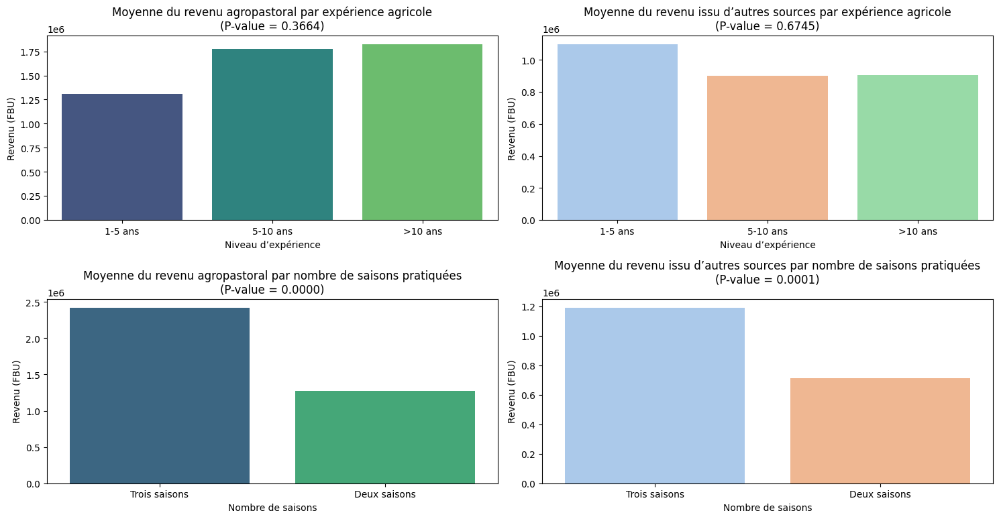

In [234]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, f_oneway  # Pour calculer la p-value

# Supposons que votre DataFrame est déjà chargé et nommé `df`

# Calcul des moyennes pour le croisement entre Revenu_Agro_Pastoral et Experience_Agricole
mean_agro_by_experience = df.groupby('Experience_Agricole')['Revenu_Agro_Pastoral'].mean()
mean_autres_by_experience = df.groupby('Experience_Agricole')['Revenu_Autres_Sources'].mean()

# Création d'un DataFrame pour le tableau croisé avec Experience_Agricole
table_experience = pd.DataFrame({
    'Moyenne_Revenu_Agro_Pastoral': mean_agro_by_experience,
    'Moyenne_Revenu_Autres_Sources': mean_autres_by_experience
}).reset_index()

# Ajout des labels pour Experience_Agricole
labels_experience = ['1-5 ans', '5-10 ans', '>10 ans']
table_experience['Experience_Agricole'] = table_experience['Experience_Agricole'].map({1: '1-5 ans', 2: '5-10 ans', 3: '>10 ans'})

# Calcul du pourcentage pour chaque revenu par expérience agricole
total_agro_exp = table_experience['Moyenne_Revenu_Agro_Pastoral'].sum()
total_autres_exp = table_experience['Moyenne_Revenu_Autres_Sources'].sum()
table_experience['Pourcentage_Agro'] = (table_experience['Moyenne_Revenu_Agro_Pastoral'] / total_agro_exp) * 100
table_experience['Pourcentage_Autres'] = (table_experience['Moyenne_Revenu_Autres_Sources'] / total_autres_exp) * 100

# Calcul de la p-value pour Revenu_Agro_Pastoral vs Experience_Agricole
groups_agro_exp = [df[df['Experience_Agricole'] == i]['Revenu_Agro_Pastoral'] for i in [1, 2, 3]]
f_stat_agro_exp, p_value_agro_exp = f_oneway(*groups_agro_exp)

# Calcul de la p-value pour Revenu_Autres_Sources vs Experience_Agricole
groups_autres_exp = [df[df['Experience_Agricole'] == i]['Revenu_Autres_Sources'] for i in [1, 2, 3]]
f_stat_autres_exp, p_value_autres_exp = f_oneway(*groups_autres_exp)

# Ajout des p-values au tableau
table_experience['P_value_Agro'] = p_value_agro_exp
table_experience['P_value_Autres'] = p_value_autres_exp

# Affichage du tableau croisé pour Experience_Agricole
print("Tableau croisé : Moyennes des revenus par niveau d'expérience agricole")
print(table_experience)


# Calcul des moyennes pour le croisement entre Revenu_Agro_Pastoral et Nombre_Saisons
mean_agro_by_saisons = df.groupby('Nombre_Saisons')['Revenu_Agro_Pastoral'].mean()
mean_autres_by_saisons = df.groupby('Nombre_Saisons')['Revenu_Autres_Sources'].mean()

# Création d'un DataFrame pour le tableau croisé avec Nombre_Saisons
table_saisons = pd.DataFrame({
    'Moyenne_Revenu_Agro_Pastoral': mean_agro_by_saisons,
    'Moyenne_Revenu_Autres_Sources': mean_autres_by_saisons
}).reset_index()

# Ajout des labels pour Nombre_Saisons
labels_saisons = ['Trois saisons', 'Deux saisons']
table_saisons['Nombre_Saisons'] = table_saisons['Nombre_Saisons'].map({1: 'Trois saisons', 2: 'Deux saisons'})

# Calcul du pourcentage pour chaque revenu par nombre de saisons
total_agro_saisons = table_saisons['Moyenne_Revenu_Agro_Pastoral'].sum()
total_autres_saisons = table_saisons['Moyenne_Revenu_Autres_Sources'].sum()
table_saisons['Pourcentage_Agro'] = (table_saisons['Moyenne_Revenu_Agro_Pastoral'] / total_agro_saisons) * 100
table_saisons['Pourcentage_Autres'] = (table_saisons['Moyenne_Revenu_Autres_Sources'] / total_autres_saisons) * 100

# Calcul de la p-value pour Revenu_Agro_Pastoral vs Nombre_Saisons
groups_agro_saisons = [df[df['Nombre_Saisons'] == i]['Revenu_Agro_Pastoral'] for i in [1, 2]]
f_stat_agro_saisons, p_value_agro_saisons = f_oneway(*groups_agro_saisons)

# Calcul de la p-value pour Revenu_Autres_Sources vs Nombre_Saisons
groups_autres_saisons = [df[df['Nombre_Saisons'] == i]['Revenu_Autres_Sources'] for i in [1, 2]]
f_stat_autres_saisons, p_value_autres_saisons = f_oneway(*groups_autres_saisons)

# Ajout des p-values au tableau
table_saisons['P_value_Agro'] = p_value_agro_saisons
table_saisons['P_value_Autres'] = p_value_autres_saisons

# Affichage du tableau croisé pour Nombre_Saisons
print("\nTableau croisé : Moyennes des revenus par nombre de saisons pratiquées")
print(table_saisons)


# Visualisation des résultats dans des graphiques
plt.figure(figsize=(15, 8))

# Croisement Revenu_Agro_Pastoral vs Experience_Agricole
plt.subplot(2, 2, 1)
sns.barplot(x='Experience_Agricole', y='Moyenne_Revenu_Agro_Pastoral', data=table_experience, palette='viridis')
plt.title(f'Moyenne du revenu agropastoral par expérience agricole\n(P-value = {p_value_agro_exp:.4f})')
plt.ylabel('Revenu (FBU)')
plt.xlabel('Niveau d’expérience')

# Croisement Revenu_Autres_Sources vs Experience_Agricole
plt.subplot(2, 2, 2)
sns.barplot(x='Experience_Agricole', y='Moyenne_Revenu_Autres_Sources', data=table_experience, palette='pastel')
plt.title(f'Moyenne du revenu issu d’autres sources par expérience agricole\n(P-value = {p_value_autres_exp:.4f})')
plt.ylabel('Revenu (FBU)')
plt.xlabel('Niveau d’expérience')

# Croisement Revenu_Agro_Pastoral vs Nombre_Saisons
plt.subplot(2, 2, 3)
sns.barplot(x='Nombre_Saisons', y='Moyenne_Revenu_Agro_Pastoral', data=table_saisons, palette='viridis')
plt.title(f'Moyenne du revenu agropastoral par nombre de saisons pratiquées\n(P-value = {p_value_agro_saisons:.4f})')
plt.ylabel('Revenu (FBU)')
plt.xlabel('Nombre de saisons')

# Croisement Revenu_Autres_Sources vs Nombre_Saisons
plt.subplot(2, 2, 4)
sns.barplot(x='Nombre_Saisons', y='Moyenne_Revenu_Autres_Sources', data=table_saisons, palette='pastel')
plt.title(f'Moyenne du revenu issu d’autres sources par nombre de saisons pratiquées\n(P-value = {p_value_autres_saisons:.4f})')
plt.ylabel('Revenu (FBU)')
plt.xlabel('Nombre de saisons')

# Ajuster les espacements entre les sous-figures
plt.tight_layout()

# Afficher la figure
plt.show()

Tableau croisé : Moyennes des revenus par niveau d'expérience agricole
  Experience_Agricole  Moyenne_Revenu_Agro_Pastoral  Moyenne_Revenu_Autres_Sources  Pourcentage_Agro  Pourcentage_Autres
0             1-5 ans               1,311,143.75000                1,098,750.00000          26.68757            37.79308
1            5-10 ans               1,776,659.48387                  902,774.19355          36.16287            31.05221
2             >10 ans               1,825,134.47059                  905,754.43599          37.14955            31.15472

Tableau croisé : Moyennes des revenus par nombre de saisons pratiquées
  Nombre_Saisons  Moyenne_Revenu_Agro_Pastoral  Moyenne_Revenu_Autres_Sources  Pourcentage_Agro  Pourcentage_Autres
0  Trois saisons               2,421,903.63095                1,190,809.71429          65.62988            62.61854
1   Deux saisons               1,268,342.04651                  710,879.06977          34.37012            37.38146


C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\109262258.py:88: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax1 = sns.barplot(x='Experience_Agricole', y='Moyenne_Revenu_Agro_Pastoral', data=table_experience, palette='viridis')
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\109262258.py:96: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax2 = sns.barplot(x='Experience_Agricole', y='Moyenne_Revenu_Autres_Sources', data=table_experience, palette='pastel')
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\109262258.py:104: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax

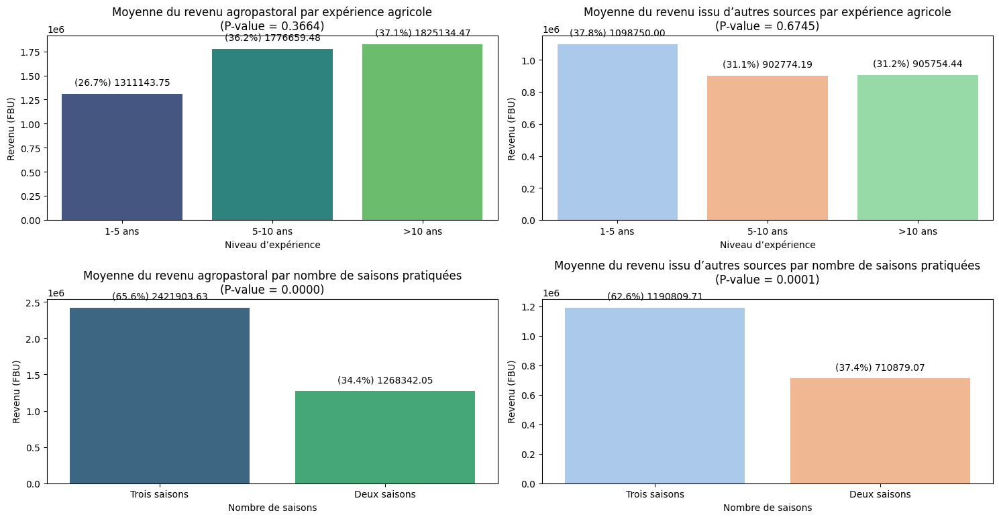

In [235]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, f_oneway  # Pour calculer la p-value

# Supposons que votre DataFrame est déjà chargé et nommé `df`

# Calcul des moyennes pour le croisement entre Revenu_Agro_Pastoral et Experience_Agricole
mean_agro_by_experience = df.groupby('Experience_Agricole')['Revenu_Agro_Pastoral'].mean()
mean_autres_by_experience = df.groupby('Experience_Agricole')['Revenu_Autres_Sources'].mean()

# Création d'un DataFrame pour le tableau croisé avec Experience_Agricole
table_experience = pd.DataFrame({
    'Moyenne_Revenu_Agro_Pastoral': mean_agro_by_experience,
    'Moyenne_Revenu_Autres_Sources': mean_autres_by_experience
}).reset_index()

# Ajout des labels pour Experience_Agricole
labels_experience = ['1-5 ans', '5-10 ans', '>10 ans']
table_experience['Experience_Agricole'] = table_experience['Experience_Agricole'].map({1: '1-5 ans', 2: '5-10 ans', 3: '>10 ans'})

# Calcul du pourcentage pour chaque revenu par expérience agricole
total_agro_exp = table_experience['Moyenne_Revenu_Agro_Pastoral'].sum()
total_autres_exp = table_experience['Moyenne_Revenu_Autres_Sources'].sum()
table_experience['Pourcentage_Agro'] = (table_experience['Moyenne_Revenu_Agro_Pastoral'] / total_agro_exp) * 100
table_experience['Pourcentage_Autres'] = (table_experience['Moyenne_Revenu_Autres_Sources'] / total_autres_exp) * 100

# Calcul de la p-value pour Revenu_Agro_Pastoral vs Experience_Agricole
groups_agro_exp = [df[df['Experience_Agricole'] == i]['Revenu_Agro_Pastoral'] for i in [1, 2, 3]]
f_stat_agro_exp, p_value_agro_exp = f_oneway(*groups_agro_exp)

# Calcul de la p-value pour Revenu_Autres_Sources vs Experience_Agricole
groups_autres_exp = [df[df['Experience_Agricole'] == i]['Revenu_Autres_Sources'] for i in [1, 2, 3]]
f_stat_autres_exp, p_value_autres_exp = f_oneway(*groups_autres_exp)

# Affichage du tableau croisé pour Experience_Agricole
print("Tableau croisé : Moyennes des revenus par niveau d'expérience agricole")
print(table_experience)

# Calcul des moyennes pour le croisement entre Revenu_Agro_Pastoral et Nombre_Saisons
mean_agro_by_saisons = df.groupby('Nombre_Saisons')['Revenu_Agro_Pastoral'].mean()
mean_autres_by_saisons = df.groupby('Nombre_Saisons')['Revenu_Autres_Sources'].mean()

# Création d'un DataFrame pour le tableau croisé avec Nombre_Saisons
table_saisons = pd.DataFrame({
    'Moyenne_Revenu_Agro_Pastoral': mean_agro_by_saisons,
    'Moyenne_Revenu_Autres_Sources': mean_autres_by_saisons
}).reset_index()

# Ajout des labels pour Nombre_Saisons
labels_saisons = ['Trois saisons', 'Deux saisons']
table_saisons['Nombre_Saisons'] = table_saisons['Nombre_Saisons'].map({1: 'Trois saisons', 2: 'Deux saisons'})

# Calcul du pourcentage pour chaque revenu par nombre de saisons
total_agro_saisons = table_saisons['Moyenne_Revenu_Agro_Pastoral'].sum()
total_autres_saisons = table_saisons['Moyenne_Revenu_Autres_Sources'].sum()
table_saisons['Pourcentage_Agro'] = (table_saisons['Moyenne_Revenu_Agro_Pastoral'] / total_agro_saisons) * 100
table_saisons['Pourcentage_Autres'] = (table_saisons['Moyenne_Revenu_Autres_Sources'] / total_autres_saisons) * 100

# Calcul de la p-value pour Revenu_Agro_Pastoral vs Nombre_Saisons
groups_agro_saisons = [df[df['Nombre_Saisons'] == i]['Revenu_Agro_Pastoral'] for i in [1, 2]]
f_stat_agro_saisons, p_value_agro_saisons = f_oneway(*groups_agro_saisons)

# Calcul de la p-value pour Revenu_Autres_Sources vs Nombre_Saisons
groups_autres_saisons = [df[df['Nombre_Saisons'] == i]['Revenu_Autres_Sources'] for i in [1, 2]]
f_stat_autres_saisons, p_value_autres_saisons = f_oneway(*groups_autres_saisons)

# Affichage du tableau croisé pour Nombre_Saisons
print("\nTableau croisé : Moyennes des revenus par nombre de saisons pratiquées")
print(table_saisons)

# Visualisation des résultats dans des graphiques
plt.figure(figsize=(15, 8))

# Fonction pour ajouter les annotations sur les barres
def add_annotations(ax, data, column_mean, column_percentage):
    for i, p in enumerate(ax.patches):
        height = p.get_height()
        ax.text(
            p.get_x() + p.get_width() / 2.,  # Position x
            height + max(data[column_mean]) * 0.05,  # Position y
            f"({data[column_percentage].iloc[i]:.1f}%) {data[column_mean].iloc[i]:.2f}",  # Texte
            ha="center", fontsize=10
        )

# Croisement Revenu_Agro_Pastoral vs Experience_Agricole
plt.subplot(2, 2, 1)
ax1 = sns.barplot(x='Experience_Agricole', y='Moyenne_Revenu_Agro_Pastoral', data=table_experience, palette='viridis')
add_annotations(ax1, table_experience, 'Moyenne_Revenu_Agro_Pastoral', 'Pourcentage_Agro')
plt.title(f'Moyenne du revenu agropastoral par expérience agricole\n(P-value = {p_value_agro_exp:.4f})')
plt.ylabel('Revenu (FBU)')
plt.xlabel('Niveau d’expérience')

# Croisement Revenu_Autres_Sources vs Experience_Agricole
plt.subplot(2, 2, 2)
ax2 = sns.barplot(x='Experience_Agricole', y='Moyenne_Revenu_Autres_Sources', data=table_experience, palette='pastel')
add_annotations(ax2, table_experience, 'Moyenne_Revenu_Autres_Sources', 'Pourcentage_Autres')
plt.title(f'Moyenne du revenu issu d’autres sources par expérience agricole\n(P-value = {p_value_autres_exp:.4f})')
plt.ylabel('Revenu (FBU)')
plt.xlabel('Niveau d’expérience')

# Croisement Revenu_Agro_Pastoral vs Nombre_Saisons
plt.subplot(2, 2, 3)
ax3 = sns.barplot(x='Nombre_Saisons', y='Moyenne_Revenu_Agro_Pastoral', data=table_saisons, palette='viridis')
add_annotations(ax3, table_saisons, 'Moyenne_Revenu_Agro_Pastoral', 'Pourcentage_Agro')
plt.title(f'Moyenne du revenu agropastoral par nombre de saisons pratiquées\n(P-value = {p_value_agro_saisons:.4f})')
plt.ylabel('Revenu (FBU)')
plt.xlabel('Nombre de saisons')

# Croisement Revenu_Autres_Sources vs Nombre_Saisons
plt.subplot(2, 2, 4)
ax4 = sns.barplot(x='Nombre_Saisons', y='Moyenne_Revenu_Autres_Sources', data=table_saisons, palette='pastel')
add_annotations(ax4, table_saisons, 'Moyenne_Revenu_Autres_Sources', 'Pourcentage_Autres')
plt.title(f'Moyenne du revenu issu d’autres sources par nombre de saisons pratiquées\n(P-value = {p_value_autres_saisons:.4f})')
plt.ylabel('Revenu (FBU)')
plt.xlabel('Nombre de saisons')

# Ajuster les espacements entre les sous-figures
plt.tight_layout()

# Afficher la figure
plt.show()

Tableau croisé : Moyennes des revenus par niveau d'expérience agricole
  Experience_Agricole  Moyenne_Revenu_Agro_Pastoral  Moyenne_Revenu_Autres_Sources  Pourcentage_Agro  Pourcentage_Autres
0             1-5 ans               1,311,143.75000                1,098,750.00000          26.68757            37.79308
1            5-10 ans               1,776,659.48387                  902,774.19355          36.16287            31.05221
2             >10 ans               1,825,134.47059                  905,754.43599          37.14955            31.15472

Tableau croisé : Moyennes des revenus par nombre de saisons pratiquées
  Nombre_Saisons  Moyenne_Revenu_Agro_Pastoral  Moyenne_Revenu_Autres_Sources  Pourcentage_Agro  Pourcentage_Autres
0  Trois saisons               2,421,903.63095                1,190,809.71429          65.62988            62.61854
1   Deux saisons               1,268,342.04651                  710,879.06977          34.37012            37.38146


C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\4013283965.py:88: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax1 = sns.barplot(x='Experience_Agricole', y='Moyenne_Revenu_Agro_Pastoral', data=table_experience, palette='viridis')
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\4013283965.py:98: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax2 = sns.barplot(x='Experience_Agricole', y='Moyenne_Revenu_Autres_Sources', data=table_experience, palette='pastel')
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\4013283965.py:108: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

 

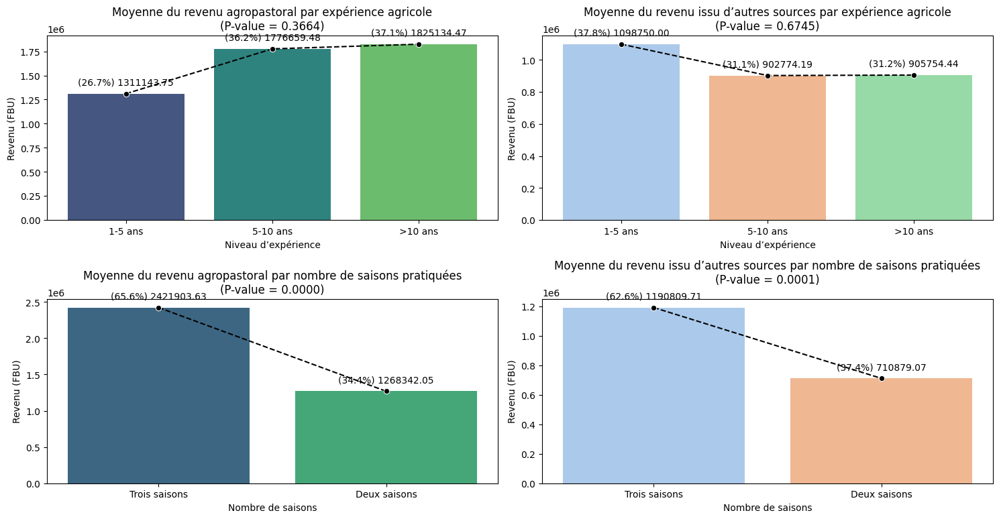

In [236]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, f_oneway  # Pour calculer la p-value

# Supposons que votre DataFrame est déjà chargé et nommé `df`

# Calcul des moyennes pour le croisement entre Revenu_Agro_Pastoral et Experience_Agricole
mean_agro_by_experience = df.groupby('Experience_Agricole')['Revenu_Agro_Pastoral'].mean()
mean_autres_by_experience = df.groupby('Experience_Agricole')['Revenu_Autres_Sources'].mean()

# Création d'un DataFrame pour le tableau croisé avec Experience_Agricole
table_experience = pd.DataFrame({
    'Moyenne_Revenu_Agro_Pastoral': mean_agro_by_experience,
    'Moyenne_Revenu_Autres_Sources': mean_autres_by_experience
}).reset_index()

# Ajout des labels pour Experience_Agricole
labels_experience = ['1-5 ans', '5-10 ans', '>10 ans']
table_experience['Experience_Agricole'] = table_experience['Experience_Agricole'].map({1: '1-5 ans', 2: '5-10 ans', 3: '>10 ans'})

# Calcul du pourcentage pour chaque revenu par expérience agricole
total_agro_exp = table_experience['Moyenne_Revenu_Agro_Pastoral'].sum()
total_autres_exp = table_experience['Moyenne_Revenu_Autres_Sources'].sum()
table_experience['Pourcentage_Agro'] = (table_experience['Moyenne_Revenu_Agro_Pastoral'] / total_agro_exp) * 100
table_experience['Pourcentage_Autres'] = (table_experience['Moyenne_Revenu_Autres_Sources'] / total_autres_exp) * 100

# Calcul de la p-value pour Revenu_Agro_Pastoral vs Experience_Agricole
groups_agro_exp = [df[df['Experience_Agricole'] == i]['Revenu_Agro_Pastoral'] for i in [1, 2, 3]]
f_stat_agro_exp, p_value_agro_exp = f_oneway(*groups_agro_exp)

# Calcul de la p-value pour Revenu_Autres_Sources vs Experience_Agricole
groups_autres_exp = [df[df['Experience_Agricole'] == i]['Revenu_Autres_Sources'] for i in [1, 2, 3]]
f_stat_autres_exp, p_value_autres_exp = f_oneway(*groups_autres_exp)

# Affichage du tableau croisé pour Experience_Agricole
print("Tableau croisé : Moyennes des revenus par niveau d'expérience agricole")
print(table_experience)

# Calcul des moyennes pour le croisement entre Revenu_Agro_Pastoral et Nombre_Saisons
mean_agro_by_saisons = df.groupby('Nombre_Saisons')['Revenu_Agro_Pastoral'].mean()
mean_autres_by_saisons = df.groupby('Nombre_Saisons')['Revenu_Autres_Sources'].mean()

# Création d'un DataFrame pour le tableau croisé avec Nombre_Saisons
table_saisons = pd.DataFrame({
    'Moyenne_Revenu_Agro_Pastoral': mean_agro_by_saisons,
    'Moyenne_Revenu_Autres_Sources': mean_autres_by_saisons
}).reset_index()

# Ajout des labels pour Nombre_Saisons
labels_saisons = ['Trois saisons', 'Deux saisons']
table_saisons['Nombre_Saisons'] = table_saisons['Nombre_Saisons'].map({1: 'Trois saisons', 2: 'Deux saisons'})

# Calcul du pourcentage pour chaque revenu par nombre de saisons
total_agro_saisons = table_saisons['Moyenne_Revenu_Agro_Pastoral'].sum()
total_autres_saisons = table_saisons['Moyenne_Revenu_Autres_Sources'].sum()
table_saisons['Pourcentage_Agro'] = (table_saisons['Moyenne_Revenu_Agro_Pastoral'] / total_agro_saisons) * 100
table_saisons['Pourcentage_Autres'] = (table_saisons['Moyenne_Revenu_Autres_Sources'] / total_autres_saisons) * 100

# Calcul de la p-value pour Revenu_Agro_Pastoral vs Nombre_Saisons
groups_agro_saisons = [df[df['Nombre_Saisons'] == i]['Revenu_Agro_Pastoral'] for i in [1, 2]]
f_stat_agro_saisons, p_value_agro_saisons = f_oneway(*groups_agro_saisons)

# Calcul de la p-value pour Revenu_Autres_Sources vs Nombre_Saisons
groups_autres_saisons = [df[df['Nombre_Saisons'] == i]['Revenu_Autres_Sources'] for i in [1, 2]]
f_stat_autres_saisons, p_value_autres_saisons = f_oneway(*groups_autres_saisons)

# Affichage du tableau croisé pour Nombre_Saisons
print("\nTableau croisé : Moyennes des revenus par nombre de saisons pratiquées")
print(table_saisons)

# Visualisation des résultats dans des graphiques
plt.figure(figsize=(15, 8))

# Fonction pour ajouter les annotations sur les barres
def add_annotations(ax, data, column_mean, column_percentage):
    for i, p in enumerate(ax.patches):
        height = p.get_height()
        ax.text(
            p.get_x() + p.get_width() / 2.,  # Position x
            height + max(data[column_mean]) * 0.05,  # Position y
            f"({data[column_percentage].iloc[i]:.1f}%) {data[column_mean].iloc[i]:.2f}",  # Texte
            ha="center", fontsize=10
        )

# Croisement Revenu_Agro_Pastoral vs Experience_Agricole
plt.subplot(2, 2, 1)
ax1 = sns.barplot(x='Experience_Agricole', y='Moyenne_Revenu_Agro_Pastoral', data=table_experience, palette='viridis')
add_annotations(ax1, table_experience, 'Moyenne_Revenu_Agro_Pastoral', 'Pourcentage_Agro')
# Ajout de la ligne de tendance
sns.lineplot(x='Experience_Agricole', y='Moyenne_Revenu_Agro_Pastoral', data=table_experience, marker='o', color='black', linestyle='--')
plt.title(f'Moyenne du revenu agropastoral par expérience agricole\n(P-value = {p_value_agro_exp:.4f})')
plt.ylabel('Revenu (FBU)')
plt.xlabel('Niveau d’expérience')

# Croisement Revenu_Autres_Sources vs Experience_Agricole
plt.subplot(2, 2, 2)
ax2 = sns.barplot(x='Experience_Agricole', y='Moyenne_Revenu_Autres_Sources', data=table_experience, palette='pastel')
add_annotations(ax2, table_experience, 'Moyenne_Revenu_Autres_Sources', 'Pourcentage_Autres')
# Ajout de la ligne de tendance
sns.lineplot(x='Experience_Agricole', y='Moyenne_Revenu_Autres_Sources', data=table_experience, marker='o', color='black', linestyle='--')
plt.title(f'Moyenne du revenu issu d’autres sources par expérience agricole\n(P-value = {p_value_autres_exp:.4f})')
plt.ylabel('Revenu (FBU)')
plt.xlabel('Niveau d’expérience')

# Croisement Revenu_Agro_Pastoral vs Nombre_Saisons
plt.subplot(2, 2, 3)
ax3 = sns.barplot(x='Nombre_Saisons', y='Moyenne_Revenu_Agro_Pastoral', data=table_saisons, palette='viridis')
add_annotations(ax3, table_saisons, 'Moyenne_Revenu_Agro_Pastoral', 'Pourcentage_Agro')
# Ajout de la ligne de tendance
sns.lineplot(x='Nombre_Saisons', y='Moyenne_Revenu_Agro_Pastoral', data=table_saisons, marker='o', color='black', linestyle='--')
plt.title(f'Moyenne du revenu agropastoral par nombre de saisons pratiquées\n(P-value = {p_value_agro_saisons:.4f})')
plt.ylabel('Revenu (FBU)')
plt.xlabel('Nombre de saisons')

# Croisement Revenu_Autres_Sources vs Nombre_Saisons
plt.subplot(2, 2, 4)
ax4 = sns.barplot(x='Nombre_Saisons', y='Moyenne_Revenu_Autres_Sources', data=table_saisons, palette='pastel')
add_annotations(ax4, table_saisons, 'Moyenne_Revenu_Autres_Sources', 'Pourcentage_Autres')
# Ajout de la ligne de tendance
sns.lineplot(x='Nombre_Saisons', y='Moyenne_Revenu_Autres_Sources', data=table_saisons, marker='o', color='black', linestyle='--')
plt.title(f'Moyenne du revenu issu d’autres sources par nombre de saisons pratiquées\n(P-value = {p_value_autres_saisons:.4f})')
plt.ylabel('Revenu (FBU)')
plt.xlabel('Nombre de saisons')

# Ajuster les espacements entre les sous-figures
plt.tight_layout()

# Afficher la figure
plt.show()

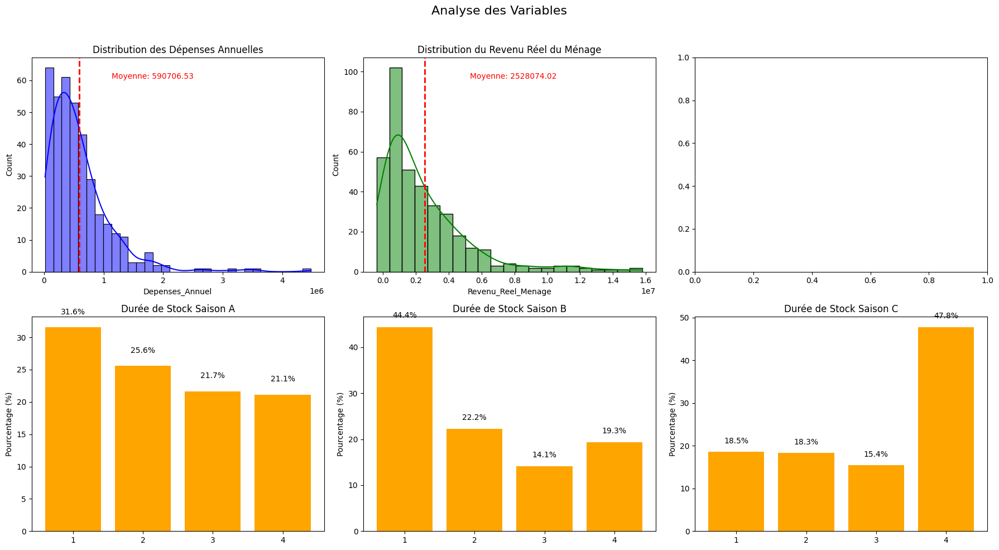

In [237]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Supposons que les données sont dans un DataFrame pandas appelé `df`

# Créer une figure avec 5 sous-graphiques (2 quantitatives + 3 catégorielles)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle("Analyse des Variables", fontsize=16)

# Distribution des variables quantitatives
sns.histplot(df['Depenses_Annuel'], kde=True, ax=axes[0, 0], color='blue')
axes[0, 0].axvline(df['Depenses_Annuel'].mean(), color='red', linestyle='dashed', linewidth=2)
axes[0, 0].set_title('Distribution des Dépenses Annuelles')
axes[0, 0].text(df['Depenses_Annuel'].mean() + df['Depenses_Annuel'].std(), 
                axes[0, 0].get_ylim()[1]*0.9, 
                f"Moyenne: {df['Depenses_Annuel'].mean():.2f}", 
                color='red')

sns.histplot(df['Revenu_Reel_Menage'], kde=True, ax=axes[0, 1], color='green')
axes[0, 1].axvline(df['Revenu_Reel_Menage'].mean(), color='red', linestyle='dashed', linewidth=2)
axes[0, 1].set_title('Distribution du Revenu Réel du Ménage')
axes[0, 1].text(df['Revenu_Reel_Menage'].mean() + df['Revenu_Reel_Menage'].std(), 
                axes[0, 1].get_ylim()[1]*0.9, 
                f"Moyenne: {df['Revenu_Reel_Menage'].mean():.2f}", 
                color='red')

# Diagrammes en bâtonnets pour les variables catégorielles
for i, var in enumerate(['Duree_Stock_SaisonA', 'Duree_Stock_SaisonB', 'Duree_Stock_SaisonC']):
    counts = df[var].value_counts(normalize=True) * 100  # Calcul des pourcentages
    counts.sort_index(inplace=True)  # Trier par index (modalités)
    
    # Créer le diagramme en bâtonnets
    axes[1, i].bar(counts.index.astype(str), counts.values, color='orange')
    axes[1, i].set_title(f'Durée de Stock Saison {var[-1]}')
    axes[1, i].set_ylabel('Pourcentage (%)')
    
    # Ajouter les pourcentages au-dessus des barres
    for j, value in enumerate(counts):
        axes[1, i].text(j, value + 2, f'{value:.1f}%', ha='center', fontsize=10)

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Afficher la figure
plt.show()

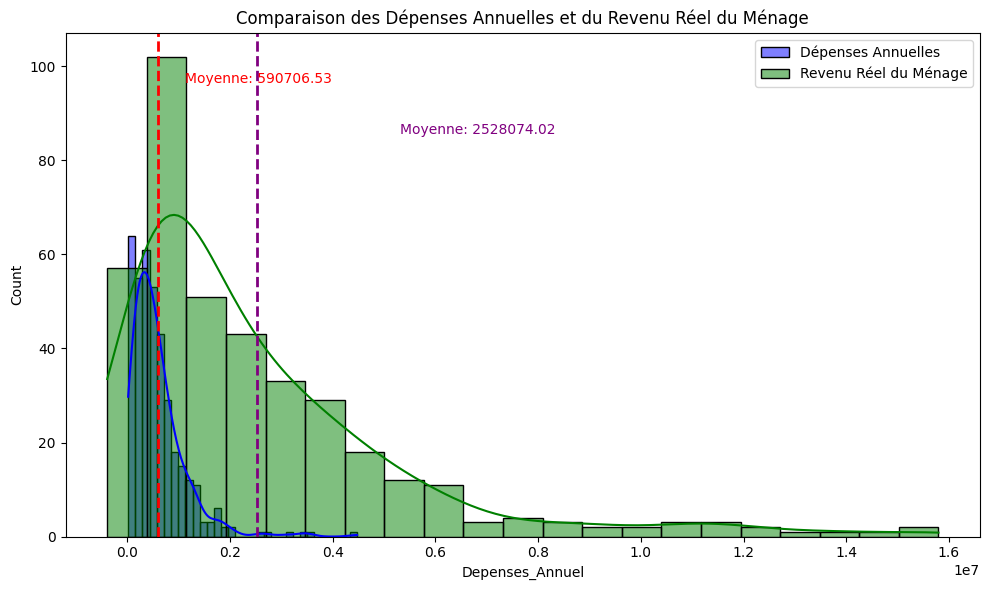

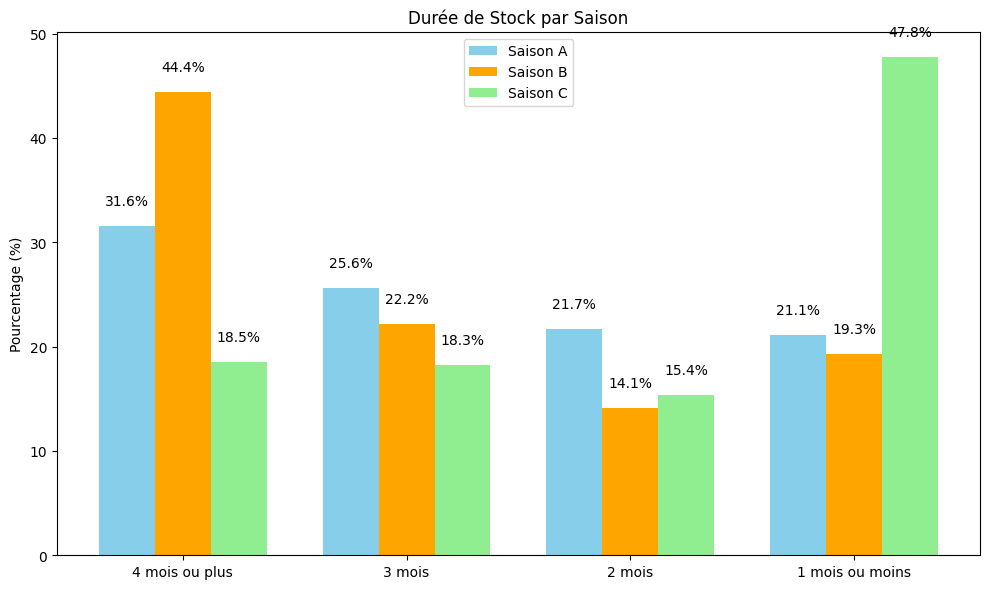

In [238]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Supposons que les données sont dans un DataFrame pandas appelé `df`

# Définir les modalités pour les variables catégoriques
modalites = ["4 mois ou plus", "3 mois", "2 mois", "1 mois ou moins"]

# Combinaison des sous-figures pour Depenses_Annuel et Revenu_Reel_Menage
fig1, ax1 = plt.subplots(figsize=(10, 6))
sns.histplot(df['Depenses_Annuel'], kde=True, ax=ax1, color='blue', label='Dépenses Annuelles')
sns.histplot(df['Revenu_Reel_Menage'], kde=True, ax=ax1, color='green', label='Revenu Réel du Ménage')

# Ajouter la moyenne pour chaque variable
ax1.axvline(df['Depenses_Annuel'].mean(), color='red', linestyle='dashed', linewidth=2)
ax1.text(df['Depenses_Annuel'].mean() + df['Depenses_Annuel'].std(), 
         ax1.get_ylim()[1]*0.9, 
         f"Moyenne: {df['Depenses_Annuel'].mean():.2f}", 
         color='red')

ax1.axvline(df['Revenu_Reel_Menage'].mean(), color='purple', linestyle='dashed', linewidth=2)
ax1.text(df['Revenu_Reel_Menage'].mean() + df['Revenu_Reel_Menage'].std(), 
         ax1.get_ylim()[1]*0.8, 
         f"Moyenne: {df['Revenu_Reel_Menage'].mean():.2f}", 
         color='purple')

ax1.set_title('Comparaison des Dépenses Annuelles et du Revenu Réel du Ménage')
ax1.legend()
plt.tight_layout()

# Afficher la première figure
plt.show()

# Combinaison des sous-figures pour Duree_Stock_SaisonA, B, C
fig2, ax2 = plt.subplots(figsize=(10, 6))

# Créer un DataFrame pour stocker les pourcentages normalisés
data = []
for var in ['Duree_Stock_SaisonA', 'Duree_Stock_SaisonB', 'Duree_Stock_SaisonC']:
    counts = df[var].value_counts(normalize=True) * 100
    counts = counts.reindex([1, 2, 3, 4], fill_value=0)  # Assurer l'ordre des modalités
    data.append(counts)

# Convertir les données en un format utilisable pour le diagramme en barres groupées
data = np.array(data).T  # Transposer pour avoir modalités en lignes et saisons en colonnes

# Créer le diagramme en barres groupées
x = np.arange(len(modalites))  # Positions des groupes
width = 0.25  # Largeur des barres

bars1 = ax2.bar(x - width, data[:, 0], width, label='Saison A', color='skyblue')
bars2 = ax2.bar(x, data[:, 1], width, label='Saison B', color='orange')
bars3 = ax2.bar(x + width, data[:, 2], width, label='Saison C', color='lightgreen')

# Ajouter les pourcentages au-dessus des barres
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width() / 2, height + 2, 
                 f'{height:.1f}%', ha='center', fontsize=10)

add_labels(bars1)
add_labels(bars2)
add_labels(bars3)

# Configurer les axes et les étiquettes
ax2.set_xticks(x)
ax2.set_xticklabels(modalites)
ax2.set_ylabel('Pourcentage (%)')
ax2.set_title('Durée de Stock par Saison')
ax2.legend()

plt.tight_layout()

# Afficher la deuxième figure
plt.show()

       Revenu_speculation  Revenu_Autres_Sources  Revenu_Agro_Pastoral
count           383.00000              383.00000             383.00000
mean        753,731.07050          921,396.95039       1,774,342.95039
std       1,389,639.24359        1,178,732.96660       1,944,279.41805
min      -1,258,000.00000                0.00000        -148,500.00000
25%         130,000.00000          102,000.00000         350,000.00000
50%         300,000.00000          400,000.00000       1,180,000.00000
75%         720,500.00000        1,230,000.00000       2,546,750.00000
max       8,772,000.00000        8,360,000.00000      10,749,000.00000


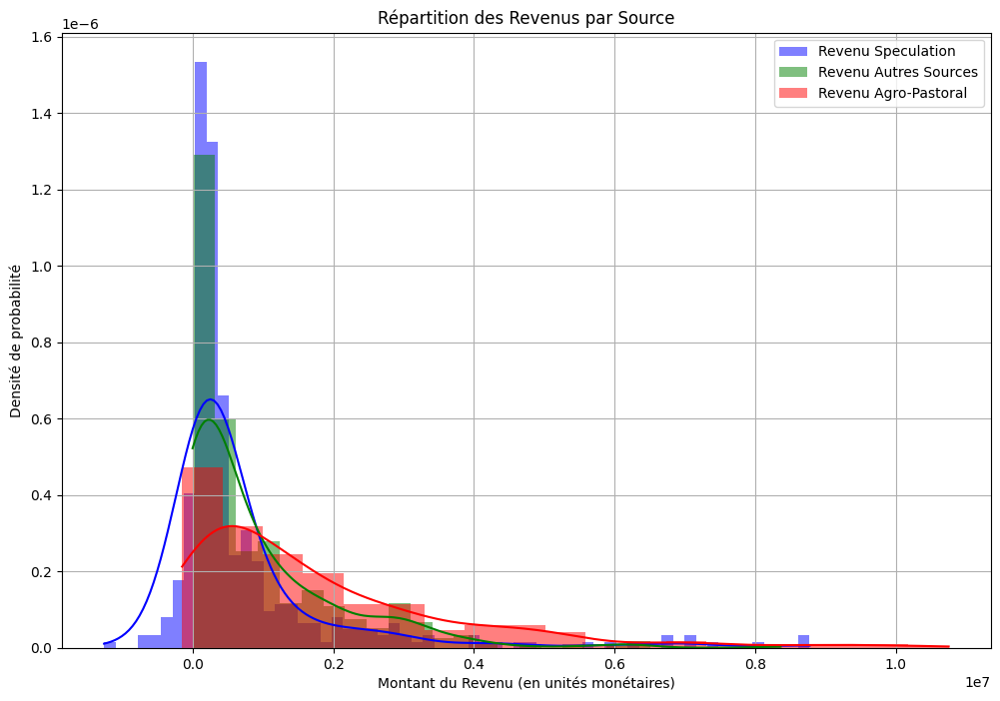

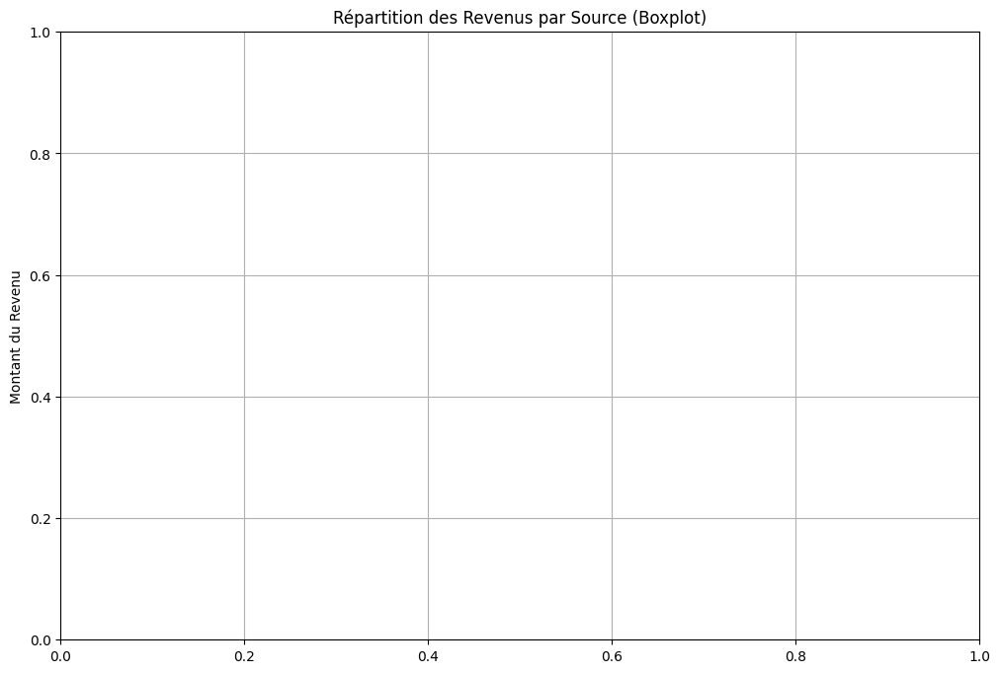

                       Revenu_speculation  Revenu_Autres_Sources  Revenu_Agro_Pastoral
Revenu_speculation                1.00000                0.38511               0.36570
Revenu_Autres_Sources             0.38511                1.00000               0.79195
Revenu_Agro_Pastoral              0.36570                0.79195               1.00000


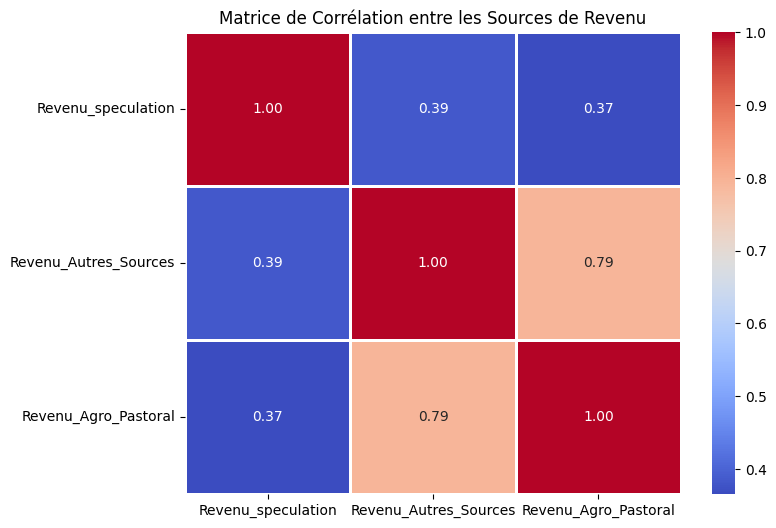

In [239]:
# Importer les bibliothèques nécessaires
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Nettoyer les données si nécessaire : traiter les valeurs manquantes
df = df.dropna(subset=['Revenu_speculation', 'Revenu_Autres_Sources', 'Revenu_Agro_Pastoral'])

# Résumer les statistiques descriptives des variables d'intérêt
print(df[['Revenu_speculation', 'Revenu_Autres_Sources', 'Revenu_Agro_Pastoral']].describe())

# Créer une nouvelle colonne pour la somme totale des revenus (pour une vue d'ensemble)
df['Revenu_total'] = df['Revenu_speculation'] + df['Revenu_Autres_Sources'] + df['Revenu_Agro_Pastoral']

# Visualisation de la répartition des revenus pour chaque source
plt.figure(figsize=(12, 8))

# Visualisation des revenus par source
sns.histplot(df['Revenu_speculation'], color='blue', kde=True, label='Revenu Speculation', stat='density', linewidth=0)
sns.histplot(df['Revenu_Autres_Sources'], color='green', kde=True, label='Revenu Autres Sources', stat='density', linewidth=0)
sns.histplot(df['Revenu_Agro_Pastoral'], color='red', kde=True, label='Revenu Agro-Pastoral', stat='density', linewidth=0)

# Ajouter une légende
plt.legend()

# Ajouter des titres et des labels
plt.title('Répartition des Revenus par Source')
plt.xlabel('Montant du Revenu (en unités monétaires)')
plt.ylabel('Densité de probabilité')
plt.grid(True)

# Afficher le graphique
plt.show()

# Boxplot pour visualiser les distributions des revenus par source
plt.figure(figsize=(12, 8))
sns.boxplot(df=df[['Revenu_speculation', 'Revenu_Autres_Sources', 'Revenu_Agro_Pastoral']])
plt.title('Répartition des Revenus par Source (Boxplot)')
plt.ylabel('Montant du Revenu')
plt.grid(True)

# Afficher le graphique
plt.show()

# Corrélation entre les différentes sources de revenu
corr_matrix = df[['Revenu_speculation', 'Revenu_Autres_Sources', 'Revenu_Agro_Pastoral']].corr()

# Afficher la matrice de corrélation
print(corr_matrix)

# Heatmap de la corrélation entre les sources de revenu
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=1, cbar=True)
plt.title('Matrice de Corrélation entre les Sources de Revenu')
plt.show()


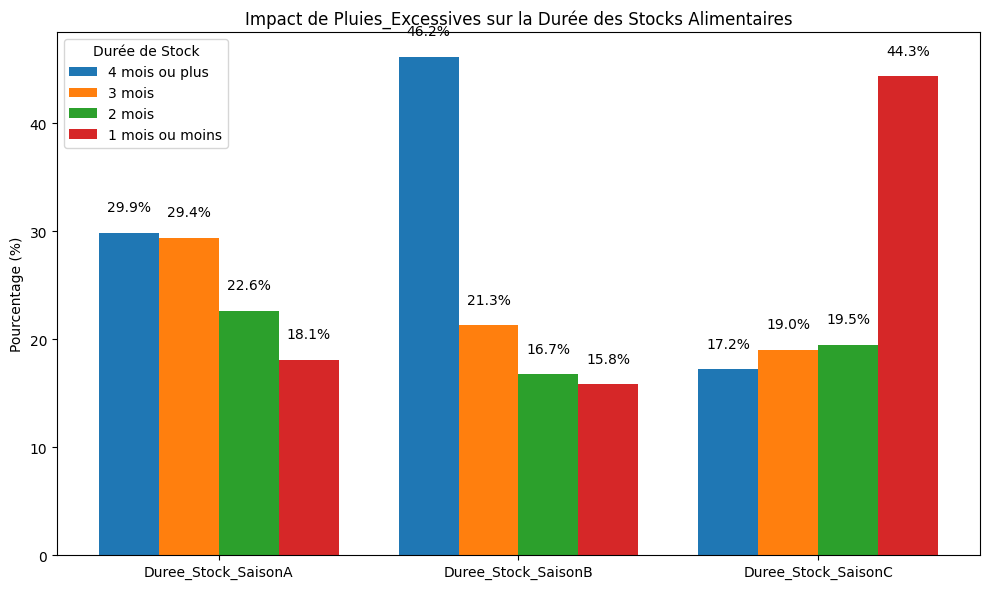

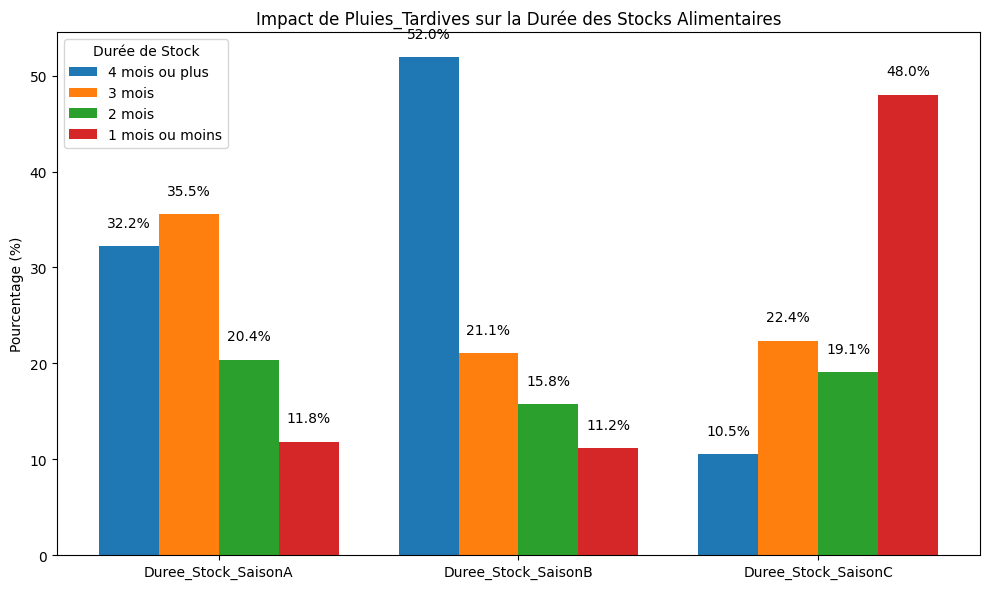

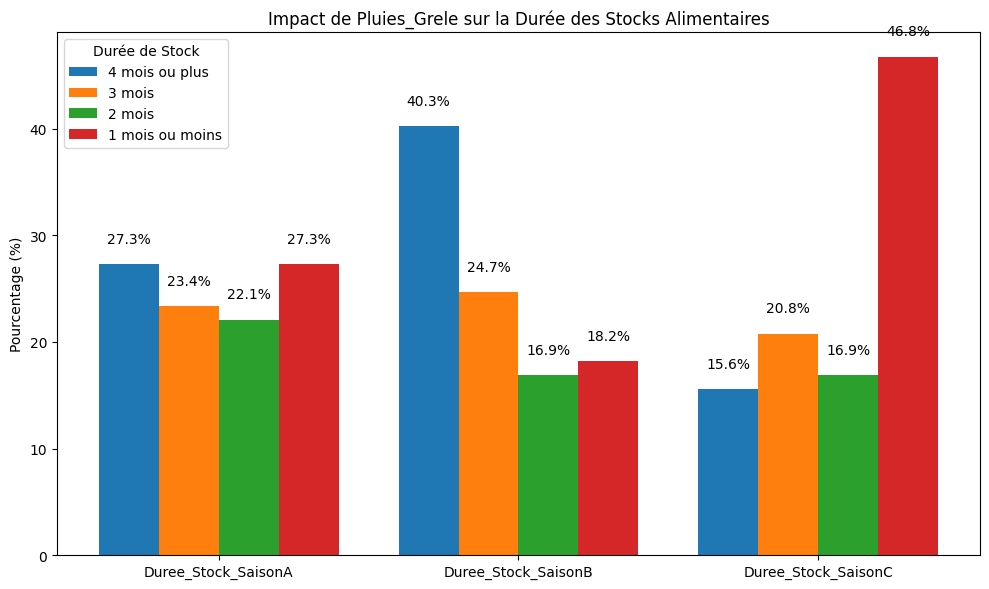

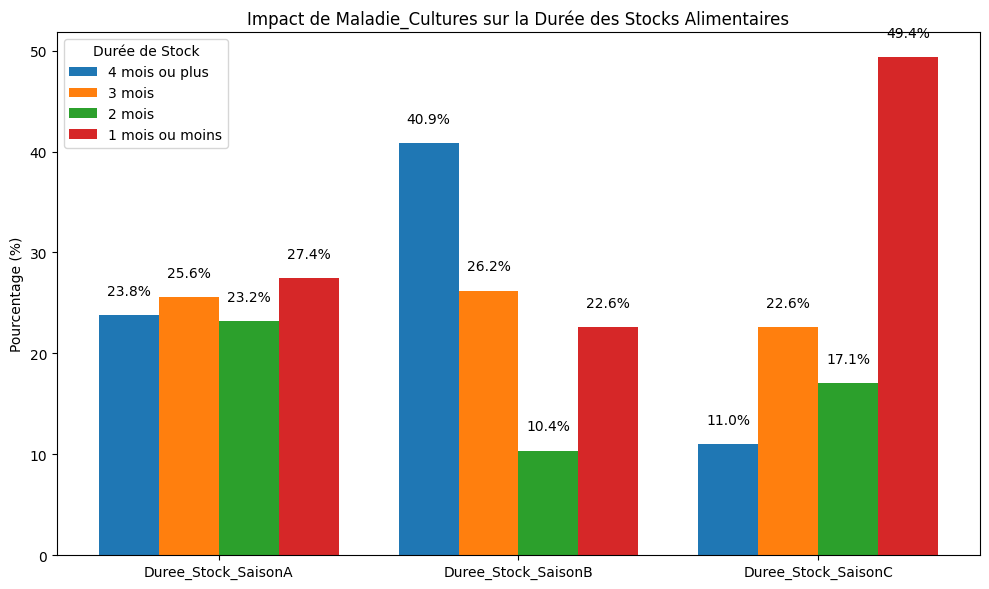

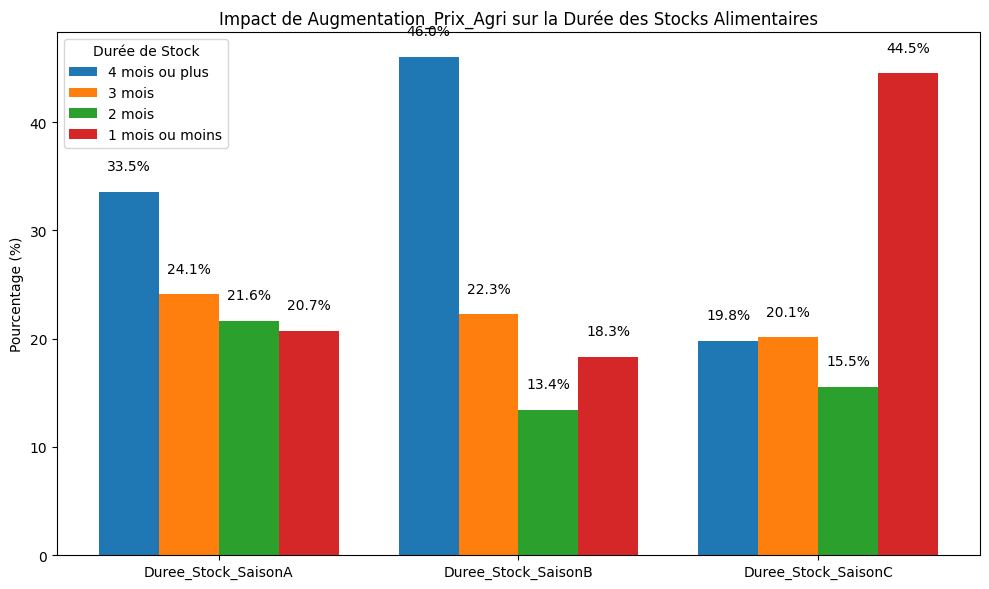

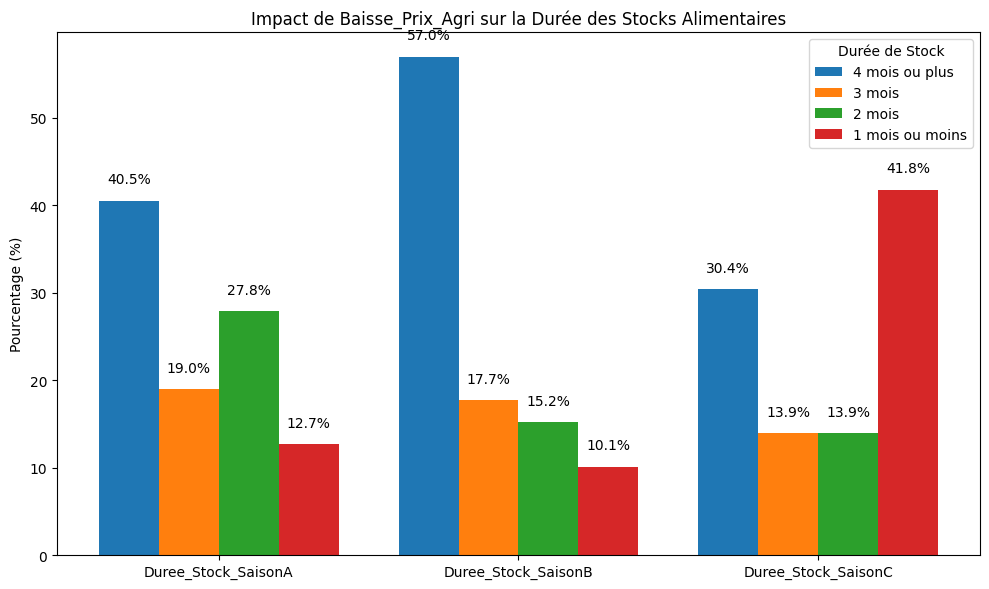

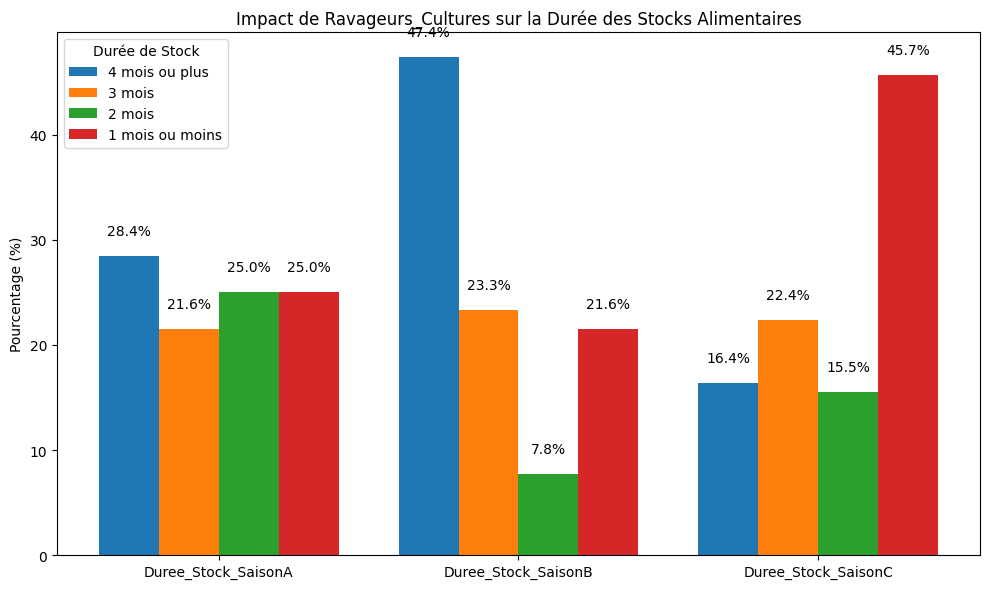

In [240]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Supposons que les données sont dans un DataFrame pandas appelé `df`

# Liste des chocs à analyser
chocs = ['Pluies_Excessives', 'Pluies_Tardives', 'Pluies_Grele', 
         'Maladie_Cultures', 'Augmentation_Prix_Agri', 'Baisse_Prix_Agri', 
         'Ravageurs_Cultures']

# Liste des saisons de stockage
saisons = ['Duree_Stock_SaisonA', 'Duree_Stock_SaisonB', 'Duree_Stock_SaisonC']

# Définir les modalités pour la durée des stocks
modalites_stock = {1: "4 mois ou plus", 2: "3 mois", 3: "2 mois", 4: "1 mois ou moins"}

# Fonction pour analyser l'impact d'un choc sur la durée des stocks
def analyser_choc(choc):
    data_list = []  # Renommée pour éviter la confusion avec le DataFrame global df
    for saison in saisons:
        # Calculer la distribution des durées de stock pour chaque valeur du choc (0 ou 1)
        temp = df[df[choc] == 1][saison].value_counts(normalize=True).reindex([1, 2, 3, 4], fill_value=0)
        data_list.append(temp)
    
    # Convertir les données en DataFrame
    data = pd.DataFrame(data_list, index=saisons).T * 100  # Pourcentage
    
    return data

# Créer une figure pour chaque choc
for choc in chocs:
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Analyser l'impact du choc
    data = analyser_choc(choc)  # Utiliser une variable différente que df
    
    # Créer un diagramme en barres groupées
    x = np.arange(len(saisons))  # Positions des groupes
    width = 0.2  # Largeur des barres
    
    bars = []
    for i, modalite in enumerate(data.index):
        bars.append(ax.bar(x + i * width, data.loc[modalite], width, label=modalites_stock[modalite]))
    
    # Ajouter les pourcentages au-dessus des barres
    def add_labels(bars_list):
        for bar_group in bars_list:
            for bar in bar_group:
                height = bar.get_height()
                ax.text(bar.get_x() + bar.get_width() / 2, height + 2, 
                        f'{height:.1f}%', ha='center', fontsize=10)
    
    add_labels(bars)
    
    # Configurer les axes et les étiquettes
    ax.set_xticks(x + width * (len(data.index) - 1) / 2)
    ax.set_xticklabels(saisons)
    ax.set_ylabel('Pourcentage (%)')
    ax.set_title(f'Impact de {choc} sur la Durée des Stocks Alimentaires')
    ax.legend(title="Durée de Stock")
    
    plt.tight_layout()
    plt.show()

In [244]:
import pandas as pd

# Liste des chocs à analyser
chocs = ['Pluies_Excessives', 'Pluies_Tardives', 'Pluies_Grele', 
         'Maladie_Cultures', 'Augmentation_Prix_Agri', 'Baisse_Prix_Agri', 
         'Ravageurs_Cultures']

# Liste des saisons de stockage
saisons = ['Duree_Stock_SaisonA', 'Duree_Stock_SaisonB', 'Duree_Stock_SaisonC']

# Définir les modalités pour la durée des stocks
modalites_stock = {1: "4 mois ou plus", 2: "3 mois", 3: "2 mois", 4: "1 mois ou moins"}

# Fonction pour analyser l'impact d'un choc sur la durée des stocks
def analyser_choc(choc):
    data_list = []  # Renommée pour éviter la confusion avec le DataFrame global df
    for saison in saisons:
        # Calculer la distribution des durées de stock pour chaque valeur du choc (0 ou 1)
        temp = df[df[choc] == 1][saison].value_counts(normalize=True).reindex([1, 2, 3, 4], fill_value=0)
        data_list.append(temp)
    
    # Convertir les données en DataFrame
    result_df = pd.DataFrame(data_list, index=saisons).T * 100  # Pourcentage
    
    return result_df

# Créer un DataFrame combiné pour tous les chocs
resultats = {}
for choc in chocs:
    resultats[choc] = analyser_choc(choc)

# Fusionner les résultats dans un seul DataFrame
combined_df = pd.concat(resultats, axis=1)

# Réorganiser les colonnes pour avoir une structure lisible
combined_df.columns = combined_df.columns.swaplevel(0, 1)  # Inverser les niveaux des colonnes
combined_df = combined_df.sort_index(axis=1, level=0)  # Trier les colonnes par saison

# Afficher le tableau final
print("Tableau de l'Impact des Chocs sur la Durée des Stocks Alimentaires par Saison")
print("Modalités de Durée des Stocks :")
for key, value in modalites_stock.items():
    print(f"  {key}: {value}")

# Renommer les lignes pour meilleure lisibilité
combined_df.index = [modalites_stock[key] for key in combined_df.index]

# Afficher le DataFrame final
print("\nTableau Final :")
print(combined_df)

Tableau de l'Impact des Chocs sur la Durée des Stocks Alimentaires par Saison
Modalités de Durée des Stocks :
  1: 4 mois ou plus
  2: 3 mois
  3: 2 mois
  4: 1 mois ou moins

Tableau Final :
                   Duree_Stock_SaisonA                                                                                                        Duree_Stock_SaisonB                                                                                                        Duree_Stock_SaisonC                                                                                                    
                Augmentation_Prix_Agri Baisse_Prix_Agri Maladie_Cultures Pluies_Excessives Pluies_Grele Pluies_Tardives Ravageurs_Cultures Augmentation_Prix_Agri Baisse_Prix_Agri Maladie_Cultures Pluies_Excessives Pluies_Grele Pluies_Tardives Ravageurs_Cultures Augmentation_Prix_Agri Baisse_Prix_Agri Maladie_Cultures Pluies_Excessives Pluies_Grele Pluies_Tardives Ravageurs_Cultures
4 mois ou plus                33.53659

In [245]:
import pandas as pd

# Liste des chocs à analyser
chocs = ['Pluies_Excessives', 'Pluies_Tardives', 'Pluies_Grele', 
         'Maladie_Cultures', 'Augmentation_Prix_Agri', 'Baisse_Prix_Agri', 
         'Ravageurs_Cultures']

# Liste des saisons de stockage
saisons = ['Duree_Stock_SaisonA', 'Duree_Stock_SaisonB', 'Duree_Stock_SaisonC']

# Définir les modalités pour la durée des stocks
modalites_stock = {1: "4 mois ou plus", 2: "3 mois", 3: "2 mois", 4: "1 mois ou moins"}

# Fonction pour analyser l'impact d'un choc sur la durée des stocks
def analyser_choc(choc):
    data_list = []  # Renommée pour éviter la confusion avec le DataFrame global df
    for saison in saisons:
        # Calculer la distribution des durées de stock pour chaque valeur du choc (0 ou 1)
        temp = df[df[choc] == 1][saison].value_counts(normalize=True).reindex([1, 2, 3, 4], fill_value=0)
        data_list.append(temp)
    
    # Convertir les données en DataFrame
    result_df = pd.DataFrame(data_list, index=saisons).T * 100  # Pourcentage
    
    return result_df

# Créer un DataFrame combiné pour tous les chocs
resultats = {}
for choc in chocs:
    resultats[choc] = analyser_choc(choc)

# Fusionner les résultats dans un seul DataFrame
combined_df = pd.concat(resultats, axis=1)

# Réorganiser les colonnes pour avoir une structure lisible
combined_df.columns = combined_df.columns.swaplevel(0, 1)  # Inverser les niveaux des colonnes
combined_df = combined_df.sort_index(axis=1, level=0)  # Trier les colonnes par saison

# Transposer le DataFrame pour faciliter la lecture
transposed_df = combined_df.T

# Renommer les indices pour meilleure lisibilité
transposed_df.index = [f"{choc} - {saison}" for choc, saison in transposed_df.index]

# Afficher le tableau final transposé
print("Tableau Transposé de l'Impact des Chocs sur la Durée des Stocks Alimentaires par Saison")
print("Modalités de Durée des Stocks :")
for key, value in modalites_stock.items():
    print(f"  {key}: {value}")

print("\nTableau Final Transposé :")
print(transposed_df)

Tableau Transposé de l'Impact des Chocs sur la Durée des Stocks Alimentaires par Saison
Modalités de Durée des Stocks :
  1: 4 mois ou plus
  2: 3 mois
  3: 2 mois
  4: 1 mois ou moins

Tableau Final Transposé :
                                                    1        2        3        4
Duree_Stock_SaisonA - Augmentation_Prix_Agri 33.53659 24.08537 21.64634 20.73171
Duree_Stock_SaisonA - Baisse_Prix_Agri       40.50633 18.98734 27.84810 12.65823
Duree_Stock_SaisonA - Maladie_Cultures       23.78049 25.60976 23.17073 27.43902
Duree_Stock_SaisonA - Pluies_Excessives      29.86425 29.41176 22.62443 18.09955
Duree_Stock_SaisonA - Pluies_Grele           27.27273 23.37662 22.07792 27.27273
Duree_Stock_SaisonA - Pluies_Tardives        32.23684 35.52632 20.39474 11.84211
Duree_Stock_SaisonA - Ravageurs_Cultures     28.44828 21.55172 25.00000 25.00000
Duree_Stock_SaisonB - Augmentation_Prix_Agri 46.03659 22.25610 13.41463 18.29268
Duree_Stock_SaisonB - Baisse_Prix_Agri       56.96203 17.72

In [246]:
import pandas as pd

# Liste des chocs à analyser
chocs = ['Pluies_Excessives', 'Pluies_Tardives', 'Pluies_Grele', 
         'Maladie_Cultures', 'Augmentation_Prix_Agri', 'Baisse_Prix_Agri', 
         'Ravageurs_Cultures']

# Liste des saisons de stockage
saisons = ['Duree_Stock_SaisonA', 'Duree_Stock_SaisonB', 'Duree_Stock_SaisonC']

# Définir les modalités pour la durée des stocks
modalites_stock = {1: "4 mois ou plus", 2: "3 mois", 3: "2 mois", 4: "1 mois ou moins"}

# Fonction pour analyser l'impact d'un choc sur la durée des stocks
def analyser_choc(choc):
    data_list = []  # Renommée pour éviter la confusion avec le DataFrame global df
    for saison in saisons:
        # Calculer la distribution des durées de stock pour chaque valeur du choc (0 ou 1)
        temp = df[df[choc] == 1][saison].value_counts(normalize=True).reindex([1, 2, 3, 4], fill_value=0)
        data_list.append(temp)
    
    # Convertir les données en DataFrame
    result_df = pd.DataFrame(data_list, index=saisons).T * 100  # Pourcentage
    
    return result_df

# Créer un DataFrame combiné pour tous les chocs
resultats = {}
for choc in chocs:
    resultats[choc] = analyser_choc(choc)

# Fusionner les résultats dans un seul DataFrame
combined_df = pd.concat(resultats, axis=1)

# Réorganiser les colonnes pour avoir une structure lisible
combined_df.columns = combined_df.columns.swaplevel(0, 1)  # Inverser les niveaux des colonnes
combined_df = combined_df.sort_index(axis=1, level=0)  # Trier les colonnes par saison

# Transposer le DataFrame pour faciliter la lecture
transposed_df = combined_df.T

# Renommer les indices pour meilleure lisibilité
transposed_df.index = [f"{choc} - {saison}" for choc, saison in transposed_df.index]

# Exporter le DataFrame transposé dans un fichier Excel
transposed_df.to_excel('impact_chocs_stocks.xlsx', sheet_name='Résultats', index_label="Choc et Saison")

# Message de confirmation
print("Le tableau a été exporté avec succès dans le fichier 'impact_chocs_stocks.xlsx'.")

Le tableau a été exporté avec succès dans le fichier 'impact_chocs_stocks.xlsx'.


In [249]:
import pandas as pd

# Liste des variables à croiser
variables = [
    'Ecart_RV_RR',  # 0 = revenu inférieur au revenu vital, 1 = revenu >= revenu vital
    'Strategie_Survie_Alimentaire',  # Score faible, modéré, élevé
    'Classement_SCA',  # Pauvre, Limites, Acceptable
    'Classement_CSI',  # CSI faible, modéré, élevé
    'Classement_SDA',  # Score faible, modéré, élevé
    'FIES_Score'  # Sécurité alimentaire totale, modérée, grave, très grave
]

# Fonction pour créer un tableau de contingence croisé
def croiser_variables(df, var1, var2):
    """Créer un tableau de contingence entre deux variables."""
    return pd.crosstab(df[var1], df[var2], normalize='index') * 100  # Pourcentage par ligne

# Créer un dictionnaire pour stocker tous les tableaux de contingence
tableaux_croises = {}

# Croiser chaque paire de variables
for i in range(len(variables)):
    for j in range(i + 1, len(variables)):
        var1, var2 = variables[i], variables[j]
        tableau = croiser_variables(df, var1, var2)
        tableaux_croises[(var1, var2)] = tableau

# Exporter les résultats dans un fichier Excel
with pd.ExcelWriter('segmentation_menages_vulnerabilite.xlsx') as writer:
    for (var1, var2), tableau in tableaux_croises.items():
        # Tronquer le nom de la feuille pour respecter la limite de 31 caractères
        feuille_nom = f"{var1[:10]}_vs_{var2[:10]}"  # Limiter chaque variable à 10 caractères
        feuille_nom = feuille_nom[:31]  # Assurer que le nom total ne dépasse pas 31 caractères
        tableau.to_excel(writer, sheet_name=feuille_nom)

# Afficher un message de confirmation
print("Les tableaux ont été exportés avec succès dans 'segmentation_menages_vulnerabilite.xlsx'.")

Les tableaux ont été exportés avec succès dans 'segmentation_menages_vulnerabilite.xlsx'.


C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\1075569066.py:40: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  tableau.T.plot(kind='pie', subplots=True, autopct='%1.1f%%', startangle=90,
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\1075569066.py:40: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  tableau.T.plot(kind='pie', subplots=True, autopct='%1.1f%%', startangle=90,
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\1075569066.py:40: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  tableau.T.plot(kind='pie', subplots=True, autopct='%1.1f%%', startangle=90,
C:\Users\Audace\AppData\Local\Temp\ipykernel_14584\1075569066.py:40: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  tableau.T.plot(kind='pie', subplots=True, autopct='%1.1f%%', startangle=90,
C:\Users\Audace\AppD

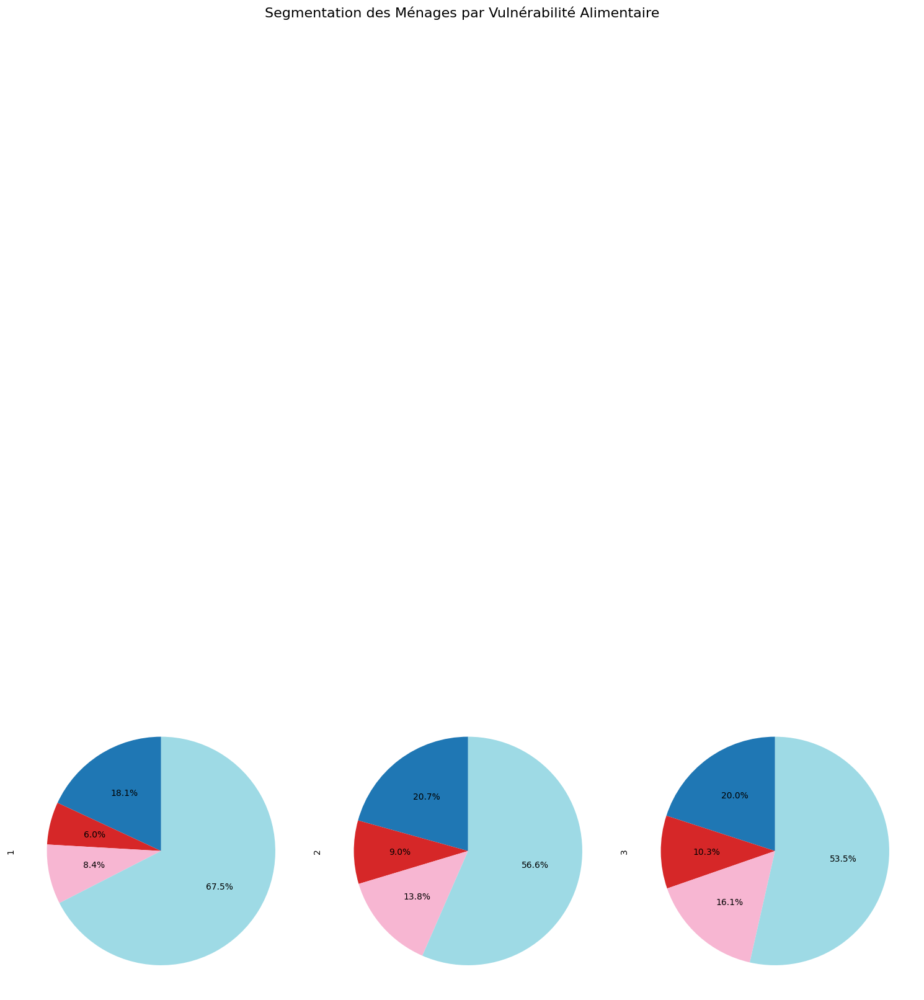

In [250]:
import pandas as pd
import matplotlib.pyplot as plt

# Liste des variables à croiser
variables = [
    'Ecart_RV_RR',  # 0 = revenu inférieur au revenu vital, 1 = revenu >= revenu vital
    'Strategie_Survie_Alimentaire',  # Score faible, modéré, élevé
    'Classement_SCA',  # Pauvre, Limites, Acceptable
    'Classement_CSI',  # CSI faible, modéré, élevé
    'Classement_SDA',  # Score faible, modéré, élevé
    'FIES_Score'  # Sécurité alimentaire totale, modérée, grave, très grave
]

# Fonction pour créer un tableau de contingence croisé
def croiser_variables(df, var1, var2):
    """Créer un tableau de contingence entre deux variables."""
    return pd.crosstab(df[var1], df[var2], normalize='index') * 100  # Pourcentage par ligne

# Créer un dictionnaire pour stocker tous les tableaux de contingence
tableaux_croises = {}

# Croiser chaque paire de variables
for i in range(len(variables)):
    for j in range(i + 1, len(variables)):
        var1, var2 = variables[i], variables[j]
        tableau = croiser_variables(df, var1, var2)
        tableaux_croises[(var1, var2)] = tableau

# Créer une figure avec plusieurs sous-graphiques
num_graphiques = len(tableaux_croises)
num_cols = 3  # Nombre de colonnes dans la grille
num_rows = (num_graphiques // num_cols) + (num_graphiques % num_cols > 0)  # Calcul du nombre de lignes

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
axes = axes.flatten()  # Aplatir le tableau des axes pour faciliter l'accès

# Tracer un graphique en secteurs pour chaque tableau croisé
for idx, ((var1, var2), tableau) in enumerate(tableaux_croises.items()):
    ax = axes[idx]
    tableau.T.plot(kind='pie', subplots=True, autopct='%1.1f%%', startangle=90, 
                   labels=None, legend=False, ax=ax, colormap='tab20')
    ax.set_title(f"{var1} vs {var2}", fontsize=10)
    ax.axis('equal')  # Assurer que les camemberts sont circulaires

    # Ajouter une légende personnalisée
    handles, labels = ax.get_legend_handles_labels()
    legend = ax.legend(handles, tableau.columns, title=var2, loc="center left", bbox_to_anchor=(1, 0.5))
    ax.add_artist(legend)

# Masquer les axes vides restants
for idx in range(num_graphiques, len(axes)):
    fig.delaxes(axes[idx])

# Ajuster l'espacement entre les graphiques
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.suptitle("Segmentation des Ménages par Vulnérabilité Alimentaire", fontsize=16, y=1.02)

# Afficher la figure
plt.show()

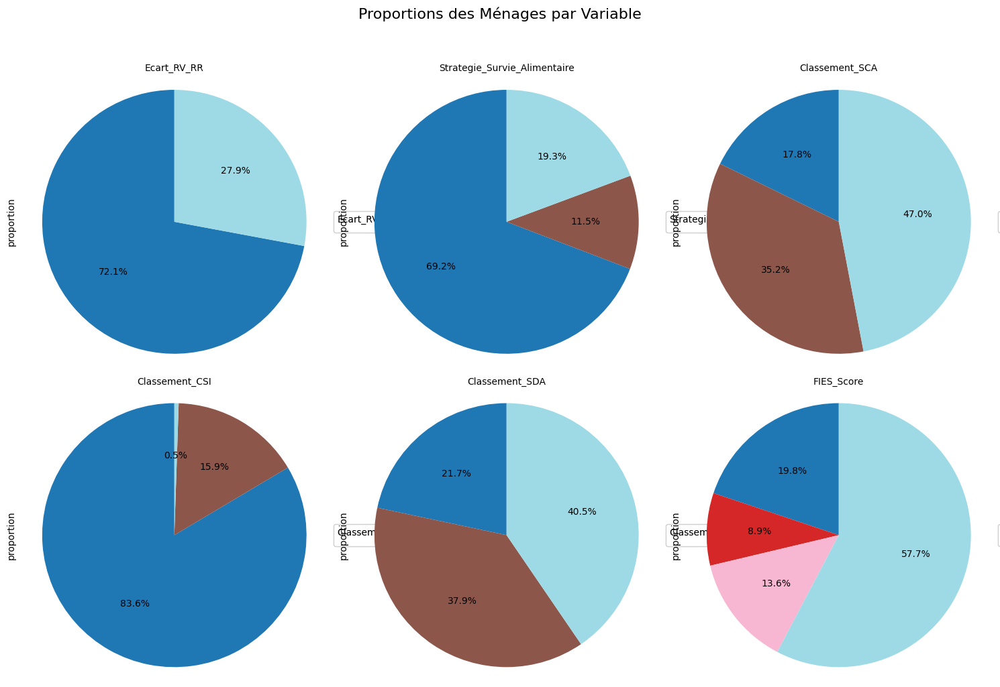

In [251]:
import pandas as pd
import matplotlib.pyplot as plt

# Liste des variables à analyser
variables = [
    'Ecart_RV_RR',  # 0 = revenu inférieur au revenu vital, 1 = revenu >= revenu vital
    'Strategie_Survie_Alimentaire',  # Score faible, modéré, élevé
    'Classement_SCA',  # Pauvre, Limites, Acceptable
    'Classement_CSI',  # CSI faible, modéré, élevé
    'Classement_SDA',  # Score faible, modéré, élevé
    'FIES_Score'  # Sécurité alimentaire totale, modérée, grave, très grave
]

# Créer une figure avec plusieurs sous-graphiques
num_graphiques = len(variables)
num_cols = 3  # Nombre de colonnes dans la grille
num_rows = (num_graphiques // num_cols) + (num_graphiques % num_cols > 0)  # Calcul du nombre de lignes

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
axes = axes.flatten()  # Aplatir le tableau des axes pour faciliter l'accès

# Tracer un graphique en secteurs pour chaque variable
for idx, var in enumerate(variables):
    ax = axes[idx]
    
    # Calculer les proportions pour la variable
    counts = df[var].value_counts(normalize=True) * 100
    
    # Trier les catégories par ordre alphabétique ou numérique
    counts = counts.sort_index()
    
    # Créer le graphique en secteurs
    counts.plot(kind='pie', autopct='%1.1f%%', startangle=90, labels=None, 
                legend=False, ax=ax, colormap='tab20')
    
    # Ajouter un titre pour chaque graphique
    ax.set_title(var, fontsize=10)
    ax.axis('equal')  # Assurer que les camemberts sont circulaires
    
    # Ajouter une légende personnalisée
    handles, labels = ax.get_legend_handles_labels()
    legend = ax.legend(handles, counts.index, title=var, loc="center left", bbox_to_anchor=(1, 0.5))
    ax.add_artist(legend)

# Masquer les axes vides restants (si nécessaire)
for idx in range(num_graphiques, len(axes)):
    fig.delaxes(axes[idx])

# Ajuster l'espacement entre les graphiques
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.suptitle("Proportions des Ménages par Variable", fontsize=16, y=1.02)

# Afficher la figure
plt.show()

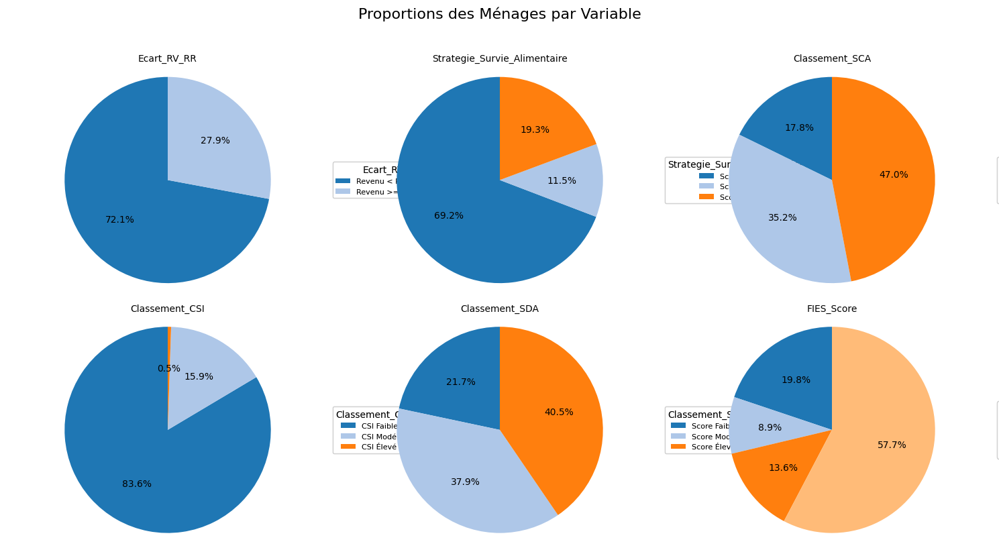

In [252]:
import pandas as pd
import matplotlib.pyplot as plt

# Liste des variables à analyser
variables = [
    'Ecart_RV_RR',  # 0 = revenu inférieur au revenu vital, 1 = revenu >= revenu vital
    'Strategie_Survie_Alimentaire',  # Score faible, modéré, élevé
    'Classement_SCA',  # Pauvre, Limites, Acceptable
    'Classement_CSI',  # CSI faible, modéré, élevé
    'Classement_SDA',  # Score faible, modéré, élevé
    'FIES_Score'  # Sécurité alimentaire totale, modérée, grave, très grave
]

# Définition des modalités pour chaque variable
modalites = {
    'Ecart_RV_RR': {0: "Revenu < Revenu Vital", 1: "Revenu >= Revenu Vital"},
    'Strategie_Survie_Alimentaire': {1: "Score Faible", 2: "Score Modéré", 3: "Score Élevé"},
    'Classement_SCA': {1: "Pauvre", 2: "Limites", 3: "Acceptable"},
    'Classement_CSI': {1: "CSI Faible", 2: "CSI Modéré", 3: "CSI Élevé"},
    'Classement_SDA': {1: "Score Faible", 2: "Score Modéré", 3: "Score Élevé"},
    'FIES_Score': {1: "Sécurité Alimentaire Totale", 2: "Insécurité Modérée", 
                   3: "Insécurité Grave", 4: "Insécurité Très Grave"}
}

# Créer une figure avec plusieurs sous-graphiques
num_graphiques = len(variables)
num_cols = 3  # Nombre de colonnes dans la grille
num_rows = (num_graphiques // num_cols) + (num_graphiques % num_cols > 0)  # Calcul du nombre de lignes

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 4 * num_rows))  # Réduire légèrement la hauteur
axes = axes.flatten()  # Aplatir le tableau des axes pour faciliter l'accès

# Tracer un graphique en secteurs pour chaque variable
for idx, var in enumerate(variables):
    ax = axes[idx]
    
    # Calculer les proportions pour la variable
    counts = df[var].value_counts(normalize=True) * 100
    
    # Trier les catégories par ordre alphabétique ou numérique
    counts = counts.sort_index()
    
    # Mapper les indices aux modalités personnalisées
    labels = [modalites[var].get(idx, str(idx)) for idx in counts.index]
    
    # Créer le graphique en secteurs
    ax.pie(counts, autopct='%1.1f%%', startangle=90, labels=None, 
           colors=plt.cm.tab20.colors[:len(counts)])  # Utiliser une palette de couleurs
    
    # Ajouter un titre pour chaque graphique
    ax.set_title(var, fontsize=10)
    ax.axis('equal')  # Assurer que les camemberts sont circulaires
    
    # Ajouter une légende personnalisée avec les modalités
    legend = ax.legend(labels, title=var, loc="center left", bbox_to_anchor=(1, 0.5), fontsize=8)
    ax.add_artist(legend)

# Masquer les axes vides restants (si nécessaire)
for idx in range(num_graphiques, len(axes)):
    fig.delaxes(axes[idx])

# Ajuster l'espacement entre les graphiques
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.suptitle("Proportions des Ménages par Variable", fontsize=16, y=1.02)

# Afficher la figure
plt.show()

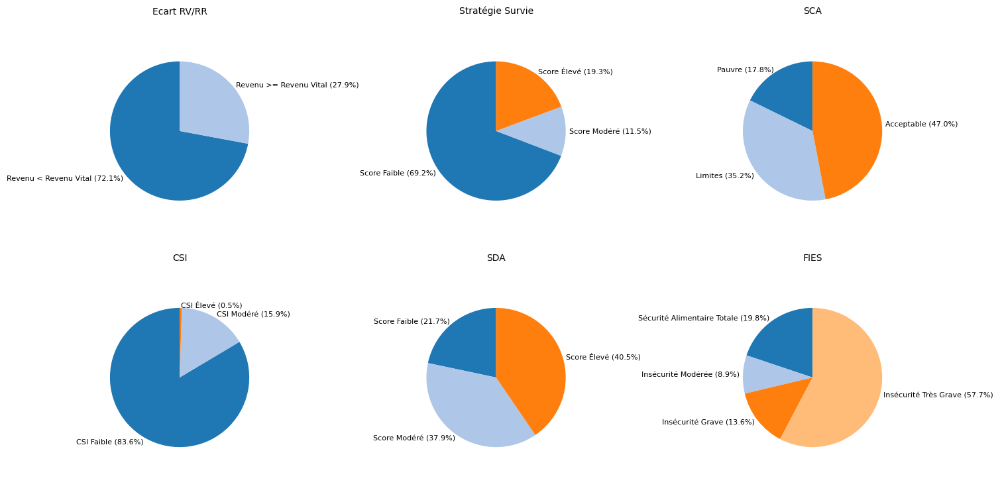

In [254]:
import pandas as pd
import matplotlib.pyplot as plt

# Liste des variables à analyser
variables = [
    'Ecart_RV_RR',  # 0 = revenu inférieur au revenu vital, 1 = revenu >= revenu vital
    'Strategie_Survie_Alimentaire',  # Score faible, modéré, élevé
    'Classement_SCA',  # Pauvre, Limites, Acceptable
    'Classement_CSI',  # CSI faible, modéré, élevé
    'Classement_SDA',  # Score faible, modéré, élevé
    'FIES_Score'  # Sécurité alimentaire totale, modérée, grave, très grave
]

# Définition des modalités pour chaque variable
modalites = {
    'Ecart_RV_RR': {0: "Revenu < Revenu Vital", 1: "Revenu >= Revenu Vital"},
    'Strategie_Survie_Alimentaire': {1: "Score Faible", 2: "Score Modéré", 3: "Score Élevé"},
    'Classement_SCA': {1: "Pauvre", 2: "Limites", 3: "Acceptable"},
    'Classement_CSI': {1: "CSI Faible", 2: "CSI Modéré", 3: "CSI Élevé"},
    'Classement_SDA': {1: "Score Faible", 2: "Score Modéré", 3: "Score Élevé"},
    'FIES_Score': {1: "Sécurité Alimentaire Totale", 2: "Insécurité Modérée", 
                   3: "Insécurité Grave", 4: "Insécurité Très Grave"}
}

# Renommer les titres pour simplification
titres_simplifies = {
    'Ecart_RV_RR': "Ecart RV/RR",
    'Strategie_Survie_Alimentaire': "Stratégie Survie",
    'Classement_SCA': "SCA",
    'Classement_CSI': "CSI",
    'Classement_SDA': "SDA",
    'FIES_Score': "FIES"
}

# Créer une figure avec plusieurs sous-graphiques
num_graphiques = len(variables)
num_cols = 3  # Nombre de colonnes dans la grille
num_rows = (num_graphiques // num_cols) + (num_graphiques % num_cols > 0)  # Calcul du nombre de lignes

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 4 * num_rows))  # Réduire légèrement la hauteur
axes = axes.flatten()  # Aplatir le tableau des axes pour faciliter l'accès

# Tracer un graphique en secteurs pour chaque variable
for idx, var in enumerate(variables):
    ax = axes[idx]
    
    # Calculer les proportions pour la variable
    counts = df[var].value_counts(normalize=True) * 100
    
    # Trier les catégories par ordre alphabétique ou numérique
    counts = counts.sort_index()
    
    # Mapper les indices aux modalités personnalisées avec pourcentage
    labels = [f"{modalites[var].get(idx, str(idx))} ({val:.1f}%)" for idx, val in zip(counts.index, counts)]
    
    # Créer le graphique en secteurs
    ax.pie(counts, autopct='', startangle=90, labels=labels, 
           colors=plt.cm.tab20.colors[:len(counts)], labeldistance=1.05, textprops={'fontsize': 8})
    
    # Ajouter un titre simplifié pour chaque graphique
    ax.set_title(titres_simplifies[var], fontsize=10)
    ax.axis('equal')  # Assurer que les camemberts sont circulaires

# Masquer les axes vides restants (si nécessaire)
for idx in range(num_graphiques, len(axes)):
    fig.delaxes(axes[idx])

# Ajuster l'espacement entre les graphiques
plt.tight_layout(rect=[0, 0, 1, 0.95])


# Afficher la figure
plt.show()